<table align="left" width=100%>
    <tr>
        <td>
            <div align="center">
                <font color="darkblue" size=6px>
                  <b> Capstone Project <br>Olist Store E-Commerce Sales Forecasting </b>
                </font>
            </div>
        </td>
    </tr>
</table>

**This dataset comprises Brazilian e-commerce orders from the Olist Store, totaling 100,000 orders spanning from 2016 to 2018. It encompasses various dimensions of each order, including status, price, payment, freight performance, customer location, product attributes, and customer reviews. Additionally, a geolocation dataset has been provided, linking Brazilian zip codes to latitude and longitude coordinates. The data has been anonymized for commercial purposes, with references to companies and partners replaced by names of Game of Thrones great houses.**

* **Objective: Sales Forecasting**

    This project aims to leverage purchase date information for forecasting future sales trend and also suggest potential ways to increase sales

1. **olist_customers_dataset**
2. **olist_geolocation_dataset**
3. **olist_order_items_dataset**
4. **olist_order_payments_dataset**
5. **olist_order_reviews_dataset**
6. **olist_orders_dataset**
7. **olist_products_dataset**
8. **olist_sellers_dataset**
9. **product_category_name_translation**

# Table of Content

1. **[Data Introduction](#)**

    1a. **[Importing fundamental libraries](#libraries)**
    
    1b. **[Table -Shapes](#Table_Shape)**
    
    1c. **[Importing Datasets](#Importing_Datasets)**
    
    1d. **[Merging](#Merging_Tables)**
    

2. **[Final - Shape](#Final_Shape)**

4


<a id='Libraries'></a>
<div align='left'>
    <font color='indigo' , size = 5px>
        <b> 1.1 Libraries Importing </b>
    </font>
</div>

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



from statsmodels.tsa.stattools import adfuller

from warnings import filterwarnings
filterwarnings("ignore")

<a id='Import'></a>
<div align='left'>
    <font color='indigo' , size = 5px>
        <b> 1.2 Data Importing </b>
    </font>
</div>

### MySQL Connector Setup

In [3]:
#! pip install mysql-connector-python

In [4]:
#import mysql.connector  #importing mysql-connector 

### Create Connection

In [5]:
#host #user #password
#mysqlconnection = mysql.connector.connect(host= "localhost",user= "root",password= '12345' ,database="olist" )

### Retrieving Data from OList Database 

In [6]:
#mycursor = mysqlconnection.cursor()

In [7]:
#mycursor.execute("SELECT * FROM olist_final")

In [8]:
#table = mycursor.fetchall()

In [9]:
df_olist = pd.read_csv('capstonedata.csv')
pd.set_option('display.max_columns', None)
# Just created a copy of column , which can be used later
df_olist_copy =df_olist.copy()


df_olist.head()

,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_id,customer_zip_code_prefix,customer_city,customer_state,customer_lat,customer_lng,seller_id,shipping_limit_date,price,freight_value,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,seller_zip_code_prefix,seller_city,seller_state,seller_lat,seller_lng
0,00010242fe8c5a6d1ba2dd792cb16214,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00,5.0,72.19,3ce436f183e68e07877b285a838db11a,28013,campos dos goytacazes,RJ,-21.758679,-41.300240,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,4244733e06e7ecb4970a6e2683c13e61,cool_stuff,58,598,4,650.0,28.0,9.0,14.0,cool_stuff,27277,volta redonda,SP,-22.498183,-44.123614
1,00018f77f2f0320c557190d7a144bdd3,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15 00:00:00,4.0,259.83,f6dd3ec061db4e3987629fe6b26e5cce,15775,santa fe do sul,SP,-20.216537,-50.926688,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,e5f2d52b802189ee658865ca93d83a8f,pet_shop,56,239,2,30000.0,50.0,30.0,40.0,pet_shop,3471,sao paulo,SP,-23.563590,-46.515620
2,000229ec398224ef6ca0657da4fc703e,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05 00:00:00,5.0,216.87,6489ae5e4333f3693df5ad4372dab6d3,35661,para de minas,MG,-19.918485,-44.584906,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,c777355d18b72b67abbeef9df44fd0fd,moveis_decoracao,59,695,2,3050.0,33.0,13.0,33.0,furniture_decor,37564,borda da mata,MG,-22.265723,-46.165525
3,00024acbcdf0a6daa1e931b038114c75,delivered,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20 00:00:00,4.0,25.78,d4eb9395c8c0431ee92fce09860c5a06,12952,atibaia,SP,-23.047478,-46.674795,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,7634da152a4610f1595efa32f14722fc,perfumaria,42,480,1,200.0,16.0,10.0,15.0,perfumery,14403,franca,SP,-20.542234,-47.378964
4,00042b26cf59d7ce69dfabb4e55b4fd9,delivered,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17 00:00:00,5.0,218.04,58dbd0b2d70206bf40e62cd34e84d795,13226,varzea paulista,SP,-23.249008,-46.824961,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,ac6c3623068f30de03045865e4e10089,ferramentas_jardim,59,409,1,3750.0,35.0,40.0,30.0,garden_tools,87900,loanda,PR,-22.927128,-53.148630


In [10]:
df_olist.shape

(96744, 34)

In [11]:
df_olist.columns

Index(['order_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'review_score', 'sales', 'customer_id', 'customer_zip_code_prefix',
       'customer_city', 'customer_state', 'customer_lat', 'customer_lng',
       'seller_id', 'shipping_limit_date', 'price', 'freight_value',
       'product_id', 'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'product_category_name_english', 'seller_zip_code_prefix',
       'seller_city', 'seller_state', 'seller_lat', 'seller_lng'],
      dtype='object')

<a id='data_types'></a>
<div align='left'>
    <font color='indigo' , size = 5px>
        <b> 1.3 Verifying and Adjusting Data Types  </b>
    </font>
</div>

In [12]:
df_olist.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96744 entries, 0 to 96743
Data columns (total 34 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   order_id                       96744 non-null  object 
 1   order_status                   96744 non-null  object 
 2   order_purchase_timestamp       96744 non-null  object 
 3   order_approved_at              96731 non-null  object 
 4   order_delivered_carrier_date   95774 non-null  object 
 5   order_delivered_customer_date  94625 non-null  object 
 6   order_estimated_delivery_date  96744 non-null  object 
 7   review_score                   96008 non-null  float64
 8   sales                          96744 non-null  float64
 9   customer_id                    96744 non-null  object 
 10  customer_zip_code_prefix       96744 non-null  int64  
 11  customer_city                  96744 non-null  object 
 12  customer_state                 96744 non-null 

In [13]:
df_olist['order_purchase_timestamp'] = pd.to_datetime(df_olist['order_purchase_timestamp'])
df_olist['order_approved_at'] = pd.to_datetime(df_olist['order_approved_at'])
df_olist['order_delivered_carrier_date'] = pd.to_datetime(df_olist['order_delivered_carrier_date'])
df_olist['order_delivered_customer_date'] = pd.to_datetime(df_olist['order_delivered_customer_date'])
df_olist['order_estimated_delivery_date'] = pd.to_datetime(df_olist['order_estimated_delivery_date'])
df_olist['shipping_limit_date'] = pd.to_datetime(df_olist['shipping_limit_date'])

In [14]:
# Datetime
df_olist.select_dtypes(include=np.datetime64).dtypes

order_purchase_timestamp         datetime64[ns]
order_approved_at                datetime64[ns]
order_delivered_carrier_date     datetime64[ns]
order_delivered_customer_date    datetime64[ns]
order_estimated_delivery_date    datetime64[ns]
shipping_limit_date              datetime64[ns]
dtype: object

In [15]:
# Numerical 
df_olist.select_dtypes(include=np.number).dtypes

review_score                  float64
sales                         float64
customer_zip_code_prefix        int64
customer_lat                  float64
customer_lng                  float64
price                         float64
freight_value                 float64
product_name_lenght             int64
product_description_lenght      int64
product_photos_qty              int64
product_weight_g              float64
product_length_cm             float64
product_height_cm             float64
product_width_cm              float64
seller_zip_code_prefix          int64
seller_lat                    float64
seller_lng                    float64
dtype: object

In [16]:
#Categorical
df_olist.select_dtypes(include=object).dtypes

order_id                         object
order_status                     object
customer_id                      object
customer_city                    object
customer_state                   object
seller_id                        object
product_id                       object
product_category_name            object
product_category_name_english    object
seller_city                      object
seller_state                     object
dtype: object

* **We can see that few columns are in object but in actual they need to be in numerical so lets change those**

In [17]:
tonumerical= ['sales', 'customer_lat', 'customer_lng',  'price','freight_value','seller_lat', 'seller_lng']

In [18]:
#changing the data types which are acutually numerical
df_olist[tonumerical]=df_olist[tonumerical].astype(float)

In [19]:
df_olist.dtypes

order_id                                 object
order_status                             object
order_purchase_timestamp         datetime64[ns]
order_approved_at                datetime64[ns]
order_delivered_carrier_date     datetime64[ns]
order_delivered_customer_date    datetime64[ns]
order_estimated_delivery_date    datetime64[ns]
review_score                            float64
sales                                   float64
customer_id                              object
customer_zip_code_prefix                  int64
customer_city                            object
customer_state                           object
customer_lat                            float64
customer_lng                            float64
seller_id                                object
shipping_limit_date              datetime64[ns]
price                                   float64
freight_value                           float64
product_id                               object
product_category_name                   

<a id="Null"></a>
<div align='left'>
    <font color='indigo' , size = 5px>
        <b> 2.2 Desciptive_Statistics </b>
    </font>
</div>

<div align='left'>
    <font color='indigo' , size = 3px>
        <b> 2.2 A Numerical - 5 Point Summary </b>
    </font>
</div>

In [20]:
df_olist.describe().T

,count,mean,min,25%,50%,75%,max,std
order_purchase_timestamp,96744,2018-01-01 16:01:50.014843392,2016-09-04 21:15:19,2017-09-13 16:34:15,2018-01-20 21:27:15.500000,2018-05-05 23:47:41.249999872,2018-09-03 09:06:57,NaN
order_approved_at,96731,2018-01-02 03:24:00.139738112,2016-10-04 09:43:32,2017-09-14 02:16:56,2018-01-22 13:52:24,2018-05-06 16:23:02,2018-09-03 17:40:06,NaN
order_delivered_carrier_date,95774,2018-01-05 15:31:32.012258304,2016-10-08 10:34:01,2017-09-18 18:53:56.500000,2018-01-24 22:25:42,2018-05-08 19:02:00,2018-09-11 19:48:28,NaN
order_delivered_customer_date,94625,2018-01-15 05:24:48.711968256,2016-10-11 13:46:32,2017-09-26 19:10:25,2018-02-03 17:32:43,2018-05-16 19:06:30,2018-10-17 13:22:46,NaN
order_estimated_delivery_date,96744,2018-01-25 10:36:10.181096448,2016-10-20 00:00:00,2017-10-04 00:00:00,2018-02-16 00:00:00,2018-05-28 00:00:00,2018-10-25 00:00:00,NaN
review_score,96008.0,4.107147,1.0,4.0,5.0,5.0,5.0,1.329342
sales,96744.0,160.817846,9.59,62.01,105.28,177.43,13664.08,220.640186
customer_zip_code_prefix,96744.0,35063.833282,1003.0,11335.0,24350.0,58397.25,99980.0,29773.266234
customer_lat,96744.0,-21.19366,-34.586422,-23.589237,-22.926909,-20.132887,42.184003,5.612662
customer_lng,96744.0,-46.170727,-72.674101,-48.094971,-46.630841,-43.606374,-6.898559,4.057817


#### Order Timestamps (purchase, approval, carrier, customer, and estimated delivery):

* All order timestamps have a count of 96744 entries, indicating no missing values in these columns.
* The mean values for these timestamps range from January 1, 2018, to January 25, 2018, suggesting that orders are distributed relatively evenly across this time period.
* The minimum and maximum values for these timestamps indicate the earliest and latest order dates in the dataset.
* The 25th, 50th (median), and 75th percentiles provide insights into the distribution of order timestamps throughout the dataset's time range.

#### Review Score:

* The review score has a count of 96008 entries, suggesting some missing values in this column.
* The mean review score is approximately 4.11, indicating a generally positive sentiment among customers.
* The minimum and maximum review scores are 1.0 and 5.0, respectively, with quartile values indicating the spread of review scores within the dataset.

#### Sales, Price, and Freight Value:

* Sales, price, and freight value have counts of 96744 entries, indicating no missing values in these columns.
* The mean sales value is approximately 160.82, with a significant standard deviation of 220.64, suggesting a wide range of sales amounts.
* Prices range from 0.85 to 6735.0, while freight values range from 0.0 to 409.68, indicating variability in pricing and shipping costs.

#### Customer and Seller Information (zip code, latitude, and longitude):

* Customer and seller information columns have counts of 96744 entries, indicating no missing values in these columns.
* Customer zip codes range from 1003 to 99980, while seller zip codes range from 1001 to 99730.
* Latitude and longitude values for both customers and sellers show geographical distribution, with varying ranges and means.

#### Product Information (name length, description length, photos quantity, weight, dimensions):

* Product-related columns have counts of 96744 entries, indicating no missing values in these columns.
* Product name lengths range from 5 to 76 characters, while description lengths range from 4 to 3992 characters, indicating varying levels of detail.
* The quantity of product photos ranges from 1 to 20, with mean dimensions (weight, length, height, width) showing variability across products.

<div align='left'>
    <font color='indigo' , size = 3px>
        <b> 2.2 B Categorical </b>
    </font>
</div>

In [21]:
df_olist.describe(include=object).T

,count,unique,top,freq
order_id,96744,96744,00010242fe8c5a6d1ba2dd792cb16214,1
order_status,96744,7,delivered,94627
customer_id,96744,96744,3ce436f183e68e07877b285a838db11a,1
customer_city,96744,4045,sao paulo,15114
customer_state,96744,27,SP,40696
seller_id,96744,3016,6560211a19b47992c3666cc44a7e94c0,1838
product_id,96744,31178,99a4788cb24856965c36a24e339b6058,438
product_category_name,96744,71,cama_mesa_banho,9293
product_category_name_english,96744,71,bed_bath_table,9293
seller_city,96744,604,sao paulo,24044


#### Order Information:

* Order ID: There are 96744 unique order IDs, indicating no duplicate orders in the dataset. Each order ID occurs only once.
* Order Status: The dataset contains 7 unique order statuses, with "delivered" being the most frequent status, occurring 94627 times.

#### Customer Information:

* Customer ID: There are 96744 unique customer IDs, indicating that each customer in the dataset has a distinct ID. Each customer ID occurs only once.
* Customer City: There are 4045 unique customer cities in the dataset, with "Sao Paulo" being the most frequent city, occurring 15114 times.
* Customer State: There are 27 unique customer states in the dataset, with "SP" (Sao Paulo) being the most frequent state, occurring 40696 times.

#### Seller Information:

* Seller ID: There are 3016 unique seller IDs in the dataset, indicating multiple sellers involved in the orders. The most frequent seller ID occurs 1838 times.
* Seller City: There are 604 unique seller cities in the dataset, with "Sao Paulo" being the most frequent city among sellers, occurring 24044 times.
* Seller State: There are 23 unique seller states in the dataset, with "SP" (Sao Paulo) being the most frequent state among sellers, occurring 68592 times.

#### Product Information:

* Product ID: There are 31178 unique product IDs in the dataset, indicating a wide variety of products. The most frequent product ID occurs 438 times.
* Product Category Name: There are 71 unique product categories in the dataset, with "cama_mesa_banho" (bed, bath, and table) being the most frequent category, occurring 9293 times.
* Product Category Name (English): The English version of product categories aligns with the original categories, with "bed_bath_table" being the most frequent translated category, occurring 9293 times.

<a id="Unwanted_features "></a>
<div align='left'>
    <font color='darkblue' , size = 5px>
        <b> 4.1 Removing Unwanted Features & Correcting other Errors </b>
    </font>
</div>

In [22]:
removecolumns= ["customer_id"  , "seller_id"   , "product_id" , "product_category_name",'order_id', 'customer_lat','customer_lng','price','freight_value','product_name_lenght','product_description_lenght','product_photos_qty','product_weight_g','product_length_cm','product_height_cm','product_width_cm','seller_lat','seller_lng', 'seller_zip_code_prefix']

In [23]:
df_olist=df_olist.drop(columns=removecolumns)
df_olist

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state
0,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,72.19,28013,campos dos goytacazes,RJ,2017-09-19 09:45:35,cool_stuff,volta redonda,SP
1,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,259.83,15775,santa fe do sul,SP,2017-05-03 11:05:13,pet_shop,sao paulo,SP
2,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,216.87,35661,para de minas,MG,2018-01-18 14:48:30,furniture_decor,borda da mata,MG
3,delivered,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20,4.0,25.78,12952,atibaia,SP,2018-08-15 10:10:18,perfumery,franca,SP
4,delivered,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17,5.0,218.04,13226,varzea paulista,SP,2017-02-13 13:57:51,garden_tools,loanda,PR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96739,delivered,2018-04-23 13:57:06,2018-04-25 04:11:01,2018-04-25 12:09:00,2018-05-10 22:56:40,2018-05-18,5.0,343.40,65077,sao luis,MA,2018-05-02 04:11:01,housewares,itajai,SC
96740,delivered,2018-07-14 10:26:46,2018-07-17 04:31:48,2018-07-17 08:05:00,2018-07-23 20:31:55,2018-08-01,5.0,386.53,81690,curitiba,PR,2018-07-20 04:31:48,computers_accessories,sao paulo,SP
96741,delivered,2017-10-23 17:07:56,2017-10-24 17:14:25,2017-10-26 15:13:14,2017-10-28 12:22:22,2017-11-10,5.0,116.85,4039,sao paulo,SP,2017-10-30 17:14:25,sports_leisure,curitiba,PR
96742,delivered,2017-08-14 23:02:59,2017-08-15 00:04:32,2017-08-15 19:02:53,2017-08-16 21:59:40,2017-08-25,5.0,64.71,13289,vinhedo,SP,2017-08-21 00:04:32,computers_accessories,sao paulo,SP


In [24]:
df_olist.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96744 entries, 0 to 96743
Data columns (total 15 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_status                   96744 non-null  object        
 1   order_purchase_timestamp       96744 non-null  datetime64[ns]
 2   order_approved_at              96731 non-null  datetime64[ns]
 3   order_delivered_carrier_date   95774 non-null  datetime64[ns]
 4   order_delivered_customer_date  94625 non-null  datetime64[ns]
 5   order_estimated_delivery_date  96744 non-null  datetime64[ns]
 6   review_score                   96008 non-null  float64       
 7   sales                          96744 non-null  float64       
 8   customer_zip_code_prefix       96744 non-null  int64         
 9   customer_city                  96744 non-null  object        
 10  customer_state                 96744 non-null  object        
 11  shipping_limit_

## Dates Sequence
* Step 1 : Order Placement: Customer places an order (order_purchase_timestamp).
    * Estimated Delivery Date: Expected date of delivery (order_estimated_delivery_date).
* Step 2 :Order Approval: Order is approved (order_approved_at).
* Step 3 :Order Shipment: Order is handed over to carrier (order_delivered_carrier_date).
* Step 4 :Order Delivery: Order is delivered to customer (order_delivered_customer_date).

* **It appears that there's a discrepancy in the  order of certain date fields within the dataset. For instance, the order_purchase_timestamp should precede the order_approved_at field consistently. However, in some instances, this order seems to be reversed. Similar inconsistencies have been noted for other date fields such as order_delivered_carrier_date and order_delivered_customer_date.**

## Step 1

### order_delivered_customer_date

#### meaning show me all the value which occur before  order_delivered_customer_date wrt to order_delivered_carrier_date and both the columns should not be null

In [25]:
df_olist[ (df_olist["order_delivered_carrier_date"]>df_olist["order_delivered_customer_date"]) &(~df_olist["order_delivered_carrier_date"].isnull() ) 
& (~df_olist["order_delivered_customer_date"].isnull() )  ]

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state
3506,delivered,2017-07-11 10:45:44,2017-07-11 10:55:15,2017-07-14 12:41:34,2017-07-12 20:49:42,2017-08-14,1.0,249.09,4726,sao paulo,SP,2017-07-17 10:55:15,bed_bath_table,poa,SP
9804,delivered,2016-10-07 17:09:56,2016-10-07 17:32:09,2016-10-26 11:42:05,2016-10-20 19:07:54,2016-12-01,5.0,212.32,35300,caratinga,MG,2016-10-11 17:32:10,furniture_decor,ibitinga,SP
10857,delivered,2017-08-07 21:35:22,2017-08-08 21:45:15,2017-08-10 18:28:56,2017-08-10 18:05:38,2017-08-25,2.0,151.46,8810,mogi das cruzes,SP,2017-08-14 21:45:15,toys,atibaia,SP
15584,delivered,2017-05-29 16:16:50,2017-05-29 16:25:16,2017-06-09 15:07:29,2017-06-02 11:09:16,2017-06-23,5.0,320.79,16790,bento de abreu,SP,2017-06-02 16:25:16,computers_accessories,porto alegre,RS
21156,delivered,2017-07-02 20:58:43,2017-07-02 21:10:20,2017-07-07 17:22:41,2017-07-06 14:27:51,2017-07-21,1.0,111.24,33600,pedro leopoldo,MG,2017-07-06 21:10:20,furniture_decor,uba,MG
23687,delivered,2017-07-07 11:22:13,2017-07-07 12:25:07,2017-07-11 18:15:40,2017-07-11 17:41:26,2017-07-20,5.0,54.92,3693,sao paulo,SP,2017-07-13 12:25:07,auto,sao paulo,SP
44640,delivered,2016-10-07 10:05:16,2016-10-07 11:24:43,2016-10-26 11:43:06,2016-10-20 18:03:17,2016-11-29,5.0,85.58,11025,santos,SP,2016-10-11 11:24:44,furniture_decor,ibitinga,SP
44919,delivered,2017-03-22 20:15:15,2017-03-22 20:15:15,2017-03-30 13:14:34,2017-03-28 17:28:32,2017-04-12,1.0,114.07,30330,belo horizonte,MG,2017-03-28 20:15:15,furniture_decor,uba,MG
52861,delivered,2016-10-08 15:36:50,2016-10-08 18:13:44,2016-10-26 11:41:53,2016-10-25 17:51:46,2016-11-30,3.0,249.72,11730,mongagua,SP,2016-10-12 18:13:45,furniture_decor,ibitinga,SP
57697,delivered,2017-08-07 16:36:51,2017-08-07 17:20:06,2017-08-12 00:03:35,2017-08-10 21:22:31,2017-09-05,1.0,386.93,88802,criciuma,SC,2017-08-11 17:20:06,home_confort,osasco,SP


#### Taking difference of the delivered vs carrier(shipped) date

In [26]:
df_olist["temp_diff_delivered_carrier_temp"]= np.abs(df_olist["order_delivered_customer_date"]-df_olist["order_delivered_carrier_date"])+ pd.to_timedelta("1 day")
df_olist.head(3)

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,temp_diff_delivered_carrier_temp
0,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,72.19,28013,campos dos goytacazes,RJ,2017-09-19 09:45:35,cool_stuff,volta redonda,SP,2 days 05:09:32
1,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,259.83,15775,santa fe do sul,SP,2017-05-03 11:05:13,pet_shop,sao paulo,SP,9 days 01:29:24
2,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,216.87,35661,para de minas,MG,2018-01-18 14:48:30,furniture_decor,borda da mata,MG,7 days 00:42:28


#### Here we are adding the date difference with carrier date so that delivered date comes after the item is shipped

In [27]:
df_olist["order_delivered_customer_date"] = np.where( (df_olist["order_delivered_carrier_date"]>df_olist["order_delivered_customer_date"]) &(~df_olist["order_delivered_carrier_date"].isnull() ) 
& (~df_olist["order_delivered_customer_date"].isnull() ) , df_olist["order_delivered_carrier_date"]+df_olist["temp_diff_delivered_carrier_temp"],
df_olist["order_delivered_customer_date"])

df_olist.head(3)

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,temp_diff_delivered_carrier_temp
0,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,72.19,28013,campos dos goytacazes,RJ,2017-09-19 09:45:35,cool_stuff,volta redonda,SP,2 days 05:09:32
1,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,259.83,15775,santa fe do sul,SP,2017-05-03 11:05:13,pet_shop,sao paulo,SP,9 days 01:29:24
2,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,216.87,35661,para de minas,MG,2018-01-18 14:48:30,furniture_decor,borda da mata,MG,7 days 00:42:28


In [28]:
df_olist.drop(columns=[ "temp_diff_delivered_carrier_temp" ] , inplace=True)

In [29]:
df_olist[ (df_olist["order_delivered_carrier_date"]>df_olist["order_delivered_customer_date"]) &(~df_olist["order_delivered_carrier_date"].isnull() ) 
& (~df_olist["order_delivered_customer_date"].isnull() )  ]

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state


## Step 2

#### order_delivered_carrier_date

* This indicates that besides filling `null value treatment`, we also must update the date when the `order approval date` exceeds the `delivered carrier date`, since it's impossible for the `carrier delivery date` to occur before an `order is approved`.

In [30]:
df_olist[df_olist["order_approved_at"]>df_olist["order_delivered_carrier_date"]].head(3)

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state
7,delivered,2018-07-04 12:08:27,2018-07-05 16:35:48,2018-07-05 12:15:00,2018-07-09 14:04:07,2018-07-25,5.0,880.75,11702,praia grande,SP,2018-07-10 12:30:45,garden_tools,presidente prudente,SP
50,delivered,2018-04-22 12:13:25,2018-04-24 17:24:48,2018-04-23 19:03:19,2018-05-02 20:38:44,2018-05-14,4.0,123.11,14802,araraquara,SP,2018-04-26 12:30:57,audio,sao paulo,SP
61,delivered,2018-07-23 17:26:00,2018-07-28 23:30:59,2018-07-24 15:53:00,2018-08-11 01:48:33,2018-08-14,5.0,57.17,52041,recife,PE,2018-07-26 17:44:36,telephony,sao paulo,SP


##### so lets create a temporary column to store the value of order_delivered_carrier_date

In [31]:
df_olist["order_delivered_carrier_date_temp"] = df_olist["order_delivered_carrier_date"]
df_olist.head(3)

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,order_delivered_carrier_date_temp
0,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,72.19,28013,campos dos goytacazes,RJ,2017-09-19 09:45:35,cool_stuff,volta redonda,SP,2017-09-19 18:34:16
1,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,259.83,15775,santa fe do sul,SP,2017-05-03 11:05:13,pet_shop,sao paulo,SP,2017-05-04 14:35:00
2,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,216.87,35661,para de minas,MG,2018-01-18 14:48:30,furniture_decor,borda da mata,MG,2018-01-16 12:36:48


In [32]:
df_olist["order_delivered_carrier_date"]=np.where(  (df_olist["order_approved_at"]>df_olist["order_delivered_carrier_date"]  ) &  (~df_olist["order_delivered_carrier_date"].isnull()) ,
         df_olist["order_approved_at"], df_olist["order_delivered_carrier_date"]  )

In [33]:
df_olist[df_olist["order_approved_at"]==df_olist["order_delivered_carrier_date"]].head(3)

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,order_delivered_carrier_date_temp
7,delivered,2018-07-04 12:08:27,2018-07-05 16:35:48,2018-07-05 16:35:48,2018-07-09 14:04:07,2018-07-25,5.0,880.75,11702,praia grande,SP,2018-07-10 12:30:45,garden_tools,presidente prudente,SP,2018-07-05 12:15:00
50,delivered,2018-04-22 12:13:25,2018-04-24 17:24:48,2018-04-24 17:24:48,2018-05-02 20:38:44,2018-05-14,4.0,123.11,14802,araraquara,SP,2018-04-26 12:30:57,audio,sao paulo,SP,2018-04-23 19:03:19
61,delivered,2018-07-23 17:26:00,2018-07-28 23:30:59,2018-07-28 23:30:59,2018-08-11 01:48:33,2018-08-14,5.0,57.17,52041,recife,PE,2018-07-26 17:44:36,telephony,sao paulo,SP,2018-07-24 15:53:00


In [34]:
df_olist["order_approved_at"]= np.where( (df_olist["order_approved_at"]==df_olist["order_delivered_carrier_date"] )
                                          &  (~df_olist["order_delivered_carrier_date"].isnull()), df_olist["order_delivered_carrier_date_temp"],
                                       df_olist["order_approved_at"])
df_olist.head(3)

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,order_delivered_carrier_date_temp
0,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,72.19,28013,campos dos goytacazes,RJ,2017-09-19 09:45:35,cool_stuff,volta redonda,SP,2017-09-19 18:34:16
1,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,259.83,15775,santa fe do sul,SP,2017-05-03 11:05:13,pet_shop,sao paulo,SP,2017-05-04 14:35:00
2,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,216.87,35661,para de minas,MG,2018-01-18 14:48:30,furniture_decor,borda da mata,MG,2018-01-16 12:36:48


In [35]:
df_olist[df_olist["order_approved_at"]>df_olist["order_delivered_carrier_date"]]

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,order_delivered_carrier_date_temp


* **We can see that the sequence of dates have been corrected i.e `order_approved_at` does not have any dates that occur after `order_delivered_carrier_date`**

In [36]:
#lets drop the temporary column which we created intially 
df_olist.drop(columns="order_delivered_carrier_date_temp", inplace=True)

## Step 3

#### order_approved_at

In [37]:

df_olist[ (df_olist["order_purchase_timestamp"]>df_olist["order_approved_at"] )& (~df_olist["order_approved_at"].isnull() )    ]

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state
301,delivered,2018-06-11 12:24:48,2018-06-11 12:05:00,2018-06-11 13:32:18,2018-06-18 16:51:52,2018-06-28,5.0,872.52,30350,belo horizonte,MG,2018-06-13 12:57:03,small_appliances,sao caetano do sul,SP
486,delivered,2018-05-15 15:13:06,2018-05-15 14:58:00,2018-05-15 15:34:59,2018-05-23 18:13:16,2018-06-07,5.0,240.41,8253,sao paulo,SP,2018-05-17 15:30:57,stationery,carazinho,RS
1689,delivered,2018-08-08 13:18:36,2018-08-08 12:19:00,2018-08-08 13:30:15,2018-08-13 22:10:52,2018-08-29,4.0,175.41,36123,simao pereira,MG,2018-08-14 13:30:15,housewares,baependi,MG
3026,delivered,2018-08-06 09:17:53,2018-08-06 08:44:00,2018-08-06 09:30:16,2018-08-09 16:40:37,2018-08-16,4.0,76.92,12705,cruzeiro,SP,2018-08-08 09:30:16,health_beauty,sao paulo,SP
3296,delivered,2018-06-27 11:16:44,2018-06-27 10:57:00,2018-06-27 11:30:56,2018-06-29 17:39:53,2018-07-18,5.0,166.09,38413,uberlandia,MG,2018-06-29 11:30:21,housewares,betim,MG
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95519,delivered,2018-08-16 16:28:13,2018-08-16 16:27:00,2018-08-16 16:49:04,2018-08-20 19:54:47,2018-09-03,5.0,103.19,5705,sao paulo,SP,2018-08-27 16:49:04,fashion_bags_accessories,ribeirao preto,SP
95764,delivered,2018-04-25 13:02:26,2018-04-25 12:36:00,2018-04-25 13:15:26,2018-05-08 16:32:17,2018-05-28,1.0,80.48,65930,acailandia,MA,2018-05-02 13:15:26,books_technical,sao paulo,SP
96071,delivered,2018-06-25 15:05:27,2018-06-25 14:08:00,2018-06-25 15:18:59,2018-07-03 20:10:15,2018-07-23,5.0,303.79,87710,paranavai,PR,2018-06-27 15:18:59,watches_gifts,formiga,MG
96654,delivered,2018-08-13 14:32:07,2018-08-13 13:55:00,2018-08-13 14:45:15,2018-08-14 23:58:57,2018-08-16,5.0,32.43,4112,sao paulo,SP,2018-08-15 14:45:15,auto,guarulhos,SP


##### so lets create a temporary column to store the value of order_purchase_timestamp_

In [38]:
df_olist["order_approved_at_temp"]=df_olist["order_approved_at"]
df_olist.head(3)

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,order_approved_at_temp
0,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,72.19,28013,campos dos goytacazes,RJ,2017-09-19 09:45:35,cool_stuff,volta redonda,SP,2017-09-13 09:45:35
1,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,259.83,15775,santa fe do sul,SP,2017-05-03 11:05:13,pet_shop,sao paulo,SP,2017-04-26 11:05:13
2,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,216.87,35661,para de minas,MG,2018-01-18 14:48:30,furniture_decor,borda da mata,MG,2018-01-14 14:48:30


#### from order_purchase_timestamp values  to order_approved_at

In [39]:
df_olist["order_approved_at"]=np.where(   (df_olist["order_purchase_timestamp"]>df_olist["order_approved_at"] )& (~df_olist["order_approved_at"].isnull() )  , 
  df_olist["order_purchase_timestamp"]  , df_olist["order_approved_at"]                         )

In [40]:

df_olist[ (df_olist["order_purchase_timestamp"]>df_olist["order_approved_at_temp"] )& (~df_olist["order_approved_at_temp"].isnull() )    ].head(3)

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,order_approved_at_temp
301,delivered,2018-06-11 12:24:48,2018-06-11 12:24:48,2018-06-11 13:32:18,2018-06-18 16:51:52,2018-06-28,5.0,872.52,30350,belo horizonte,MG,2018-06-13 12:57:03,small_appliances,sao caetano do sul,SP,2018-06-11 12:05:00
486,delivered,2018-05-15 15:13:06,2018-05-15 15:13:06,2018-05-15 15:34:59,2018-05-23 18:13:16,2018-06-07,5.0,240.41,8253,sao paulo,SP,2018-05-17 15:30:57,stationery,carazinho,RS,2018-05-15 14:58:00
1689,delivered,2018-08-08 13:18:36,2018-08-08 13:18:36,2018-08-08 13:30:15,2018-08-13 22:10:52,2018-08-29,4.0,175.41,36123,simao pereira,MG,2018-08-14 13:30:15,housewares,baependi,MG,2018-08-08 12:19:00


#### from order_approved_at_temp  to  order_purchase_timestamp

In [41]:
df_olist["order_purchase_timestamp"]=np.where(   (df_olist["order_purchase_timestamp"]>df_olist["order_approved_at_temp"] )& (~df_olist["order_approved_at_temp"].isnull() )  , 
  df_olist["order_approved_at_temp"]  , df_olist["order_purchase_timestamp"]                         )

In [42]:
df_olist.drop(columns="order_approved_at_temp",inplace=True)

## Step 4  (Repeat step 1)

### order_delivered_carrier_date 
#### Redo (Note the dates have been changed as we have changed the other dependant dates so we are redoing the `order_delivered_carrier_date`)

* No alterations required. This implies that the order was delivered prior to the estimated date, which is actually favorable.

In [43]:
df_olist[df_olist["order_delivered_carrier_date"]>df_olist["order_delivered_customer_date"]]

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state
557,delivered,2017-09-01 20:04:28,2017-09-04 14:05:50,2017-09-13 22:17:15,2017-09-09 15:12:44,2017-09-20,5.0,91.16,14811,araraquara,SP,2017-09-07 22:31:42,housewares,ipaussu,SP
1672,delivered,2018-07-03 10:30:52,2018-07-03 13:12:00,2018-07-05 16:40:30,2018-07-04 22:42:41,2018-07-16,5.0,118.83,3433,sao paulo,SP,2018-07-05 11:31:12,construction_tools_construction,sao paulo,SP
5318,delivered,2018-07-02 16:16:03,2018-07-03 14:36:00,2018-07-05 16:25:45,2018-07-04 23:03:36,2018-07-17,5.0,136.79,6702,cotia,SP,2018-07-06 04:32:02,housewares,limeira,SP
6530,delivered,2018-01-29 17:26:51,2018-02-01 18:48:38,2018-02-03 23:31:58,2018-02-02 19:52:43,2018-02-14,5.0,117.86,7196,guarulhos,SP,2018-02-06 02:35:41,furniture_decor,santa barbara d'oeste,SP
9039,delivered,2018-04-20 20:22:34,2018-04-23 18:18:27,2018-04-24 19:10:37,2018-04-24 18:47:46,2018-05-10,5.0,15.77,4044,sao paulo,SP,2018-04-26 02:31:45,signaling_and_security,sorocaba,SP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92622,delivered,2018-07-02 09:29:17,2018-07-03 16:52:00,2018-07-05 16:15:52,2018-07-04 14:57:44,2018-07-16,5.0,97.79,11075,santos,SP,2018-07-09 07:31:20,toys,sao paulo,SP
93288,delivered,2017-06-26 12:23:32,2017-06-27 17:03:09,2017-07-05 17:09:11,2017-07-03 17:53:29,2017-07-18,5.0,79.20,4270,sao paulo,SP,2017-06-30 13:32:11,furniture_decor,curitiba,PR
94704,delivered,2018-07-22 13:07:02,2018-07-24 14:38:00,2018-07-27 23:30:58,2018-07-25 18:21:18,2018-07-31,5.0,51.27,8440,sao paulo,SP,2018-07-26 03:45:19,auto,sao paulo,SP
94741,delivered,2018-04-21 09:18:13,2018-04-23 23:35:37,2018-04-24 18:25:30,2018-04-24 15:28:41,2018-05-04,5.0,20.75,5805,sao paulo,SP,2018-04-26 09:30:40,computers_accessories,santos,SP


#### Taking difference of the delivered vs carrier(shipped) date

In [44]:
df_olist["temp_diff_delivered_carrier_temp"]= np.abs(df_olist["order_delivered_customer_date"]-df_olist["order_delivered_carrier_date"])+ pd.to_timedelta("1 day")
df_olist.head(3)

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,temp_diff_delivered_carrier_temp
0,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,72.19,28013,campos dos goytacazes,RJ,2017-09-19 09:45:35,cool_stuff,volta redonda,SP,2 days 05:09:32
1,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,259.83,15775,santa fe do sul,SP,2017-05-03 11:05:13,pet_shop,sao paulo,SP,9 days 01:29:24
2,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,216.87,35661,para de minas,MG,2018-01-18 14:48:30,furniture_decor,borda da mata,MG,7 days 00:42:28


#### Here we are adding the date difference with carrier date so that delivered date comes after the item is shipped

In [45]:
df_olist["order_delivered_customer_date"] = np.where( (df_olist["order_delivered_carrier_date"]>df_olist["order_delivered_customer_date"]) &(~df_olist["order_delivered_carrier_date"].isnull() ) 
& (~df_olist["order_delivered_customer_date"].isnull() ) , df_olist["order_delivered_carrier_date"]+df_olist["temp_diff_delivered_carrier_temp"],
df_olist["order_delivered_customer_date"])

df_olist.head(3)

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,temp_diff_delivered_carrier_temp
0,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,72.19,28013,campos dos goytacazes,RJ,2017-09-19 09:45:35,cool_stuff,volta redonda,SP,2 days 05:09:32
1,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,259.83,15775,santa fe do sul,SP,2017-05-03 11:05:13,pet_shop,sao paulo,SP,9 days 01:29:24
2,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,216.87,35661,para de minas,MG,2018-01-18 14:48:30,furniture_decor,borda da mata,MG,7 days 00:42:28


In [46]:
df_olist.drop(columns=[ "temp_diff_delivered_carrier_temp" ] , inplace=True)

* **We've adjusted all columns except for order_estimated_delivery_date to ensure that the dates are in the correct sequential order.**

<a id="Univariate_Analysis "></a>
<div align='left'>
    <font color='darkblue' , size = 5px>
        <b> 5.1 Univariate_Analysis </b>
    </font>
</div>

<a id="Categorical "></a>
<div align='left'>
    <font color='darkblue' , size = 4px>
        <b> 5.1 A. Categorical </b>
    </font>
</div>

In [47]:
df_olist.describe(include=object).columns

Index(['order_status', 'customer_city', 'customer_state',
       'product_category_name_english', 'seller_city', 'seller_state'],
      dtype='object')

In [48]:
category_columns= ['order_status', 'customer_city', 'customer_state',
       'product_category_name_english', 'seller_city', 'seller_state']   #'order_id' Excluded

In [49]:
len(category_columns)

6

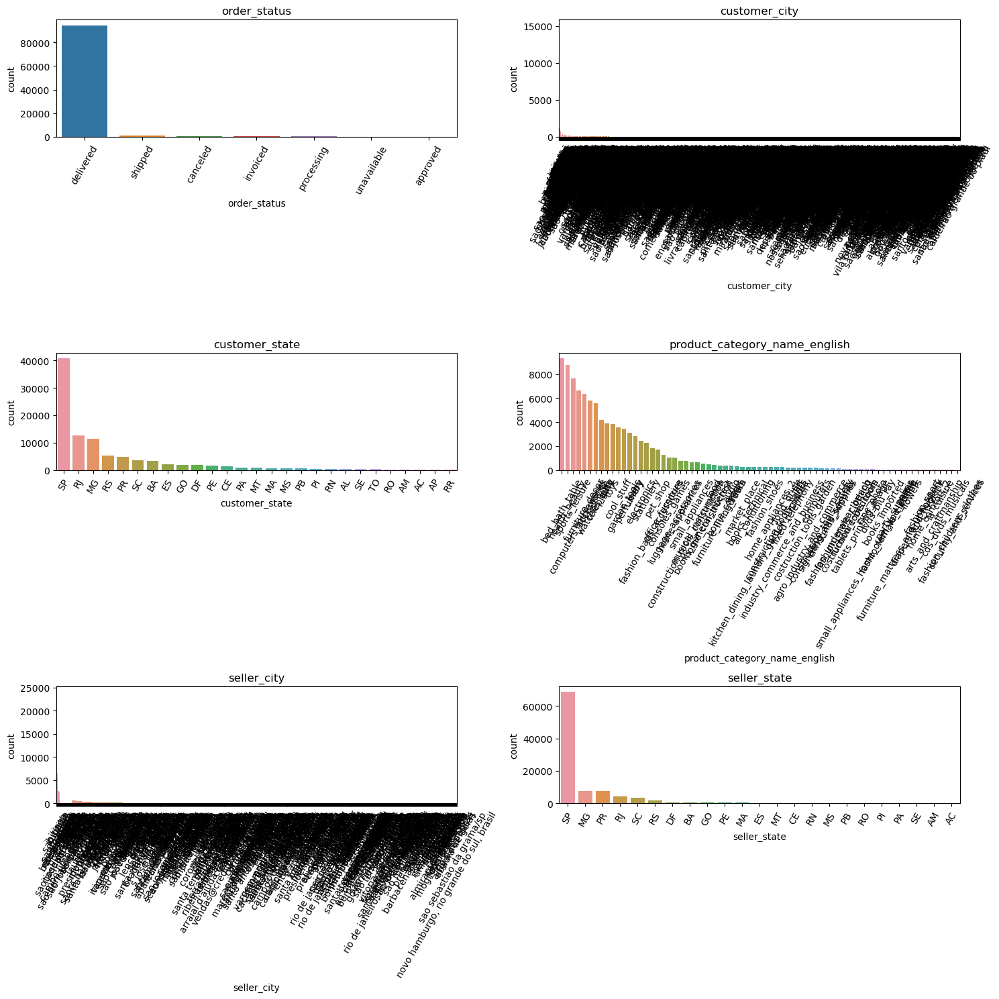

In [50]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(15, 15))
for t, column in enumerate(category_columns, 1):
    x = df_olist[column].value_counts().reset_index()
    x.columns = [column, 'count']  
    plt.subplot(3, 2, t)
    sns.barplot(x=column, y='count', data=x)
    plt.xticks(rotation=60)
    plt.title(column)

plt.tight_layout()
plt.show()


### order_status

In [51]:
order_status_count= df_olist["order_status"].value_counts()
order_status_count

order_status
delivered      94627
shipped         1076
canceled         443
invoiced         302
processing       288
unavailable        6
approved           2
Name: count, dtype: int64

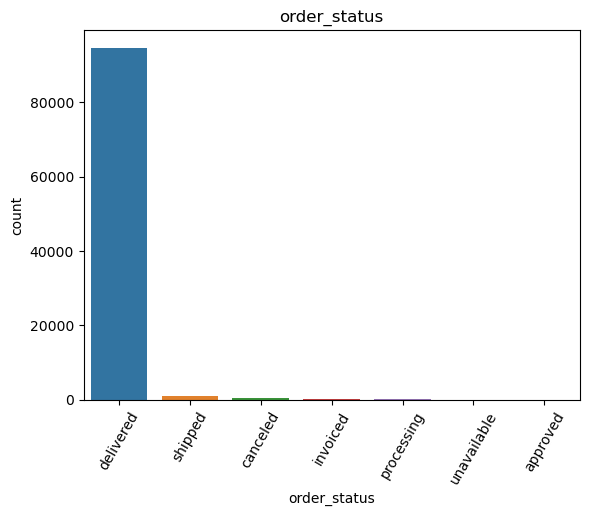

In [52]:
sns.barplot(x=order_status_count.index, y=order_status_count)
plt.xticks(rotation=60)
plt.title("order_status")
plt.show()

### customer_state

In [53]:
customer_state_count= df_olist["customer_state"].value_counts()
customer_state_count

customer_state
SP    40696
RJ    12517
MG    11333
RS     5332
PR     4905
SC     3542
BA     3295
ES     1997
GO     1946
DF     1925
PE     1625
CE     1305
PA      948
MT      886
MA      724
MS      698
PB      517
PI      483
RN      474
AL      406
SE      342
TO      273
RO      239
AM      146
AC       78
AP       68
RR       44
Name: count, dtype: int64

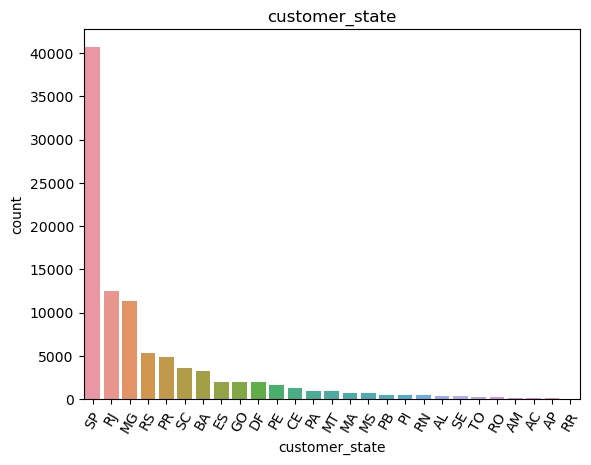

In [54]:
sns.barplot(x=customer_state_count.index, y=customer_state_count)
plt.xticks(rotation=60)
plt.title("customer_state")
plt.show()

In [55]:
state_to_region = {
    'RJ': 'Southeast', 'SP': 'Southeast', 'MG': 'Southeast', 'ES': 'Southeast',
    'PR': 'South', 'SC': 'South', 'RS': 'South',
    'GO': 'Midwest', 'DF': 'Midwest', 'MS': 'Midwest', 'MT': 'Midwest',
    'BA': 'Northeast', 'AL': 'Northeast', 'CE': 'Northeast', 'PE': 'Northeast',
    'MA': 'Northeast', 'PB': 'Northeast', 'PI': 'Northeast', 'RN': 'Northeast', 'SE': 'Northeast',
    'AM': 'North', 'AP': 'North', 'PA': 'North', 'TO': 'North', 'RO': 'North', 'AC': 'North', 'RR': 'North'
}

In [56]:
df_olist['customer_region'] = df_olist['customer_state'].map(state_to_region)

df_olist.head()

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region
0,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,72.19,28013,campos dos goytacazes,RJ,2017-09-19 09:45:35,cool_stuff,volta redonda,SP,Southeast
1,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,259.83,15775,santa fe do sul,SP,2017-05-03 11:05:13,pet_shop,sao paulo,SP,Southeast
2,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,216.87,35661,para de minas,MG,2018-01-18 14:48:30,furniture_decor,borda da mata,MG,Southeast
3,delivered,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20,4.0,25.78,12952,atibaia,SP,2018-08-15 10:10:18,perfumery,franca,SP,Southeast
4,delivered,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17,5.0,218.04,13226,varzea paulista,SP,2017-02-13 13:57:51,garden_tools,loanda,PR,Southeast


In [57]:
customer_region_count=df_olist["customer_region"].value_counts()
customer_region_count

customer_region
Southeast    66543
South        13779
Northeast     9171
Midwest       5455
North         1796
Name: count, dtype: int64

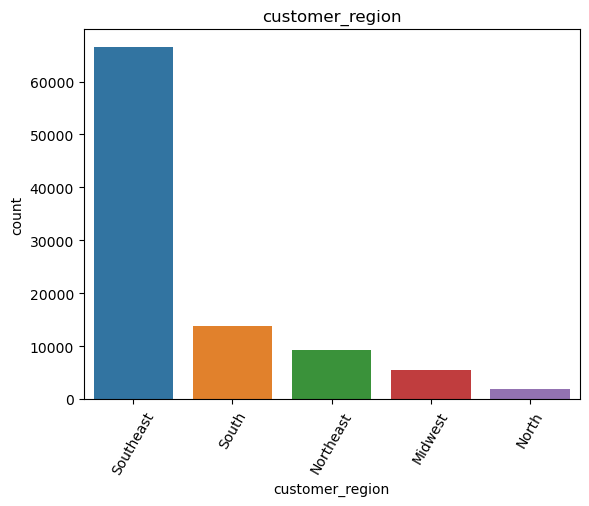

In [58]:
sns.barplot(x=customer_region_count.index, y=customer_region_count)
plt.xticks(rotation=60)
plt.title("customer_region")
plt.show()

### seller_state

In [59]:
seller_state_count= df_olist["seller_state"].value_counts()
seller_state_count

seller_state
SP    68592
MG     7608
PR     7519
RJ     4218
SC     3594
RS     1929
DF      772
BA      563
GO      451
PE      405
MA      389
ES      309
MT      135
CE       88
RN       51
MS       46
PB       31
RO       13
PI       12
PA        8
SE        7
AM        3
AC        1
Name: count, dtype: int64

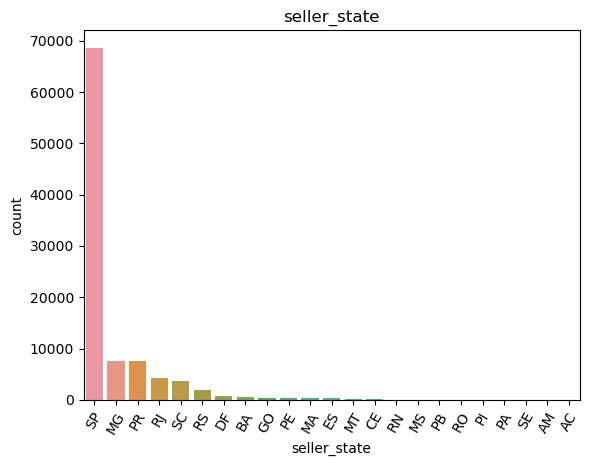

In [60]:
sns.barplot(x=seller_state_count.index, y=seller_state_count)
plt.xticks(rotation=60)
plt.title("seller_state")
plt.show()

In [61]:
len(state_to_region)

27

In [62]:
df_olist['seller_region'] = df_olist['seller_state'].map(state_to_region)

df_olist.head()

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region
0,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,72.19,28013,campos dos goytacazes,RJ,2017-09-19 09:45:35,cool_stuff,volta redonda,SP,Southeast,Southeast
1,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,259.83,15775,santa fe do sul,SP,2017-05-03 11:05:13,pet_shop,sao paulo,SP,Southeast,Southeast
2,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,216.87,35661,para de minas,MG,2018-01-18 14:48:30,furniture_decor,borda da mata,MG,Southeast,Southeast
3,delivered,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20,4.0,25.78,12952,atibaia,SP,2018-08-15 10:10:18,perfumery,franca,SP,Southeast,Southeast
4,delivered,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17,5.0,218.04,13226,varzea paulista,SP,2017-02-13 13:57:51,garden_tools,loanda,PR,Southeast,South


In [63]:
seller_region_count=df_olist["seller_region"].value_counts()
seller_region_count

seller_region
Southeast    80727
South        13042
Northeast     1546
Midwest       1404
North           25
Name: count, dtype: int64

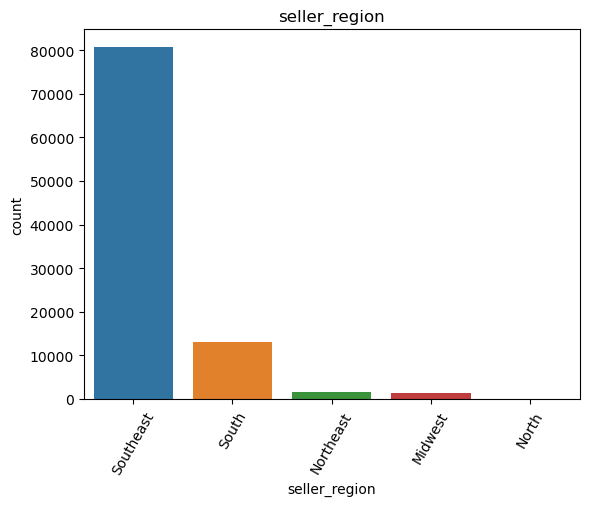

In [64]:
sns.barplot(x=seller_region_count.index, y=seller_region_count)
plt.xticks(rotation=60)
plt.title("seller_region")
plt.show()

### product_category_name_english_count

In [65]:
product_category_name_english_count= df_olist["product_category_name_english"].value_counts()
product_category_name_english_count.head(5)

product_category_name_english
bed_bath_table           9293
health_beauty            8766
sports_leisure           7666
computers_accessories    6643
furniture_decor          6338
Name: count, dtype: int64

In [66]:
len(product_category_name_english_count)

71

### Since there is about 71 categories lets make a major category to reduce into less than 15 categories

In [67]:
subcategory_to_major = {
    'bed_bath_table': 'Home & Kitchen','health_beauty': 'Health & Beauty','sports_leisure': 'Toys & Entertainment','computers_accessories': 'Electronics',
    'furniture_decor': 'Home & Kitchen','housewares': 'Home & Kitchen','watches_gifts': 'Fashion & Accessories',
    'telephony': 'Electronics','auto': 'Automotive','toys': 'Toys & Entertainment','cool_stuff': 'Toys & Entertainment',
    'garden_tools': 'Home & Kitchen','perfumery': 'Health & Beauty','baby': 'Toys & Entertainment','electronics': 'Electronics',
    'stationery': 'Office & Stationery','fashion_bags_accessories': 'Fashion & Accessories','pet_shop': 'Pets',
    'office_furniture': 'Office & Stationery','consoles_games': 'Toys & Entertainment','luggage_accessories': 'Fashion & Accessories',
    'home_appliances': 'Home & Kitchen','construction_tools_construction': 'Tools & Construction','small_appliances': 'Electronics',
    'musical_instruments': 'Toys & Entertainment','books_general_interest': 'Books & Media','home_construction': 'Tools & Construction',
    'food': 'Grocery & Food','furniture_living_room': 'Home & Kitchen','home_confort': 'Home & Kitchen','audio': 'Electronics',
    'drinks': 'Grocery & Food','market_place': 'Miscellaneous','books_technical': 'Books & Media','air_conditioning': 'Tools & Construction',
    'kitchen_dining_laundry_garden_furniture': 'Home & Kitchen','fashion_shoes': 'Fashion & Accessories',
    'home_appliances_2': 'Home & Kitchen','construction_tools_lights': 'Tools & Construction','industry_commerce_and_business': 'Miscellaneous',
    'food_drink': 'Grocery & Food','fixed_telephony': 'Miscellaneous','art': 'Miscellaneous','costruction_tools_garden': 'Tools & Construction',
    'agro_industry_and_commerce': 'Miscellaneous','computers': 'Electronics','construction_tools_safety': 'Tools & Construction',
    'signaling_and_security': 'Miscellaneous','christmas_supplies': 'Miscellaneous','fashion_underwear_beach': 'Fashion & Accessories',
    'fashion_male_clothing': 'Fashion & Accessories','costruction_tools_tools': 'Tools & Construction',
    'furniture_bedroom': 'Home & Kitchen','tablets_printing_image': 'Electronics','small_appliances_home_oven_and_coffee': 'Electronics',
    'cine_photo': 'Toys & Entertainment','dvds_blu_ray': 'Books & Media','books_imported': 'Books & Media',
    'fashio_female_clothing': 'Fashion & Accessories','party_supplies': 'Miscellaneous','furniture_mattress_and_upholstery': 'Home & Kitchen',
    'music': 'Books & Media','flowers': 'Miscellaneous','diapers_and_hygiene': 'Health & Beauty','fashion_sport': 'Fashion & Accessories',
    'home_comfort_2': 'Home & Kitchen','arts_and_craftmanship': 'Miscellaneous','la_cuisine': 'Home & Kitchen','cds_dvds_musicals': 'Books & Media',
    'fashion_childrens_clothes': 'Fashion & Accessories','security_and_services': 'Miscellaneous'}

In [68]:
df_olist['major_category'] = df_olist['product_category_name_english'].map(subcategory_to_major)

In [69]:
major_category_count=df_olist['major_category'].value_counts()
major_category_count

major_category
Home & Kitchen           27073
Toys & Entertainment     19629
Electronics              14555
Health & Beauty          11927
Fashion & Accessories     8985
Automotive                3871
Office & Stationery       3536
Tools & Construction      2138
Pets                      1686
Miscellaneous             1458
Grocery & Food             959
Books & Media              927
Name: count, dtype: int64

In [70]:
len(major_category_count)

12

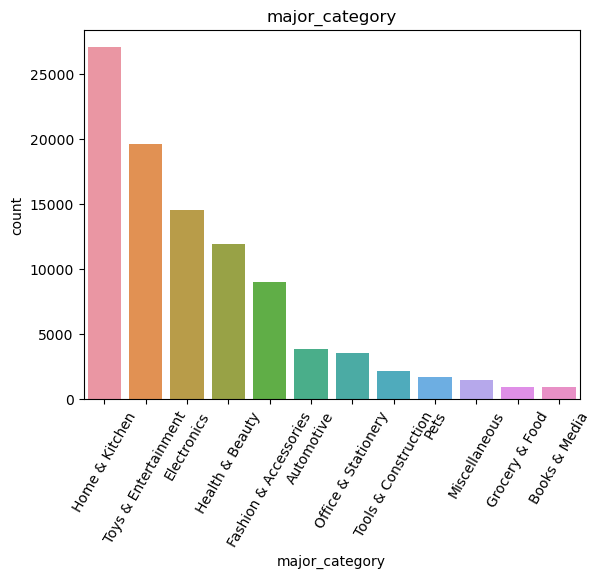

In [71]:
sns.barplot(x=major_category_count.index, y=major_category_count)
plt.xticks(rotation=60)
plt.title("major_category")
plt.show()

### customer_city

In [72]:
customer_city_count= df_olist["customer_city"].value_counts()
customer_city_count.head(30)

customer_city
sao paulo                15114
rio de janeiro            6702
belo horizonte            2692
brasilia                  1917
curitiba                  1491
campinas                  1410
porto alegre              1348
salvador                  1213
guarulhos                 1161
sao bernardo do campo      906
niteroi                    833
santo andre                780
osasco                     736
santos                     697
sao jose dos campos        675
goiania                    665
fortaleza                  640
sorocaba                   616
recife                     604
florianopolis              552
jundiai                    547
ribeirao preto             503
nova iguacu                434
belem                      432
barueri                    423
juiz de fora               418
contagem                   414
sao goncalo                400
mogi das cruzes            377
vitoria                    372
Name: count, dtype: int64

In [73]:
len(customer_city_count)

4045

In [74]:
cc=pd.DataFrame(customer_city_count)
cc

,count
customer_city,
sao paulo,15114
rio de janeiro,6702
belo horizonte,2692
brasilia,1917
curitiba,1491
...,...
picarra,1
nova roma,1
suzanapolis,1


In [75]:
cc[cc["count"]>100].tail(15)

,count
customer_city,
resende,114
cabo frio,114
passo fundo,112
gravatai,110
anapolis,109
belford roxo,109
aparecida de goiania,109
ferraz de vasconcelos,108
mage,107


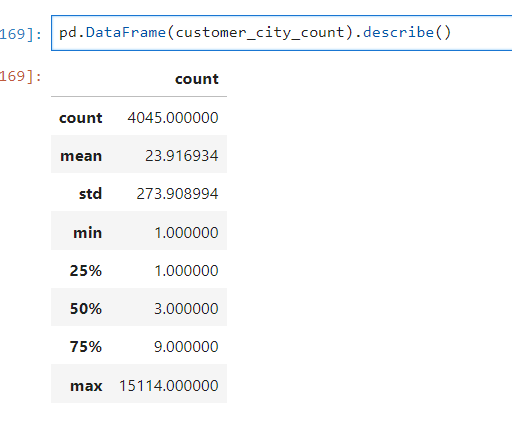

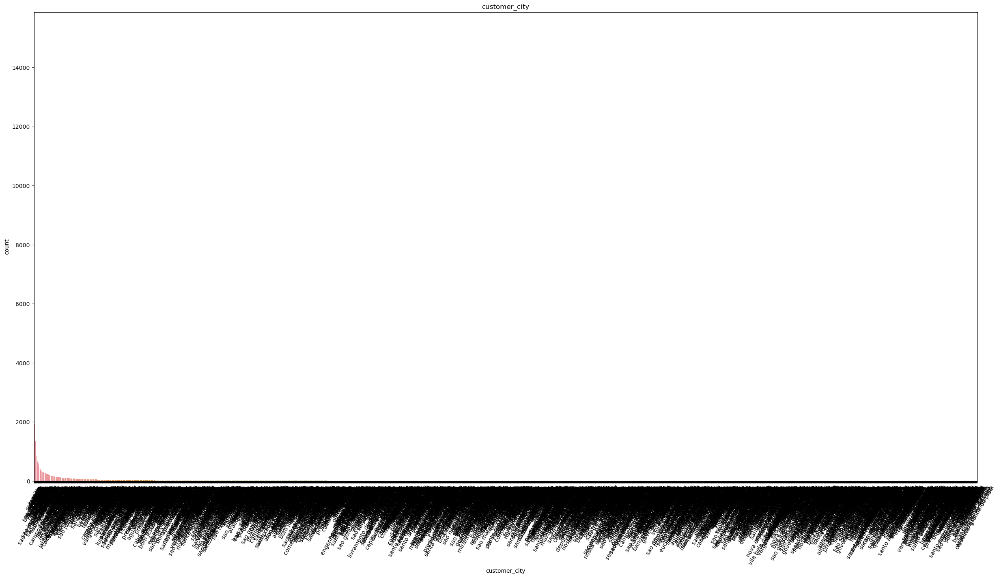

In [76]:
# order_status_count.plot(kind="bar")
plt.figure(figsize=(30,15))
sns.barplot(x=customer_city_count.index, y=customer_city_count)
plt.xticks(rotation=60)
plt.title("customer_city")
plt.show()

# make this to code

make the category into either top customer orders or based on region

<a id="Null"></a>
<div align='left'>
    <font color='darkblue' , size = 5px>
        <b> 3.1 Checking for Null Values and their Percentages </b>
    </font>
</div>

In [77]:
missing_values = pd.concat([df_olist.isnull().sum(),(df_olist.isnull().sum()/df_olist.shape[0] )*100   ] 
          ,keys=['Total Missing Values', 'Percentage Missing']   ,axis=1)
missing_values

,Total Missing Values,Percentage Missing
order_status,0,0.000000
order_purchase_timestamp,0,0.000000
order_approved_at,13,0.013438
order_delivered_carrier_date,970,1.002646
order_delivered_customer_date,2119,2.190317
order_estimated_delivery_date,0,0.000000
review_score,736,0.760771
sales,0,0.000000
customer_zip_code_prefix,0,0.000000
customer_city,0,0.000000


In [78]:
df_olist[df_olist.isnull().any(axis=1)]["order_status"].value_counts()

order_status
shipped        1076
delivered       658
canceled        437
invoiced        302
processing      288
unavailable       6
approved          2
Name: count, dtype: int64

In [79]:
df_olist.groupby("order_status")["sales"].sum()

order_status
approved            241.08
canceled         103315.75
delivered      15146847.17
invoiced          67793.90
processing        67486.20
shipped          170337.15
unavailable        2140.49
Name: sales, dtype: float64

##### order_purchase_timestamp

In [80]:
df_olist[(df_olist["order_status"]=="delivered") | (df_olist["order_status"]=="shipped")]["order_purchase_timestamp"].isnull().sum()

0

#### order_approved_at

In [81]:
df_olist[(df_olist["order_status"]=="delivered") | (df_olist["order_status"]=="shipped")]["order_approved_at"].isnull().sum()

13

In [82]:
df_olist[((df_olist["order_status"]=="delivered") | (df_olist["order_status"]=="shipped")) & ( df_olist["order_approved_at"].isnull())]

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region,major_category
7074,delivered,2017-02-17 13:05:55,NaT,2017-02-22 11:23:11,2017-03-02 11:09:19,2017-03-20,5.0,95.76,27945,macae,RJ,2017-02-21 12:05:55,cool_stuff,sao paulo,SP,Southeast,Southeast,Toys & Entertainment
16340,delivered,2017-02-18 17:15:03,NaT,2017-02-22 11:23:11,2017-03-03 18:43:43,2017-03-31,4.0,106.81,65110,sao jose de ribamar,MA,2017-02-22 16:15:03,cool_stuff,sao paulo,SP,Northeast,Southeast,Toys & Entertainment
17601,delivered,2017-02-17 17:21:55,NaT,2017-02-22 11:42:51,2017-03-03 12:16:03,2017-03-20,5.0,154.23,35620,abaete,MG,2017-02-21 16:21:55,garden_tools,sao paulo,SP,Southeast,Southeast,Home & Kitchen
22640,delivered,2017-02-17 15:53:27,NaT,2017-02-22 11:31:30,2017-03-03 11:47:47,2017-03-23,3.0,157.19,95795,sao vendelino,RS,2017-02-22 14:53:27,bed_bath_table,ibitinga,SP,South,Southeast,Home & Kitchen
30981,delivered,2017-02-18 15:52:27,NaT,2017-02-23 03:09:14,2017-03-07 13:57:47,2017-03-29,5.0,77.06,37660,paraisopolis,MG,2017-02-28 14:52:27,furniture_decor,ibitinga,SP,Southeast,Southeast,Home & Kitchen
35031,delivered,2017-02-18 16:48:35,NaT,2017-02-22 11:23:10,2017-03-09 07:28:47,2017-03-31,5.0,106.81,62700,caninde,CE,2017-02-22 15:48:35,cool_stuff,sao paulo,SP,Northeast,Southeast,Toys & Entertainment
42333,delivered,2017-01-19 22:26:59,NaT,2017-01-27 11:08:05,2017-02-06 14:22:19,2017-03-16,2.0,60.42,36400,conselheiro lafaiete,MG,2017-01-29 22:26:59,furniture_decor,ibitinga,SP,Southeast,Southeast,Home & Kitchen
51207,delivered,2017-02-18 22:49:19,NaT,2017-02-22 11:31:06,2017-03-02 12:06:06,2017-03-21,4.0,127.04,21020,rio de janeiro,RJ,2017-02-22 21:49:19,telephony,santos,SP,Southeast,Southeast,Electronics
52188,delivered,2017-02-18 12:45:31,NaT,2017-02-23 09:01:52,2017-03-02 10:05:06,2017-03-21,5.0,396.86,93548,novo hamburgo,RS,2017-02-22 11:45:31,construction_tools_safety,florianopolis,SC,South,South,Tools & Construction
73211,delivered,2017-01-19 12:48:08,NaT,2017-01-25 14:56:50,2017-01-30 18:16:01,2017-03-01,4.0,54.51,11030,santos,SP,2017-01-23 12:48:08,sports_leisure,pinhais,PR,Southeast,South,Toys & Entertainment


In [83]:
order_approved_at_mean = np.mean(df_olist[((df_olist["order_status"]=="delivered") | (df_olist["order_status"]=="shipped"))]["order_approved_at"]-df_olist[((df_olist["order_status"]=="delivered") | (df_olist["order_status"]=="shipped"))]["order_purchase_timestamp"])
order_approved_at_mean.floor('s')

Timedelta('0 days 10:02:35')

In [84]:
df_olist["order_approved_at"] = np.where(((df_olist["order_status"]=="delivered") | (df_olist["order_status"]=="shipped")) & ( df_olist["order_approved_at"].isnull()),
        df_olist["order_purchase_timestamp"]+pd.to_timedelta(order_approved_at_mean.floor('s')),df_olist["order_approved_at"]  )

In [85]:
df_olist[(df_olist["order_status"]=="delivered") | (df_olist["order_status"]=="shipped")]["order_approved_at"].isnull().sum()

0

In [86]:
df_olist[df_olist["order_purchase_timestamp"]>df_olist["order_approved_at"]]

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region,major_category


#### order_delivered_carrier_date

In [87]:
df_olist[(df_olist["order_status"]=="delivered") | (df_olist["order_status"]=="shipped")]["order_delivered_carrier_date"].isnull().sum()

2

In [88]:
df_olist[((df_olist["order_status"]=="delivered") | (df_olist["order_status"]=="shipped")) & ( df_olist["order_delivered_carrier_date"].isnull())]

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region,major_category
15956,delivered,2017-09-29 08:52:58,2017-09-29 09:07:16,NaT,2017-11-20 19:44:47,2017-11-14,5.0,193.98,13334,indaiatuba,SP,2017-10-18 10:07:16,furniture_decor,terra boa,PR,Southeast,South,Home & Kitchen
17052,delivered,2017-05-25 23:22:43,2017-05-25 23:30:16,NaT,NaT,2017-06-23,5.0,194.00,91330,porto alegre,RS,2017-06-04 23:30:16,sports_leisure,sao paulo,SP,South,Southeast,Toys & Entertainment


In [89]:
order_delivered_carrier_date_mean = np.mean(df_olist[((df_olist["order_status"]=="delivered") | (df_olist["order_status"]=="shipped"))]["order_delivered_carrier_date"]-df_olist[((df_olist["order_status"]=="delivered") | (df_olist["order_status"]=="shipped"))]["order_approved_at"])
order_delivered_carrier_date_mean.floor('s')

Timedelta('2 days 19:50:56')

In [90]:
df_olist["order_delivered_carrier_date"] = np.where(((df_olist["order_status"]=="delivered") | (df_olist["order_status"]=="shipped")) & ( df_olist["order_delivered_carrier_date"].isnull()),
        df_olist["order_approved_at"]+pd.to_timedelta(order_delivered_carrier_date_mean.floor('s')),df_olist["order_delivered_carrier_date"]  )

In [91]:
#recheck if  any null is present
df_olist[((df_olist["order_status"]=="delivered") | (df_olist["order_status"]=="shipped")) & ( df_olist["order_delivered_carrier_date"].isnull())]

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region,major_category


In [92]:
df_olist[df_olist["order_purchase_timestamp"]>df_olist["order_approved_at"]]

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region,major_category


#### order_delivered_customer_date

In [93]:
df_olist[(df_olist["order_status"]=="delivered") | (df_olist["order_status"]=="shipped")]["order_delivered_customer_date"].isnull().sum()

1084

In [94]:
df_olist[((df_olist["order_status"]=="delivered") | (df_olist["order_status"]=="shipped")) & ( df_olist["order_delivered_customer_date"].isnull())]

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region,major_category
72,shipped,2018-03-21 13:05:30,2018-03-21 13:15:27,2018-03-22 00:13:35,NaT,2018-04-16,3.0,77.29,42804,camacari,BA,2018-03-27 13:15:27,bed_bath_table,ibitinga,SP,Northeast,Southeast,Home & Kitchen
227,shipped,2018-08-17 16:25:04,2018-08-17 16:35:18,2018-08-18 09:07:00,NaT,2018-09-18,5.0,75.29,45990,teixeira de freitas,BA,2018-08-21 16:35:18,computers_accessories,araraquara,SP,Northeast,Southeast,Electronics
472,shipped,2018-01-03 10:43:02,2018-01-04 14:32:48,2018-01-05 17:35:19,NaT,2018-02-01,1.0,39.10,21380,rio de janeiro,RJ,2018-01-10 14:32:12,bed_bath_table,sao paulo,SP,Southeast,Southeast,Home & Kitchen
549,shipped,2018-03-05 18:13:17,2018-03-05 19:00:26,2018-03-08 01:26:56,NaT,2018-03-26,1.0,185.86,27933,macae,RJ,2018-03-09 18:31:16,air_conditioning,marilia,SP,Southeast,Southeast,Tools & Construction
917,shipped,2018-04-11 15:49:16,2018-04-11 16:10:51,2018-04-13 20:05:02,NaT,2018-05-02,1.0,139.17,28605,nova friburgo,RJ,2018-04-17 16:10:51,housewares,sao paulo,SP,Southeast,Southeast,Home & Kitchen
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96272,shipped,2017-12-14 09:13:33,2017-12-14 09:34:12,2017-12-18 18:44:57,NaT,2018-01-11,1.0,54.10,29141,cariacica,ES,2017-12-20 09:31:42,bed_bath_table,ibitinga,SP,Southeast,Southeast,Home & Kitchen
96365,shipped,2017-09-25 08:57:20,2017-09-25 09:10:09,2017-09-27 15:18:41,NaT,2017-10-24,2.0,46.05,58011,joao pessoa,PB,2017-09-29 09:10:09,telephony,sao paulo,SP,Northeast,Southeast,Electronics
96401,shipped,2018-04-04 22:58:39,2018-04-04 23:10:13,2018-04-05 22:59:25,NaT,2018-04-23,1.0,400.44,19050,presidente prudente,SP,2018-04-10 23:10:13,computers_accessories,rio de janeiro,RJ,Southeast,Southeast,Electronics
96472,shipped,2018-03-03 17:05:12,2018-03-03 17:29:04,2018-03-05 17:18:58,NaT,2018-04-02,1.0,36.69,24913,marica,RJ,2018-03-08 17:29:04,electronics,maringa,PR,Southeast,South,Electronics


In [95]:
order_delivered_customer_date_mean = np.mean(df_olist[((df_olist["order_status"]=="delivered") | (df_olist["order_status"]=="shipped"))]["order_delivered_customer_date"]-df_olist[((df_olist["order_status"]=="delivered") | (df_olist["order_status"]=="shipped"))]["order_delivered_carrier_date"])
order_delivered_customer_date_mean.floor('s')

Timedelta('9 days 07:30:32')

In [96]:
df_olist["order_delivered_customer_date"] = np.where(((df_olist["order_status"]=="delivered") | (df_olist["order_status"]=="shipped")) & ( df_olist["order_delivered_customer_date"].isnull()),
        df_olist["order_delivered_carrier_date"]+pd.to_timedelta(order_delivered_customer_date_mean.floor('s')),df_olist["order_delivered_customer_date"]  )

In [97]:
df_olist[((df_olist["order_status"]=="delivered") | (df_olist["order_status"]=="shipped")) & ( df_olist["order_delivered_customer_date"].isnull())]

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region,major_category


#### So from below we can confirm that all order status which are delivered and shipped does not have null values , as these are used for our forecasting

In [98]:
df_olist[(df_olist["order_status"]=="delivered") | (df_olist["order_status"]=="shipped")].loc[:,:"order_delivered_customer_date"].isnull().sum()

order_status                     0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
dtype: int64

In [99]:
df_olist[df_olist.loc[:,:"order_delivered_customer_date"].isnull().any(axis=1)]["order_status"].value_counts()

order_status
canceled       437
invoiced       302
processing     288
unavailable      6
approved         2
Name: count, dtype: int64

In [100]:
df_olist.groupby("order_status")["sales"].sum()/df_olist["sales"].sum()*100

order_status
approved        0.001550
canceled        0.664061
delivered      97.356278
invoiced        0.435745
processing      0.433767
shipped         1.094841
unavailable     0.013758
Name: sales, dtype: float64

In [101]:
df_olist["order_delivered_carrier_date"] = np.where((df_olist["order_delivered_carrier_date"].isnull()), df_olist["order_approved_at"]+pd.to_timedelta(order_delivered_carrier_date_mean.floor('s')),df_olist["order_delivered_carrier_date"])

In [102]:
df_olist["order_delivered_customer_date"] = np.where((df_olist["order_delivered_customer_date"].isnull()),df_olist["order_delivered_carrier_date"]+pd.to_timedelta(order_delivered_customer_date_mean.floor('s')),df_olist["order_delivered_customer_date"])

In [103]:
df_olist.isnull().sum()

order_status                       0
order_purchase_timestamp           0
order_approved_at                  0
order_delivered_carrier_date       0
order_delivered_customer_date      0
order_estimated_delivery_date      0
review_score                     736
sales                              0
customer_zip_code_prefix           0
customer_city                      0
customer_state                     0
shipping_limit_date                0
product_category_name_english      0
seller_city                        0
seller_state                       0
customer_region                    0
seller_region                      0
major_category                     0
dtype: int64

In [104]:
df_olist.head()

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region,major_category
0,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,72.19,28013,campos dos goytacazes,RJ,2017-09-19 09:45:35,cool_stuff,volta redonda,SP,Southeast,Southeast,Toys & Entertainment
1,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,259.83,15775,santa fe do sul,SP,2017-05-03 11:05:13,pet_shop,sao paulo,SP,Southeast,Southeast,Pets
2,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,216.87,35661,para de minas,MG,2018-01-18 14:48:30,furniture_decor,borda da mata,MG,Southeast,Southeast,Home & Kitchen
3,delivered,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20,4.0,25.78,12952,atibaia,SP,2018-08-15 10:10:18,perfumery,franca,SP,Southeast,Southeast,Health & Beauty
4,delivered,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17,5.0,218.04,13226,varzea paulista,SP,2017-02-13 13:57:51,garden_tools,loanda,PR,Southeast,South,Home & Kitchen


____

### Currently I am taking only delivered and shipped for forecasting and ignoring others

In [105]:
df_olist_forcast=df_olist.copy()

In [106]:
df_olist_forcast.shape

(96744, 18)

In [107]:
df_olist_forcast= df_olist_forcast[(df_olist_forcast["order_status"]=="delivered") | (df_olist_forcast["order_status"]=="shipped")]
df_olist_forcast.head()

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region,major_category
0,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,72.19,28013,campos dos goytacazes,RJ,2017-09-19 09:45:35,cool_stuff,volta redonda,SP,Southeast,Southeast,Toys & Entertainment
1,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,259.83,15775,santa fe do sul,SP,2017-05-03 11:05:13,pet_shop,sao paulo,SP,Southeast,Southeast,Pets
2,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,216.87,35661,para de minas,MG,2018-01-18 14:48:30,furniture_decor,borda da mata,MG,Southeast,Southeast,Home & Kitchen
3,delivered,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20,4.0,25.78,12952,atibaia,SP,2018-08-15 10:10:18,perfumery,franca,SP,Southeast,Southeast,Health & Beauty
4,delivered,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17,5.0,218.04,13226,varzea paulista,SP,2017-02-13 13:57:51,garden_tools,loanda,PR,Southeast,South,Home & Kitchen


In [108]:
df_olist_forcast.order_status.value_counts()

order_status
delivered    94627
shipped       1076
Name: count, dtype: int64

In [109]:
df_olist_forcast.isnull().sum()

order_status                       0
order_purchase_timestamp           0
order_approved_at                  0
order_delivered_carrier_date       0
order_delivered_customer_date      0
order_estimated_delivery_date      0
review_score                     710
sales                              0
customer_zip_code_prefix           0
customer_city                      0
customer_state                     0
shipping_limit_date                0
product_category_name_english      0
seller_city                        0
seller_state                       0
customer_region                    0
seller_region                      0
major_category                     0
dtype: int64

In [110]:
mean_score = df_olist['review_score'].mean()
df_olist['review_score'].fillna(mean_score, inplace=True)

In [111]:
df_olist.isnull().sum()

order_status                     0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
review_score                     0
sales                            0
customer_zip_code_prefix         0
customer_city                    0
customer_state                   0
shipping_limit_date              0
product_category_name_english    0
seller_city                      0
seller_state                     0
customer_region                  0
seller_region                    0
major_category                   0
dtype: int64

# change amount to float

In [133]:
df_olist.head()

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region,major_category
0,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,72.19,28013,campos dos goytacazes,RJ,2017-09-19 09:45:35,cool_stuff,volta redonda,SP,Southeast,Southeast,Toys & Entertainment
1,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,259.83,15775,santa fe do sul,SP,2017-05-03 11:05:13,pet_shop,sao paulo,SP,Southeast,Southeast,Pets
2,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,216.87,35661,para de minas,MG,2018-01-18 14:48:30,furniture_decor,borda da mata,MG,Southeast,Southeast,Home & Kitchen
3,delivered,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20,4.0,25.78,12952,atibaia,SP,2018-08-15 10:10:18,perfumery,franca,SP,Southeast,Southeast,Health & Beauty
4,delivered,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17,5.0,218.04,13226,varzea paulista,SP,2017-02-13 13:57:51,garden_tools,loanda,PR,Southeast,South,Home & Kitchen


In [134]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()

# Apply label encoding to categorical columns
categorical_columns = ['order_status', 'customer_city', 'customer_state', 'product_category_name_english','seller_city','seller_state','customer_region','seller_region','major_category']
df_olist[categorical_columns] = df_olist[categorical_columns].apply(label_encoder.fit_transform)


In [135]:
df_olist.head()

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region,major_category
0,2,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,72.19,28013,728,18,2017-09-19 09:45:35,20,599,22,4,4,11
1,2,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,259.83,15775,3228,25,2017-05-03 11:05:13,60,511,22,4,4,9
2,2,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,216.87,35661,2616,10,2018-01-18 14:48:30,39,76,8,4,4,6
3,2,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20,4.0,25.78,12952,324,25,2018-08-15 10:10:18,59,195,22,4,4,5
4,2,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17,5.0,218.04,13226,3953,25,2017-02-13 13:57:51,42,301,15,4,3,6


In [136]:
from sklearn.model_selection import train_test_split

# Extract relevant date features
df_olist['order_year'] = df_olist['order_purchase_timestamp'].dt.year
df_olist['order_month'] = df_olist['order_purchase_timestamp'].dt.month
df_olist['order_dayofweek'] = df_olist['order_purchase_timestamp'].dt.dayofweek



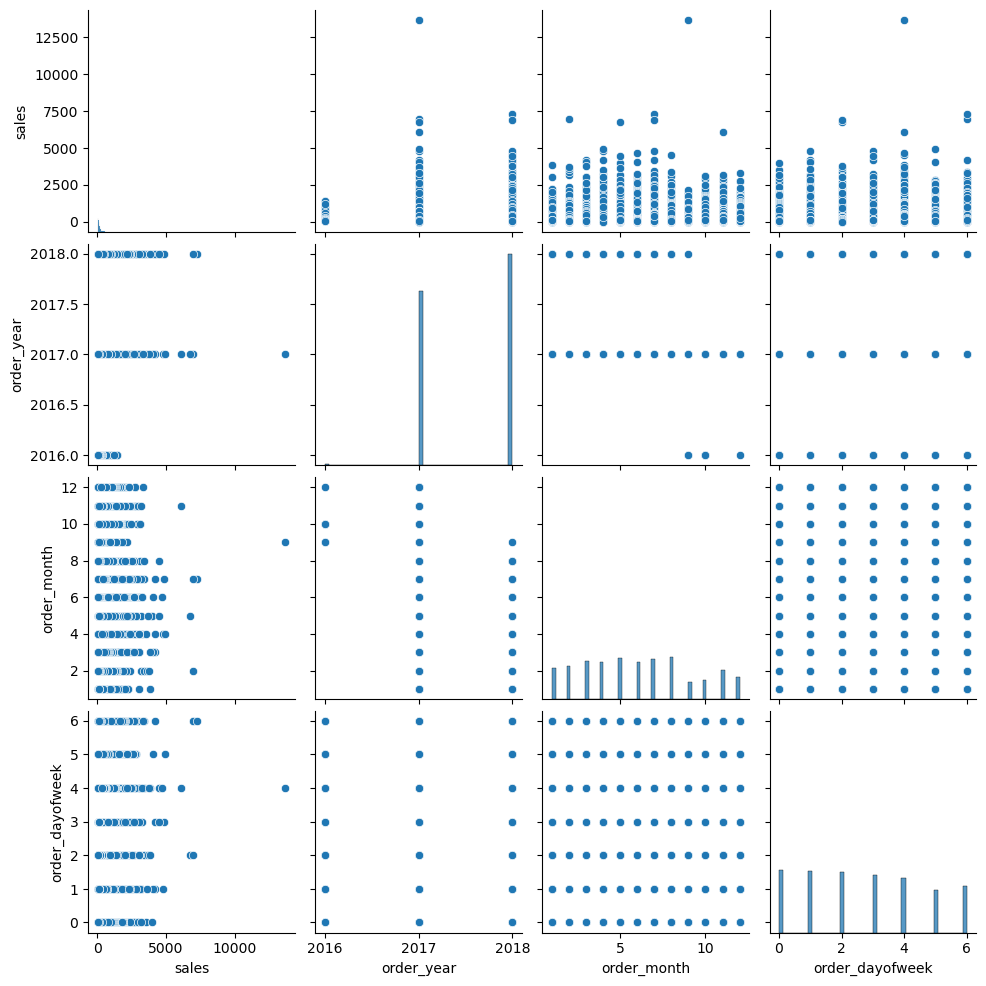

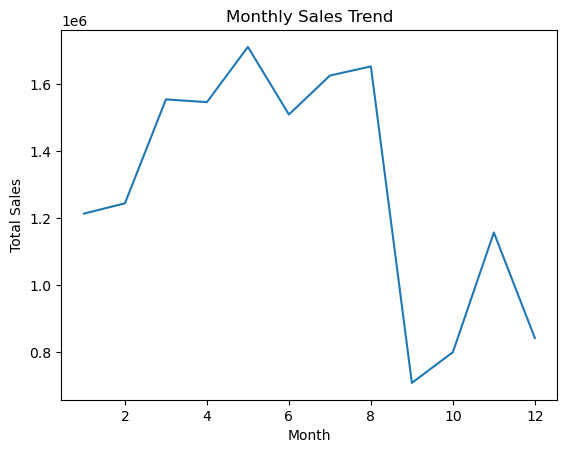

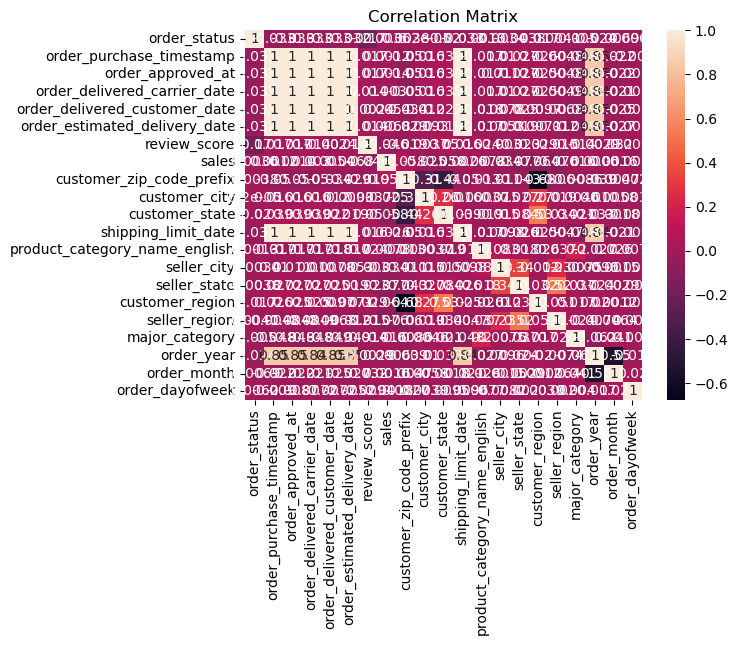

In [137]:
sns.pairplot(df_olist, vars=['sales', 'order_year', 'order_month', 'order_dayofweek'])
plt.show()

# Identify trends and seasonality
sales_monthly = df_olist.groupby('order_month')['sales'].sum()
sales_monthly.plot(kind='line')
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.title('Monthly Sales Trend')
plt.show()

# Compute correlations
correlation_matrix = df_olist.corr()
sns.heatmap(correlation_matrix, annot=True)
plt.title('Correlation Matrix')
plt.show()

In [138]:
df_olist.head(2)

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region,major_category,order_year,order_month,order_dayofweek
0,2,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,72.19,28013,728,18,2017-09-19 09:45:35,20,599,22,4,4,11,2017,9,2
1,2,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,259.83,15775,3228,25,2017-05-03 11:05:13,60,511,22,4,4,9,2017,4,2


In [139]:
df_olist.to_csv('sales_forecasting.csv', index=False)

In [140]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.offline as py
py.init_notebook_mode()
%matplotlib inline
import seaborn as sns
from pylab import rcParams

In [141]:
df_date = df_olist[['order_purchase_timestamp','sales']]

In [142]:
date1 = pd.date_range(start='2016-09-30', end='2018-09-30', freq='B')

In [143]:
date1

DatetimeIndex(['2016-09-30', '2016-10-03', '2016-10-04', '2016-10-05',
               '2016-10-06', '2016-10-07', '2016-10-10', '2016-10-11',
               '2016-10-12', '2016-10-13',
               ...
               '2018-09-17', '2018-09-18', '2018-09-19', '2018-09-20',
               '2018-09-21', '2018-09-24', '2018-09-25', '2018-09-26',
               '2018-09-27', '2018-09-28'],
              dtype='datetime64[ns]', length=521, freq='B')

In [144]:
from pandas.tseries.holiday import USFederalHolidayCalendar
from pandas.tseries.offsets import CustomBusinessDay
us_bd = CustomBusinessDay(calendar=USFederalHolidayCalendar())
us_bd

<CustomBusinessDay>

In [145]:
date = pd.date_range(start='8/15/2018', end='8/14/2019', freq=us_bd)

In [146]:
date

DatetimeIndex(['2018-08-15', '2018-08-16', '2018-08-17', '2018-08-20',
               '2018-08-21', '2018-08-22', '2018-08-23', '2018-08-24',
               '2018-08-27', '2018-08-28',
               ...
               '2019-08-01', '2019-08-02', '2019-08-05', '2019-08-06',
               '2019-08-07', '2019-08-08', '2019-08-09', '2019-08-12',
               '2019-08-13', '2019-08-14'],
              dtype='datetime64[ns]', length=251, freq='C')

In [147]:
df_olist['order_purchase_timestamp'] = pd.to_datetime(df_olist['order_purchase_timestamp']).dt.date

In [148]:
df_olist.head()

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region,major_category,order_year,order_month,order_dayofweek
0,2,2017-09-13,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,72.19,28013,728,18,2017-09-19 09:45:35,20,599,22,4,4,11,2017,9,2
1,2,2017-04-26,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,259.83,15775,3228,25,2017-05-03 11:05:13,60,511,22,4,4,9,2017,4,2
2,2,2018-01-14,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,216.87,35661,2616,10,2018-01-18 14:48:30,39,76,8,4,4,6,2018,1,6
3,2,2018-08-08,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20,4.0,25.78,12952,324,25,2018-08-15 10:10:18,59,195,22,4,4,5,2018,8,2
4,2,2017-02-04,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17,5.0,218.04,13226,3953,25,2017-02-13 13:57:51,42,301,15,4,3,6,2017,2,5


In [149]:
df_date['Time_Stamp'] = pd.DataFrame(date,columns=['order_purchase_timestamp'])
df_date.head()

,order_purchase_timestamp,sales,Time_Stamp
0,2017-09-13 08:59:02,72.19,2018-08-15
1,2017-04-26 10:53:06,259.83,2018-08-16
2,2018-01-14 14:33:31,216.87,2018-08-17
3,2018-08-08 10:00:35,25.78,2018-08-20
4,2017-02-04 13:57:51,218.04,2018-08-21


In [150]:
rcParams['figure.figsize'] = 15,8

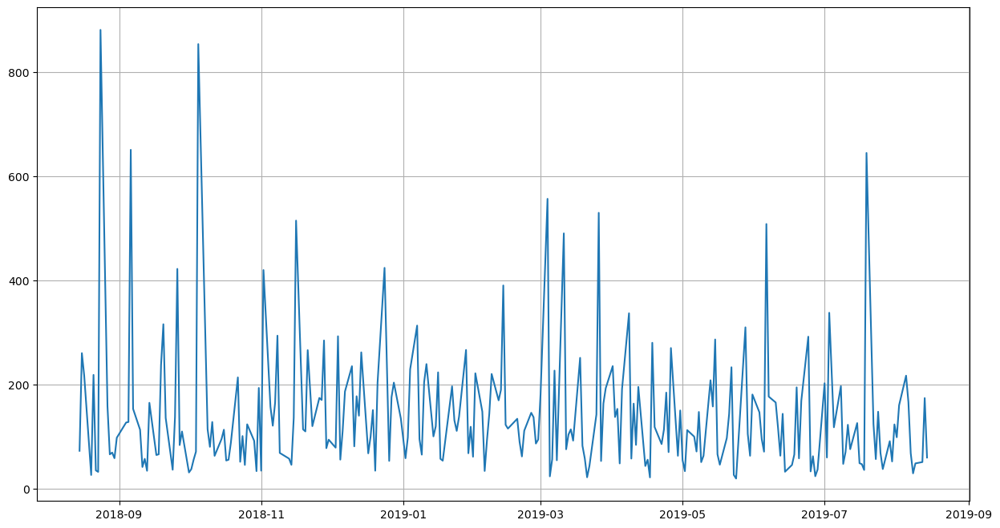

In [151]:
plt.plot(df_date['Time_Stamp'],df_date['sales']);
plt.grid()

In [152]:
df_date.describe()

,order_purchase_timestamp,sales,Time_Stamp
count,96744,96744.000000,251
mean,2018-01-01 15:59:09.235373824,160.817846,2019-02-14 07:56:10.517928192
min,2016-09-04 21:15:19,9.590000,2018-08-15 00:00:00
25%,2017-09-13 16:34:15,62.010000,2018-11-14 12:00:00
50%,2018-01-20 21:27:15.500000,105.280000,2019-02-15 00:00:00
75%,2018-05-05 23:36:58.249999872,177.430000,2019-05-15 12:00:00
max,2018-09-03 09:06:57,13664.080000,2019-08-14 00:00:00
std,NaN,220.640186,NaN


In [153]:
df_olist.to_csv('sales_forecasting_final.csv', index=False)

In [154]:
df_final = pd.read_csv("sales_forecasting_final.csv", parse_dates=['order_purchase_timestamp'], index_col='order_purchase_timestamp')

In [155]:
df_final.head()

,order_status,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region,major_category,order_year,order_month,order_dayofweek
order_purchase_timestamp,,,,,,,,,,,,,,,,,,,,
2017-09-13,2,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,72.19,28013,728,18,2017-09-19 09:45:35,20,599,22,4,4,11,2017,9,2
2017-04-26,2,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,259.83,15775,3228,25,2017-05-03 11:05:13,60,511,22,4,4,9,2017,4,2
2018-01-14,2,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,216.87,35661,2616,10,2018-01-18 14:48:30,39,76,8,4,4,6,2018,1,6
2018-08-08,2,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20,4.0,25.78,12952,324,25,2018-08-15 10:10:18,59,195,22,4,4,5,2018,8,2
2017-02-04,2,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17,5.0,218.04,13226,3953,25,2017-02-13 13:57:51,42,301,15,4,3,6,2017,2,5


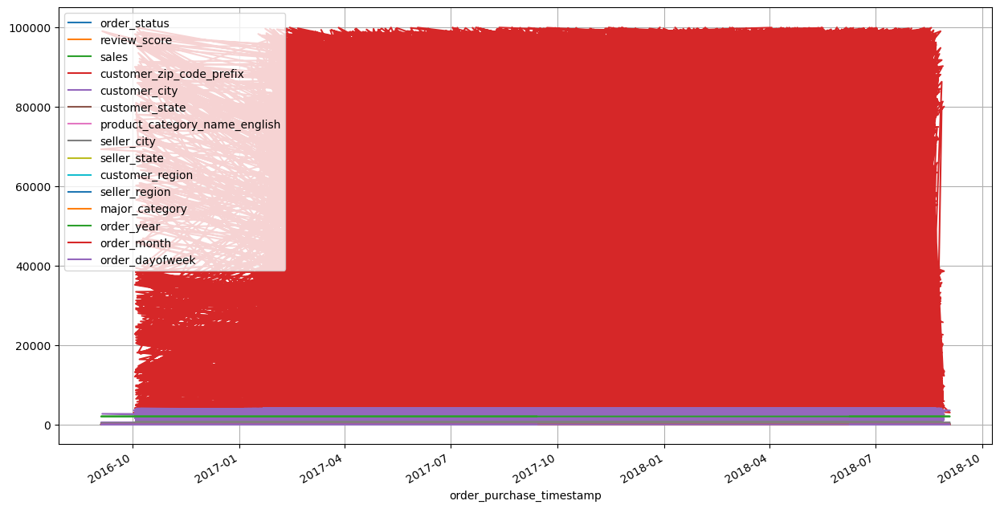

In [156]:
df_final.plot();
plt.grid()

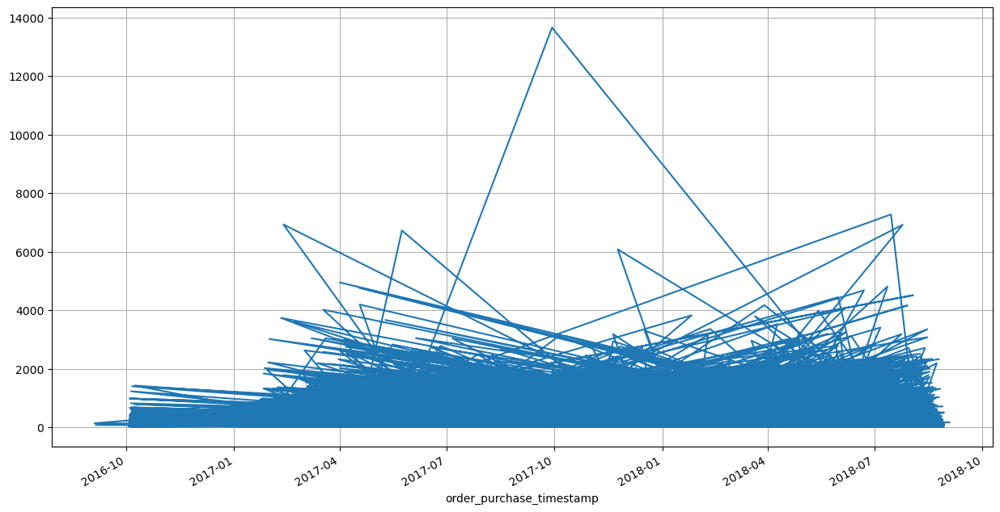

In [157]:
df_final['sales'].plot();
plt.grid()

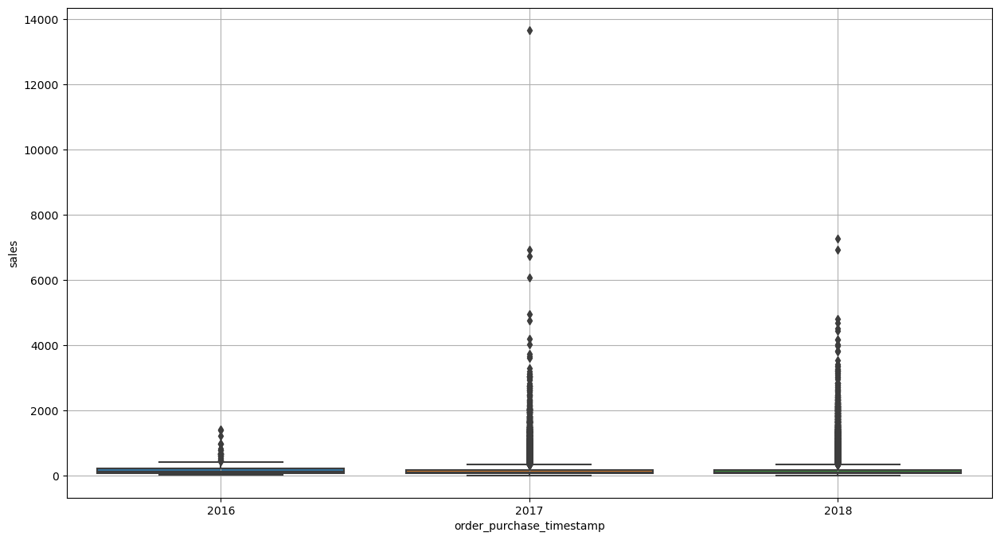

In [158]:
sns.boxplot(x = df_final.index.year,y = df_final['sales'])
plt.grid();

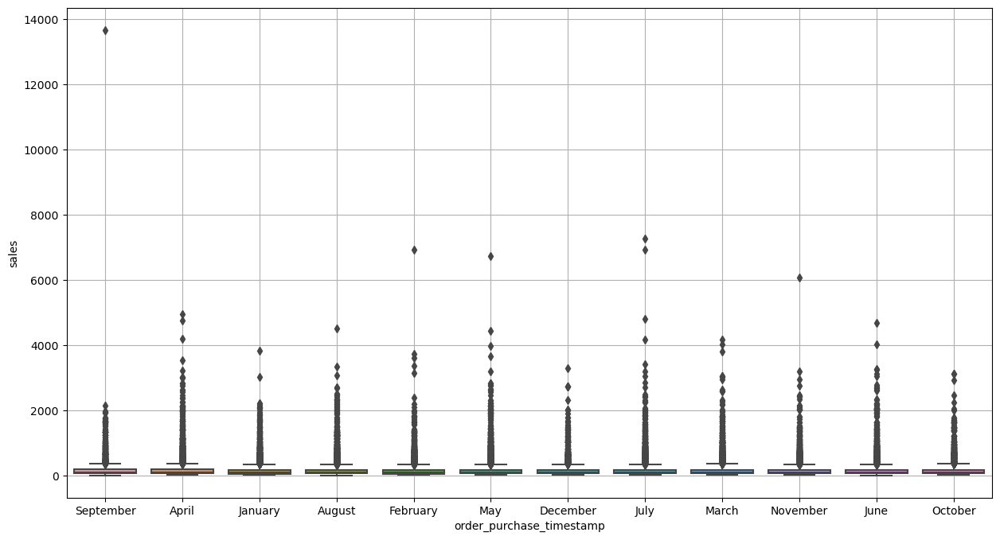

In [159]:
sns.boxplot(x = df_final.index.month_name(),y = df_final['sales'])
plt.grid()

In [160]:
df_date['Time_Stamp'] = pd.to_datetime(df_date['Time_Stamp'])
df_model = df_date.set_index('Time_Stamp')
df_model.drop(['order_purchase_timestamp'], axis=1, inplace=True)
df_model.head()

,sales
Time_Stamp,
2018-08-15,72.19
2018-08-16,259.83
2018-08-17,216.87
2018-08-20,25.78
2018-08-21,218.04


In [161]:
df_model.index = pd.to_datetime(df_model.index)

In [162]:
from statsmodels.tsa.seasonal import seasonal_decompose

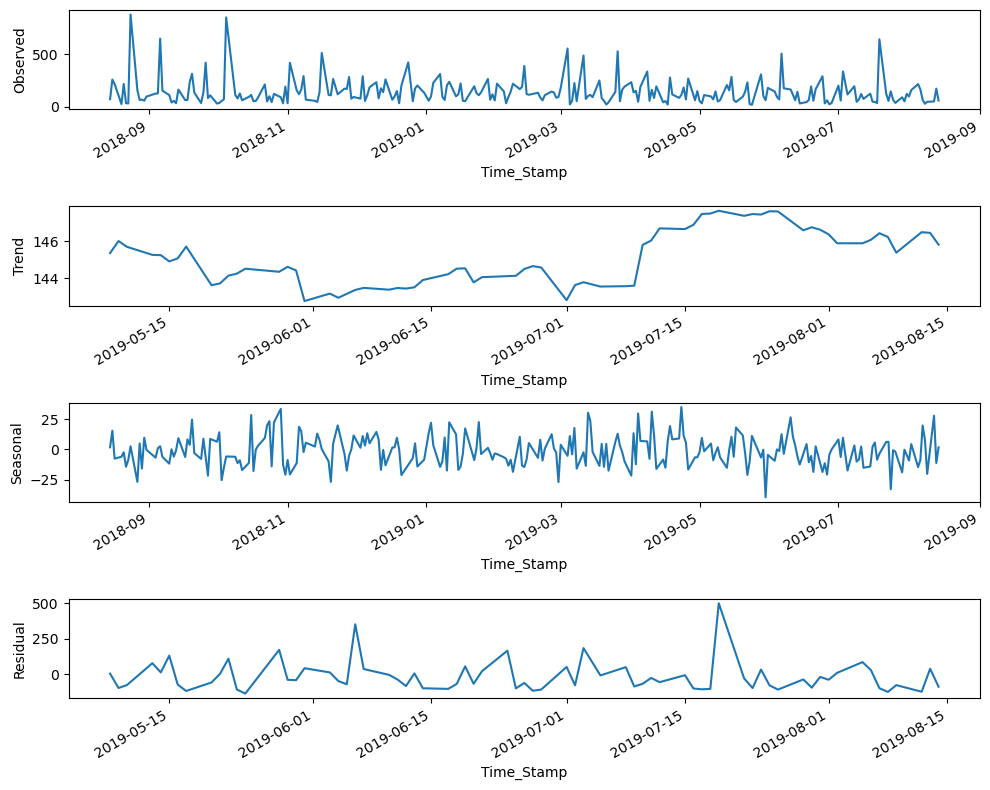

In [163]:
decomposition = seasonal_decompose(df_model['sales'], model='additive', period=365)
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(10, 8))
decomposition.observed.plot(ax=ax1)
ax1.set_ylabel('Observed')
decomposition.trend.plot(ax=ax2)
ax2.set_ylabel('Trend')
decomposition.seasonal.plot(ax=ax3)
ax3.set_ylabel('Seasonal')
decomposition.resid.plot(ax=ax4)
ax4.set_ylabel('Residual')

plt.tight_layout()
plt.show()

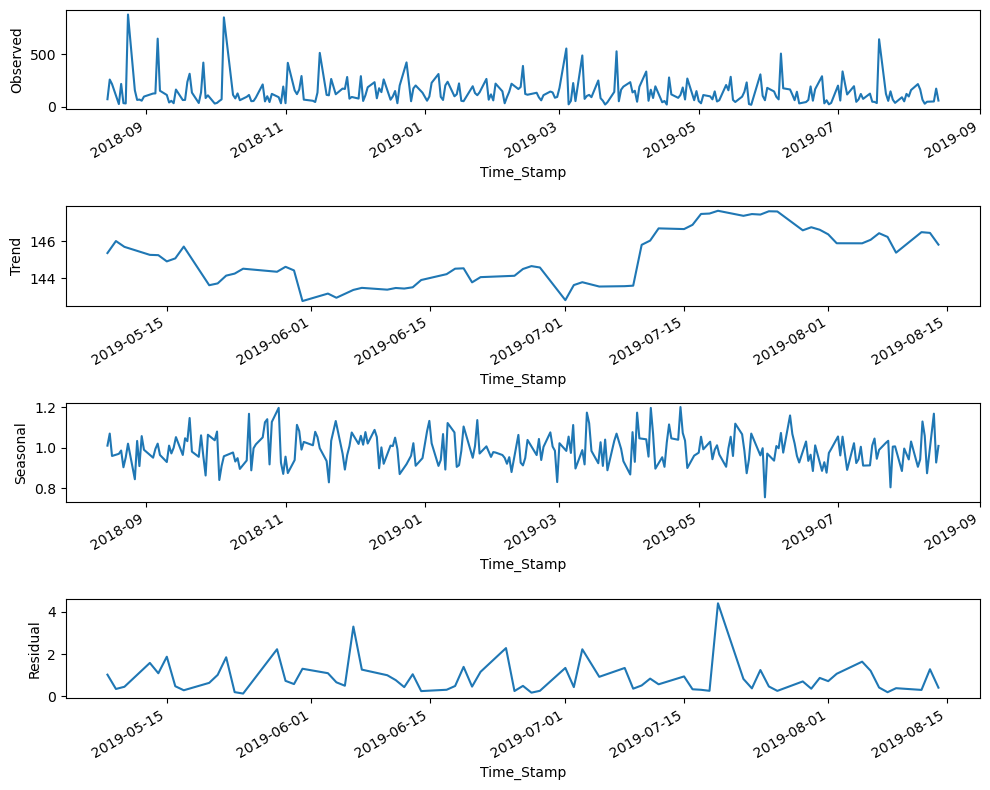

In [164]:
decomposition = seasonal_decompose(df_model['sales'], model='multiplicative', period=365)
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(10, 8))
decomposition.observed.plot(ax=ax1)
ax1.set_ylabel('Observed')
decomposition.trend.plot(ax=ax2)
ax2.set_ylabel('Trend')
decomposition.seasonal.plot(ax=ax3)
ax3.set_ylabel('Seasonal')
decomposition.resid.plot(ax=ax4)
ax4.set_ylabel('Residual')

plt.tight_layout()
plt.show()

In [165]:
trend = decomposition.trend
seasonality = decomposition.seasonal
residual = decomposition.resid

print('Trend','\n',trend.head(12),'\n')
print('Seasonality','\n',seasonality.head(12),'\n')
print('Residual','\n',residual.head(12),'\n')

Trend 
 Time_Stamp
2018-08-15   NaN
2018-08-16   NaN
2018-08-17   NaN
2018-08-20   NaN
2018-08-21   NaN
2018-08-22   NaN
2018-08-23   NaN
2018-08-24   NaN
2018-08-27   NaN
2018-08-28   NaN
2018-08-29   NaN
2018-08-30   NaN
Name: trend, dtype: float64 

Seasonality 
 Time_Stamp
2018-08-15    1.010499
2018-08-16    1.069789
2018-08-17    0.959620
2018-08-20    0.970189
2018-08-21    0.986386
2018-08-22    0.904023
2018-08-23    0.952159
2018-08-24    1.020238
2018-08-27    0.845204
2018-08-28    1.033542
2018-08-29    0.909871
2018-08-30    1.057298
Name: seasonal, dtype: float64 

Residual 
 Time_Stamp
2018-08-15   NaN
2018-08-16   NaN
2018-08-17   NaN
2018-08-20   NaN
2018-08-21   NaN
2018-08-22   NaN
2018-08-23   NaN
2018-08-24   NaN
2018-08-27   NaN
2018-08-28   NaN
2018-08-29   NaN
2018-08-30   NaN
Name: resid, dtype: float64 



In [166]:
df_olist['Time_Stamp'] = pd.DataFrame(date,columns=['Date'])
df_olist.head()


,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region,major_category,order_year,order_month,order_dayofweek,Time_Stamp
0,2,2017-09-13,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,72.19,28013,728,18,2017-09-19 09:45:35,20,599,22,4,4,11,2017,9,2,2018-08-15
1,2,2017-04-26,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,259.83,15775,3228,25,2017-05-03 11:05:13,60,511,22,4,4,9,2017,4,2,2018-08-16
2,2,2018-01-14,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,216.87,35661,2616,10,2018-01-18 14:48:30,39,76,8,4,4,6,2018,1,6,2018-08-17
3,2,2018-08-08,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20,4.0,25.78,12952,324,25,2018-08-15 10:10:18,59,195,22,4,4,5,2018,8,2,2018-08-20
4,2,2017-02-04,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17,5.0,218.04,13226,3953,25,2017-02-13 13:57:51,42,301,15,4,3,6,2017,2,5,2018-08-21


In [167]:
df_olist['Time_Stamp'] = pd.to_datetime(df_olist['Time_Stamp'])
df_final_model = df_olist.set_index('Time_Stamp')
#df_final_model.drop(['Date'], axis=1, inplace=True)
df_final_model

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region,major_category,order_year,order_month,order_dayofweek
Time_Stamp,,,,,,,,,,,,,,,,,,,,,
2018-08-15,2,2017-09-13,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,72.19,28013,728,18,2017-09-19 09:45:35,20,599,22,4,4,11,2017,9,2
2018-08-16,2,2017-04-26,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,259.83,15775,3228,25,2017-05-03 11:05:13,60,511,22,4,4,9,2017,4,2
2018-08-17,2,2018-01-14,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,216.87,35661,2616,10,2018-01-18 14:48:30,39,76,8,4,4,6,2018,1,6
2018-08-20,2,2018-08-08,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20,4.0,25.78,12952,324,25,2018-08-15 10:10:18,59,195,22,4,4,5,2018,8,2
2018-08-21,2,2017-02-04,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17,5.0,218.04,13226,3953,25,2017-02-13 13:57:51,42,301,15,4,3,6,2017,2,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NaT,2,2018-04-23,2018-04-25 04:11:01,2018-04-25 12:09:00,2018-05-10 22:56:40,2018-05-18,5.0,343.40,65077,3501,9,2018-05-02 04:11:01,49,247,20,2,3,6,2018,4,0
NaT,2,2018-07-14,2018-07-17 04:31:48,2018-07-17 08:05:00,2018-07-23 20:31:55,2018-08-01,5.0,386.53,81690,1126,17,2018-07-20 04:31:48,15,511,22,3,4,2,2018,7,5
NaT,2,2017-10-23,2017-10-24 17:14:25,2017-10-26 15:13:14,2017-10-28 12:22:22,2017-11-10,5.0,116.85,4039,3530,25,2017-10-30 17:14:25,65,158,15,4,3,11,2017,10,0


In [168]:
df_final_model['Month'] = df_final_model.index.month
df_final_model['Year'] = df_final_model.index.year
df_final_model.head()

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region,major_category,order_year,order_month,order_dayofweek,Month,Year
Time_Stamp,,,,,,,,,,,,,,,,,,,,,,,
2018-08-15,2,2017-09-13,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,72.19,28013,728,18,2017-09-19 09:45:35,20,599,22,4,4,11,2017,9,2,8.0,2018.0
2018-08-16,2,2017-04-26,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,259.83,15775,3228,25,2017-05-03 11:05:13,60,511,22,4,4,9,2017,4,2,8.0,2018.0
2018-08-17,2,2018-01-14,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,216.87,35661,2616,10,2018-01-18 14:48:30,39,76,8,4,4,6,2018,1,6,8.0,2018.0
2018-08-20,2,2018-08-08,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20,4.0,25.78,12952,324,25,2018-08-15 10:10:18,59,195,22,4,4,5,2018,8,2,8.0,2018.0
2018-08-21,2,2017-02-04,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17,5.0,218.04,13226,3953,25,2017-02-13 13:57:51,42,301,15,4,3,6,2017,2,5,8.0,2018.0


In [169]:
df_final_model.tail()

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region,major_category,order_year,order_month,order_dayofweek,Month,Year
Time_Stamp,,,,,,,,,,,,,,,,,,,,,,,
NaT,2,2018-04-23,2018-04-25 04:11:01,2018-04-25 12:09:00,2018-05-10 22:56:40,2018-05-18,5.0,343.40,65077,3501,9,2018-05-02 04:11:01,49,247,20,2,3,6,2018,4,0,NaN,NaN
NaT,2,2018-07-14,2018-07-17 04:31:48,2018-07-17 08:05:00,2018-07-23 20:31:55,2018-08-01,5.0,386.53,81690,1126,17,2018-07-20 04:31:48,15,511,22,3,4,2,2018,7,5,NaN,NaN
NaT,2,2017-10-23,2017-10-24 17:14:25,2017-10-26 15:13:14,2017-10-28 12:22:22,2017-11-10,5.0,116.85,4039,3530,25,2017-10-30 17:14:25,65,158,15,4,3,11,2017,10,0,NaN,NaN
NaT,2,2017-08-14,2017-08-15 00:04:32,2017-08-15 19:02:53,2017-08-16 21:59:40,2017-08-25,5.0,64.71,13289,4002,25,2017-08-21 00:04:32,15,511,22,4,4,2,2017,8,0,NaN,NaN
NaT,2,2018-06-09,2018-06-09 17:10:13,2018-06-11 14:11:00,2018-06-14 17:56:26,2018-06-28,5.0,55.79,18605,536,25,2018-06-12 17:10:13,7,225,22,4,4,6,2018,6,5,NaN,NaN


In [170]:
train= df_final_model[pd.to_datetime(df_final_model['order_purchase_timestamp']) < pd.to_datetime('2018-03-31')]
train.shape

(64269, 23)

In [171]:
test= df_final_model[pd.to_datetime(df_final_model['order_purchase_timestamp']) >= pd.to_datetime('2018-03-31')]
test.shape

(32475, 23)

In [172]:
train_final = train[['sales']]
test_final=test[['sales']]

In [173]:
print(train_final.shape)
print(test_final.shape)

(64269, 1)
(32475, 1)


In [174]:
train_final.tail()

,sales
Time_Stamp,
NaT,15.86
NaT,39.96
NaT,356.76
NaT,116.85
NaT,64.71


In [175]:
test_final.tail()

,sales
Time_Stamp,
NaT,40.27
NaT,139.88
NaT,343.40
NaT,386.53
NaT,55.79


#### Check for stationarity of the series at = 0.05 using appropriate statistical tests.

In [176]:
from statsmodels.tsa.stattools import adfuller
def test_stationarity(timeseries):
    
    #Determing rolling statistics
    rolmean = timeseries.rolling(window=7).mean()
    rolstd = timeseries.rolling(window=7).std()

    #Plot rolling statistics:
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    #Perform Dickey-Fuller test:
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput,'\n')

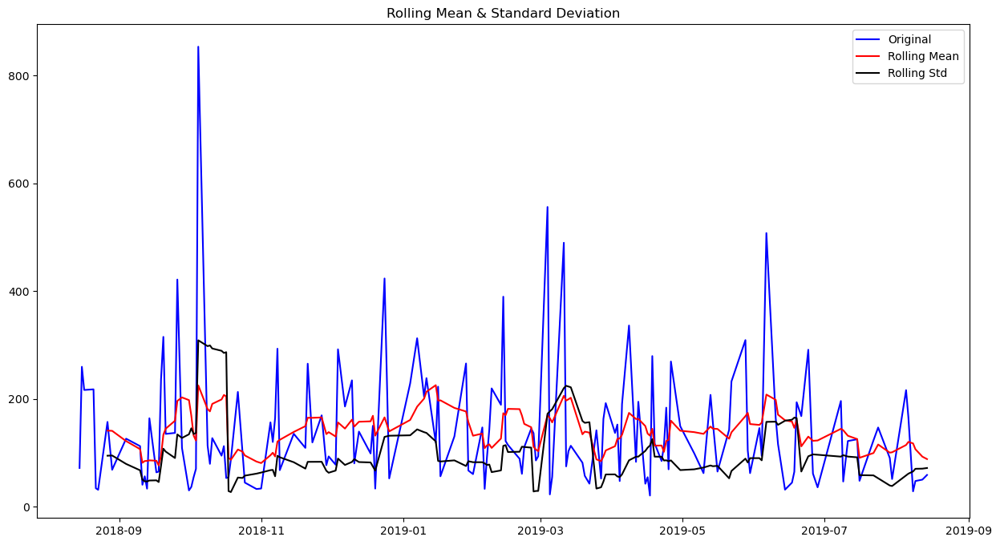

Results of Dickey-Fuller Test:
Test Statistic                  -251.637612
p-value                            0.000000
#Lags Used                         0.000000
Number of Observations Used    64268.000000
Critical Value (1%)               -3.430452
Critical Value (5%)               -2.861585
Critical Value (10%)              -2.566794
dtype: float64 



In [177]:
test_stationarity(train_final['sales'])

In [178]:
## Series is stationary at 5% Alpha as per Dicky Fuller

In [179]:
import itertools
p = q = range(0, 3)
d= range(0,1)
pdq = list(itertools.product(p, d, q))

model_pdq = [(x[0], x[1], x[2], 5) for x in list(itertools.product(p, d, q))]
print('Examples of parameter combinations for Model...')
print('Model: {}{}'.format(pdq[1], model_pdq[1]))
print('Model: {}{}'.format(pdq[1], model_pdq[2]))
print('Model: {}{}'.format(pdq[2], model_pdq[3]))
print('Model: {}{}'.format(pdq[2], model_pdq[4]))

Examples of parameter combinations for Model...
Model: (0, 0, 1)(0, 0, 1, 5)
Model: (0, 0, 1)(0, 0, 2, 5)
Model: (0, 0, 2)(1, 0, 0, 5)
Model: (0, 0, 2)(1, 0, 1, 5)


# Build an ARIMA model.

In [180]:
# Creating an empty Dataframe with column names only
results_df = pd.DataFrame(columns=['param', 'AIC'])
results_df

,param,AIC


In [181]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA

# Define the range of parameters for grid search (p, d, q)
p_values = range(0, 3)
d_values = range(0, 2)
q_values = range(0, 3)

# Generate all possible combinations of (p, d, q)
pdq = [(p, d, q) for p in p_values for d in d_values for q in q_values]

# Assuming train_final is your training dataset with a 'sales' column

# Initialize an empty DataFrame to store results
results_df = pd.DataFrame(columns=['param', 'AIC'])

# Perform grid search
for param in pdq:
    try:
        mod = ARIMA(train_final['sales'], order=param)
        results_Arima = mod.fit()
        print('ARIMA{} - AIC:{}'.format(param, results_Arima.aic))
        results_df = results_df.append({'param': param, 'AIC': results_Arima.aic}, ignore_index=True)
    except:
        continue

# Display the results DataFrame
print(results_df)

ARIMA(0, 0, 0) - AIC:872280.8772917977
ARIMA(0, 0, 1) - AIC:872279.3778766389
ARIMA(0, 0, 2) - AIC:872280.6643279372
ARIMA(0, 1, 0) - AIC:916335.7885734597
ARIMA(0, 1, 1) - AIC:872296.9943445895
ARIMA(0, 1, 2) - AIC:872292.4176401129
ARIMA(1, 0, 0) - AIC:872279.3546247294
ARIMA(1, 0, 1) - AIC:872280.6439210615
ARIMA(1, 0, 2) - AIC:872282.5568124789
ARIMA(1, 1, 0) - AIC:898024.3703582692
ARIMA(1, 1, 1) - AIC:872279.2812589972
ARIMA(1, 1, 2) - AIC:872283.9991294688
ARIMA(2, 0, 0) - AIC:872280.663232103
ARIMA(2, 0, 1) - AIC:872282.6415151625
ARIMA(2, 0, 2) - AIC:872284.6893583401
ARIMA(2, 1, 0) - AIC:890618.3360700534
ARIMA(2, 1, 1) - AIC:872279.157885382
ARIMA(2, 1, 2) - AIC:872281.555717288
Empty DataFrame
Columns: [param, AIC]
Index: []


In [182]:
results_df.sort_values(by=['AIC'])

,param,AIC


In [183]:
## ARIMA(2,1,1) has the lowest AIC

mod = ARIMA(train_final['sales'], order=(2,1,1))

results_Arima = mod.fit()

print(results_Arima.summary())

                               SARIMAX Results                                
Dep. Variable:                  sales   No. Observations:                64269
Model:                 ARIMA(2, 1, 1)   Log Likelihood             -436135.579
Date:                Wed, 03 Jul 2024   AIC                         872279.158
Time:                        11:01:19   BIC                         872315.441
Sample:                             0   HQIC                        872290.392
                              - 64269                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0074      0.004      1.978      0.048    6.59e-05       0.015
ar.L2          0.0033      0.004      0.834      0.404      -0.004       0.011
ma.L1         -1.0000      0.000  -4508.443      0.0

In [184]:
final_hat_avg =test_final.copy()
pred_ARIMA = results_Arima.forecast(steps=len(test_final))
pred_ARIMA

64269    157.686304
64270    158.202491
64271    158.513963
64272    158.517978
64273    158.519038
            ...    
96739    158.519063
96740    158.519063
96741    158.519063
96742    158.519063
96743    158.519063
Name: predicted_mean, Length: 32475, dtype: float64

In [185]:
from math import sqrt
from sklearn.metrics import  mean_squared_error
rmse = sqrt(mean_squared_error(test_final.sales,pred_ARIMA))
print(rmse)

232.77796251022784


In [186]:
resultsDf = pd.DataFrame({'Test RMSE': rmse}
                           ,index=['ARIMA(1, 0, 2)'])

resultsDf

,Test RMSE
"ARIMA(1, 0, 2)",232.777963


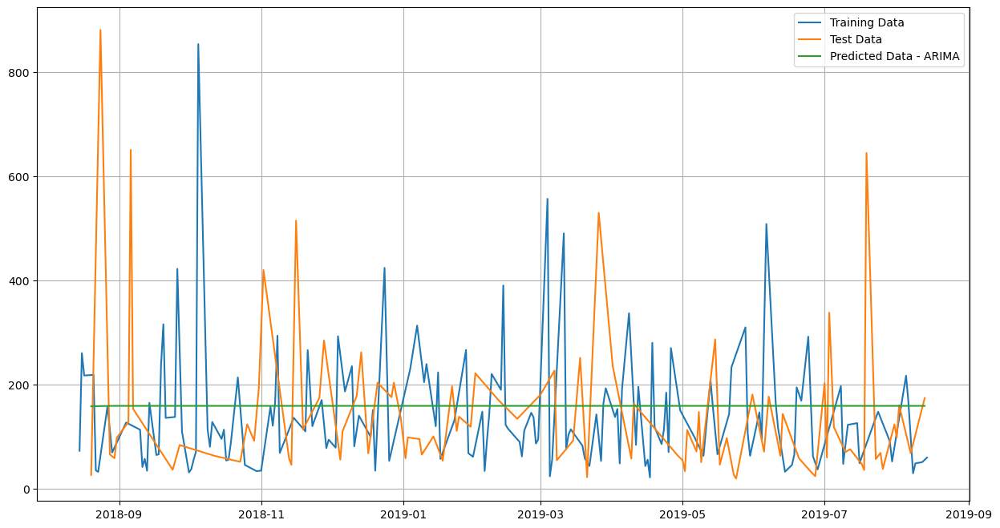

In [187]:
plt.plot(train_final,label='Training Data')
plt.plot(test_final,label='Test Data')
plt.plot(test_final.index,pred_ARIMA,label='Predicted Data - ARIMA')
plt.legend(loc='best')
plt.grid();

# Sarimax

In [188]:
dfObj2 = pd.DataFrame(columns=['param','seasonal', 'AIC'])
dfObj2

,param,seasonal,AIC


In [189]:
import statsmodels.api as sm
for param in pdq:
    for param_seasonal in model_pdq:
        mod = sm.tsa.statespace.SARIMAX(train_final['sales'],
                                        order=param,
                                        seasonal_order=param_seasonal,
                                        enforce_stationarity=False,
                                        enforce_invertibility=False)
        results_SARIMA = mod.fit()
        print('SARIMA{}x{}7 - AIC:{}'.format(param, param_seasonal, results_SARIMA.aic))
        
        # Append data to dfObj2 using loc
        dfObj2.loc[len(dfObj2)] = {'param': param, 'seasonal': param_seasonal, 'AIC': results_SARIMA.aic}

SARIMA(0, 0, 0)x(0, 0, 0, 5)7 - AIC:900310.5432825675
SARIMA(0, 0, 0)x(0, 0, 1, 5)7 - AIC:894467.8476465582
SARIMA(0, 0, 0)x(0, 0, 2, 5)7 - AIC:891299.5850833267
SARIMA(0, 0, 0)x(1, 0, 0, 5)7 - AIC:891520.3100149094
SARIMA(0, 0, 0)x(1, 0, 1, 5)7 - AIC:872442.1569143592
SARIMA(0, 0, 0)x(1, 0, 2, 5)7 - AIC:872302.3514891608
SARIMA(0, 0, 0)x(2, 0, 0, 5)7 - AIC:887077.7874544247
SARIMA(0, 0, 0)x(2, 0, 1, 5)7 - AIC:872394.4421438312
SARIMA(0, 0, 0)x(2, 0, 2, 5)7 - AIC:872245.984333905
SARIMA(0, 0, 1)x(0, 0, 0, 5)7 - AIC:894487.1468853258
SARIMA(0, 0, 1)x(0, 0, 1, 5)7 - AIC:891194.0945879079
SARIMA(0, 0, 1)x(0, 0, 2, 5)7 - AIC:889100.9192322145
SARIMA(0, 0, 1)x(1, 0, 0, 5)7 - AIC:889706.1845786005
SARIMA(0, 0, 1)x(1, 0, 1, 5)7 - AIC:877304.4662435586
SARIMA(0, 0, 1)x(1, 0, 2, 5)7 - AIC:878310.2567249244
SARIMA(0, 0, 1)x(2, 0, 0, 5)7 - AIC:886381.7910285273
SARIMA(0, 0, 1)x(2, 0, 1, 5)7 - AIC:877436.3606760078
SARIMA(0, 0, 1)x(2, 0, 2, 5)7 - AIC:876678.8002245359
SARIMA(0, 0, 2)x(0, 0, 0, 5)7

KeyboardInterrupt: 

In [ ]:
dfObj2.sort_values(by=['AIC'])

In [ ]:
## SARIMA(0, 1, 2)	(1, 0, 2, 5) - AIC:872115.283466
mod = sm.tsa.statespace.SARIMAX(train_final['sales'],
                                order=(0,1,2),
                                seasonal_order=(1,0,2,5),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results = mod.fit()
print(results.summary())

In [ ]:
results.plot_diagnostics(figsize=(16, 8))
plt.show()

In [ ]:
final_hat_avg =test_final.copy()
pred_SARIMA = results.get_forecast(steps=len(test_final))
pred_SARIMA.predicted_mean

In [ ]:
from math import sqrt
from sklearn.metrics import mean_squared_error
rmse = sqrt(mean_squared_error(test_final.sales,pred_SARIMA.predicted_mean))
print(rmse)

In [ ]:
resultsDf_temp = pd.DataFrame({'Test RMSE': rmse}
                           ,index=['SARIMA(1, 0, 2)(0, 0, 2)5'])

resultsDf = pd.concat([resultsDf, resultsDf_temp])
resultsDf

In [ ]:
plt.plot(train_final,label='Training Data')
plt.plot(test_final,label='Test Data')
plt.plot(test_final.index,pred_ARIMA,label='Predicted Data - ARIMA')
plt.plot(test_final.index,pred_SARIMA.predicted_mean,label='Predicted Data - SARIMA')
plt.legend(loc='best')
plt.grid();

In [194]:
from prophet import Prophet
from prophet.plot import plot_plotly
from prophet.plot import add_changepoints_to_plot

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.offline as py
py.init_notebook_mode()
%matplotlib inline
import seaborn as sns
from pylab import rcParams

In [233]:
df = pd.read_csv('sales_forecasting_final.csv')

In [247]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 96742 entries, 0 to 96743
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_status                   96742 non-null  int64         
 1   order_purchase_timestamp       96742 non-null  datetime64[ns]
 2   order_approved_at              96742 non-null  object        
 3   order_delivered_carrier_date   96742 non-null  object        
 4   order_delivered_customer_date  96742 non-null  object        
 5   order_estimated_delivery_date  96742 non-null  object        
 6   review_score                   96742 non-null  float64       
 7   sales                          96742 non-null  float64       
 8   customer_zip_code_prefix       96742 non-null  int64         
 9   customer_city                  96742 non-null  int64         
 10  customer_state                 96742 non-null  int64         
 11  shipping_limit_date 

In [248]:
df.isnull().sum()

order_status                     0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
review_score                     0
sales                            0
customer_zip_code_prefix         0
customer_city                    0
customer_state                   0
shipping_limit_date              0
product_category_name_english    0
seller_city                      0
seller_state                     0
customer_region                  0
seller_region                    0
major_category                   0
order_year                       0
order_month                      0
order_dayofweek                  0
dtype: int64

In [250]:
df['order_purchase_timestamp'] = pd.to_datetime(df['order_purchase_timestamp'], errors='coerce')


In [251]:
# Set the date column as the index and ensure it's of datetime type
df['order_purchase_timestamp'] = pd.to_datetime(df['order_purchase_timestamp'])

In [252]:
# Define the date range
start_date = '2016-09-30'
end_date = '2018-09-30'
date_range = pd.date_range(start=start_date, end=end_date, freq='B')

# Filter the DataFrame to keep only the rows within the date range
df = df[(df['order_purchase_timestamp'] >= start_date) & (df['order_purchase_timestamp'] <= end_date)]

In [253]:
from pandas.tseries.offsets import BDay

In [254]:
df.shape

(96742, 21)

In [255]:
df.head()

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region,major_category,order_year,order_month,order_dayofweek
0,2,2017-09-13,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,72.19,28013,728,18,2017-09-19 09:45:35,20,599,22,4,4,11,2017,9,2
1,2,2017-04-26,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,259.83,15775,3228,25,2017-05-03 11:05:13,60,511,22,4,4,9,2017,4,2
2,2,2018-01-14,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,216.87,35661,2616,10,2018-01-18 14:48:30,39,76,8,4,4,6,2018,1,6
3,2,2018-08-08,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20,4.0,25.78,12952,324,25,2018-08-15 10:10:18,59,195,22,4,4,5,2018,8,2
4,2,2017-02-04,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17,5.0,218.04,13226,3953,25,2017-02-13 13:57:51,42,301,15,4,3,6,2017,2,5


In [256]:
# We have considered Sales as a dependent variable for this session.
df_date = df[['order_purchase_timestamp','sales']]

In [257]:
date1 = pd.date_range(start='2016-09-30', end='2018-09-30', freq=BDay())

In [258]:
date1

DatetimeIndex(['2016-09-30', '2016-10-03', '2016-10-04', '2016-10-05',
               '2016-10-06', '2016-10-07', '2016-10-10', '2016-10-11',
               '2016-10-12', '2016-10-13',
               ...
               '2018-09-17', '2018-09-18', '2018-09-19', '2018-09-20',
               '2018-09-21', '2018-09-24', '2018-09-25', '2018-09-26',
               '2018-09-27', '2018-09-28'],
              dtype='datetime64[ns]', length=521, freq='B')

In [259]:
from pandas.tseries.holiday import USFederalHolidayCalendar
from pandas.tseries.offsets import CustomBusinessDay
us_bd = CustomBusinessDay(calendar=USFederalHolidayCalendar())
us_bd

<CustomBusinessDay>

In [260]:
date = pd.date_range(start='2016-09-30', end='2018-09-30', freq=us_bd)

In [261]:
date

DatetimeIndex(['2016-09-30', '2016-10-03', '2016-10-04', '2016-10-05',
               '2016-10-06', '2016-10-07', '2016-10-11', '2016-10-12',
               '2016-10-13', '2016-10-14',
               ...
               '2018-09-17', '2018-09-18', '2018-09-19', '2018-09-20',
               '2018-09-21', '2018-09-24', '2018-09-25', '2018-09-26',
               '2018-09-27', '2018-09-28'],
              dtype='datetime64[ns]', length=501, freq='C')

In [264]:
df_date['Time_Stamp'] = pd.DataFrame(date,columns=['order_purchase_timestamp'])
df_date

,order_purchase_timestamp,sales,Time_Stamp
0,2017-09-13,72.19,2016-09-30
1,2017-04-26,259.83,2016-10-03
2,2018-01-14,216.87,2016-10-04
3,2018-08-08,25.78,2016-10-05
4,2017-02-04,218.04,2016-10-06
...,...,...,...
96739,2018-04-23,343.40,NaT
96740,2018-07-14,386.53,NaT
96741,2017-10-23,116.85,NaT
96742,2017-08-14,64.71,NaT


In [263]:
df_date['Time_Stamp'] = pd.to_datetime(df_date['Time_Stamp'], errors='coerce')


In [265]:
df_date

,order_purchase_timestamp,sales,Time_Stamp
0,2017-09-13,72.19,2016-09-30
1,2017-04-26,259.83,2016-10-03
2,2018-01-14,216.87,2016-10-04
3,2018-08-08,25.78,2016-10-05
4,2017-02-04,218.04,2016-10-06
...,...,...,...
96739,2018-04-23,343.40,NaT
96740,2018-07-14,386.53,NaT
96741,2017-10-23,116.85,NaT
96742,2017-08-14,64.71,NaT


In [266]:
df_date = df_date.dropna(subset=['Time_Stamp'])

In [267]:
df_date

,order_purchase_timestamp,sales,Time_Stamp
0,2017-09-13,72.19,2016-09-30
1,2017-04-26,259.83,2016-10-03
2,2018-01-14,216.87,2016-10-04
3,2018-08-08,25.78,2016-10-05
4,2017-02-04,218.04,2016-10-06
...,...,...,...
496,2018-07-30,44.30,2018-09-24
497,2018-01-23,168.27,2018-09-25
498,2018-05-24,69.16,2018-09-26
499,2017-04-06,319.44,2018-09-27


In [268]:
rcParams['figure.figsize'] = 15,8

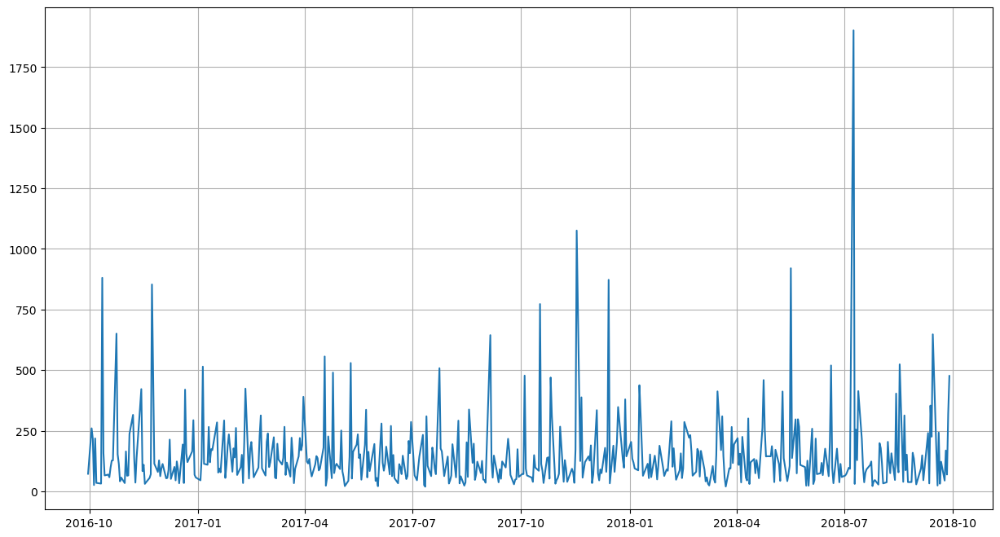

In [269]:
plt.plot(df_date['Time_Stamp'],df_date['sales']);
plt.grid()

In [270]:
df_date.describe()

,order_purchase_timestamp,sales,Time_Stamp
count,501,501.000000,501
mean,2018-01-10 16:37:21.916167680,149.718623,2017-10-01 12:30:10.778443264
min,2017-01-18 00:00:00,18.920000,2016-09-30 00:00:00
25%,2017-09-26 00:00:00,61.770000,2017-04-04 00:00:00
50%,2018-01-31 00:00:00,110.070000,2017-09-29 00:00:00
75%,2018-05-10 00:00:00,176.400000,2018-04-03 00:00:00
max,2018-08-28 00:00:00,1901.620000,2018-09-28 00:00:00
std,NaN,157.394284,NaN


In [271]:
df_final = pd.read_csv("sales_forecasting_final.csv",parse_dates=True,index_col=1)


In [272]:
df_final.head()

,order_status,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region,major_category,order_year,order_month,order_dayofweek
order_purchase_timestamp,,,,,,,,,,,,,,,,,,,,
2017-09-13,2,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,72.19,28013,728,18,2017-09-19 09:45:35,20,599,22,4,4,11,2017,9,2
2017-04-26,2,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,259.83,15775,3228,25,2017-05-03 11:05:13,60,511,22,4,4,9,2017,4,2
2018-01-14,2,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,216.87,35661,2616,10,2018-01-18 14:48:30,39,76,8,4,4,6,2018,1,6
2018-08-08,2,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20,4.0,25.78,12952,324,25,2018-08-15 10:10:18,59,195,22,4,4,5,2018,8,2
2017-02-04,2,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17,5.0,218.04,13226,3953,25,2017-02-13 13:57:51,42,301,15,4,3,6,2017,2,5


In [273]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 96744 entries, 2017-09-13 to 2018-06-09
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   order_status                   96744 non-null  int64  
 1   order_approved_at              96744 non-null  object 
 2   order_delivered_carrier_date   96744 non-null  object 
 3   order_delivered_customer_date  96744 non-null  object 
 4   order_estimated_delivery_date  96744 non-null  object 
 5   review_score                   96744 non-null  float64
 6   sales                          96744 non-null  float64
 7   customer_zip_code_prefix       96744 non-null  int64  
 8   customer_city                  96744 non-null  int64  
 9   customer_state                 96744 non-null  int64  
 10  shipping_limit_date            96744 non-null  object 
 11  product_category_name_english  96744 non-null  int64  
 12  seller_city                  

In [216]:
rcParams['figure.figsize'] = 15,8

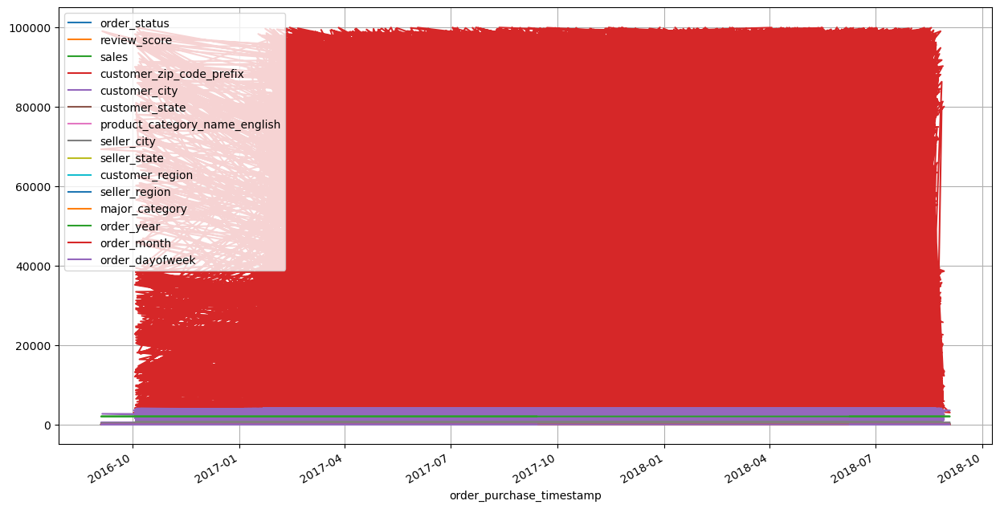

In [217]:
df_final.plot();
plt.grid()

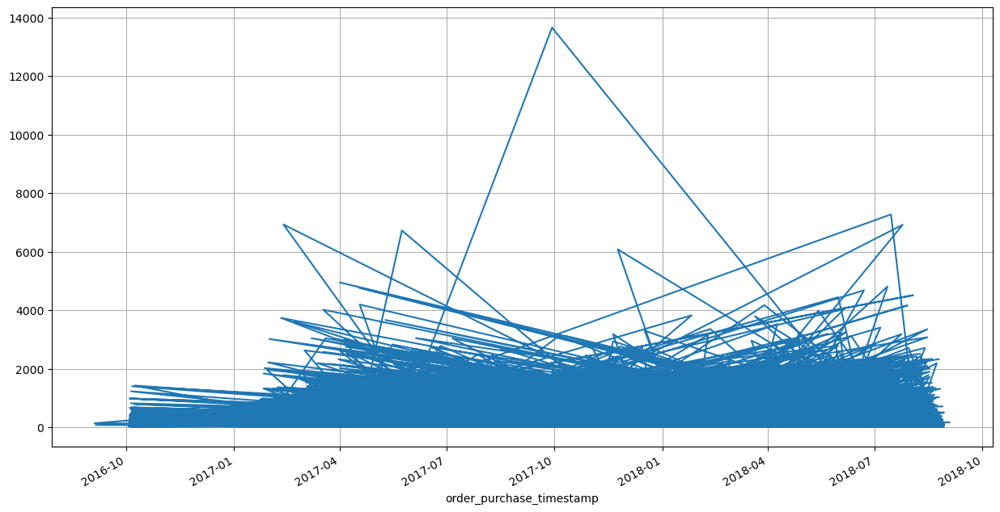

In [218]:
df_final['sales'].plot();
plt.grid()

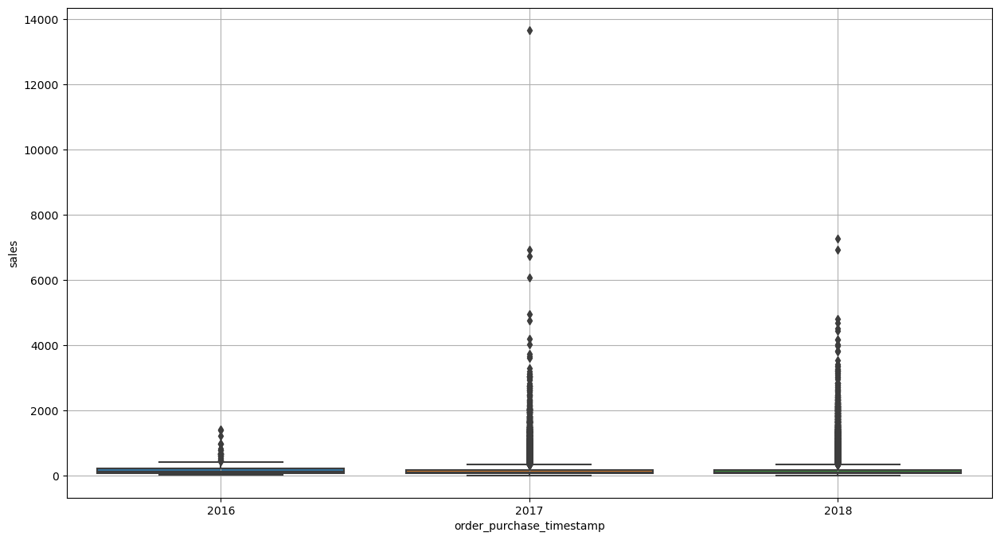

In [219]:
sns.boxplot(x = df_final.index.year,y = df_final['sales'])
plt.grid();

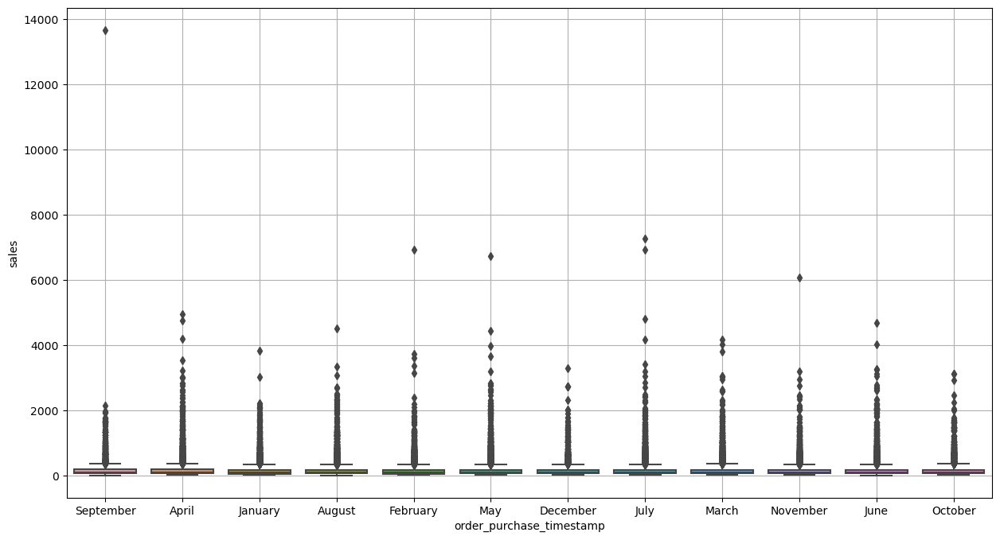

In [220]:
sns.boxplot(x = df_final.index.month_name(),y = df_final['sales'])
plt.grid();

In [274]:
df_date.head()

,order_purchase_timestamp,sales,Time_Stamp
0,2017-09-13,72.19,2016-09-30
1,2017-04-26,259.83,2016-10-03
2,2018-01-14,216.87,2016-10-04
3,2018-08-08,25.78,2016-10-05
4,2017-02-04,218.04,2016-10-06


In [275]:
df_date.tail()

,order_purchase_timestamp,sales,Time_Stamp
496,2018-07-30,44.30,2018-09-24
497,2018-01-23,168.27,2018-09-25
498,2018-05-24,69.16,2018-09-26
499,2017-04-06,319.44,2018-09-27
500,2017-01-31,475.96,2018-09-28


In [276]:
df_date['Time_Stamp'] = pd.to_datetime(df_date['Time_Stamp'])
df_model = df_date.set_index('Time_Stamp')
df_model.drop(['order_purchase_timestamp'], axis=1, inplace=True)
df_model.tail()

,sales
Time_Stamp,
2018-09-24,44.30
2018-09-25,168.27
2018-09-26,69.16
2018-09-27,319.44
2018-09-28,475.96


In [277]:
from    statsmodels.tsa.seasonal import   seasonal_decompose

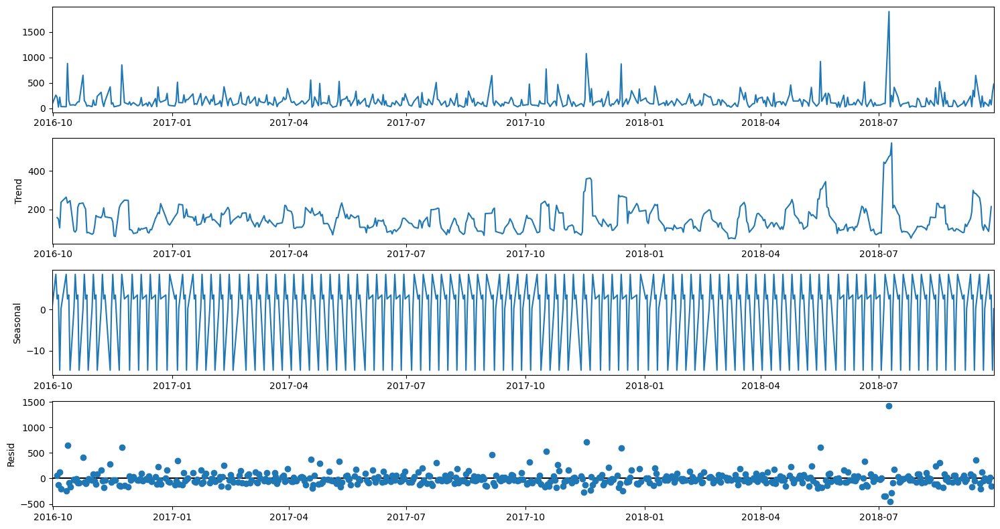

In [279]:
decomposition = seasonal_decompose(df_model,model='additive', period=5)
decomposition.plot();

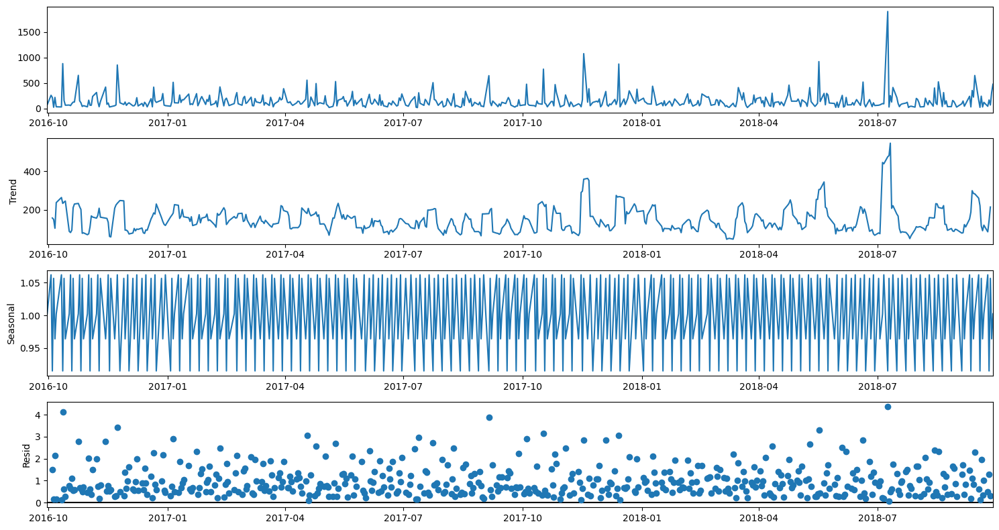

In [281]:
decomposition = seasonal_decompose(df_model,model='multiplicative', period=5)
decomposition.plot();

In [282]:
trend = decomposition.trend
seasonality = decomposition.seasonal
residual = decomposition.resid

print('Trend','\n',trend.head(12),'\n')
print('Seasonality','\n',seasonality.head(12),'\n')
print('Residual','\n',residual.head(12),'\n')

Trend 
 Time_Stamp
2016-09-30        NaN
2016-10-03        NaN
2016-10-04    158.542
2016-10-05    151.022
2016-10-06    105.406
2016-10-07    238.182
2016-10-11    264.546
2016-10-12    234.016
2016-10-13    240.872
2016-10-14    246.118
2016-10-17     89.432
2016-10-18     83.220
Name: trend, dtype: float64 

Seasonality 
 Time_Stamp
2016-09-30    1.002333
2016-10-03    1.062057
2016-10-04    0.914928
2016-10-05    1.056633
2016-10-06    0.964048
2016-10-07    1.002333
2016-10-11    1.062057
2016-10-12    0.914928
2016-10-13    1.056633
2016-10-14    0.964048
2016-10-17    1.002333
2016-10-18    1.062057
Name: seasonal, dtype: float64 

Residual 
 Time_Stamp
2016-09-30         NaN
2016-10-03         NaN
2016-10-04    1.495093
2016-10-05    0.161554
2016-10-06    2.145716
2016-10-07    0.144887
2016-10-11    0.113004
2016-10-12    4.113582
2016-10-13    0.619221
2016-10-14    0.275594
2016-10-17    0.768290
2016-10-18    0.655998
Name: resid, dtype: float64 



In [289]:
### We will consider the original dataset and subseqeuntly we would require exogeneous variables

df['Time_Stamp'] = pd.DataFrame(date,columns=['order_purchase_timestamp'])
df.head()
df.tail()

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region,major_category,order_year,order_month,order_dayofweek,Time_Stamp
496,2,2018-07-30,2018-07-30 20:00:18,2018-07-31 10:02:00,2018-08-06 19:58:26,2018-08-15,4.0,44.30,70040,548,6,2018-08-01 20:00:18,70,511,22,0,4,3,2018,7,0,2018-09-24
497,2,2018-01-23,2018-01-25 02:38:30,2018-01-26 18:32:31,2018-02-03 17:19:45,2018-02-07,5.0,168.27,1532,3530,25,2018-01-31 02:38:30,20,511,22,4,4,11,2018,1,1,2018-09-25
498,2,2018-05-24,2018-05-24 12:59:20,2018-05-25 10:33:00,2018-05-28 12:17:39,2018-06-11,5.0,69.16,1546,3530,25,2018-05-28 12:59:20,7,405,22,4,4,6,2018,5,3,2018-09-26
499,2,2017-04-06,2017-04-06 22:10:11,2017-04-07 13:47:55,2017-04-20 13:59:47,2017-05-12,1.0,319.44,62270,1523,5,2017-04-12 22:10:11,59,398,16,2,4,5,2017,4,3,2018-09-27
500,3,2017-01-31,2017-02-02 02:41:22,2017-02-04 22:32:18,2017-02-14 06:02:50,2017-03-09,1.0,475.96,93224,3578,22,2017-02-04 13:06:05,57,158,15,3,3,8,2017,1,1,2018-09-28


In [290]:
df['Time_Stamp'] = pd.to_datetime(df['Time_Stamp'])
df_final_model = df.set_index('Time_Stamp')
#df_final_model.drop(['order_purchase_timestamp'], axis=1, inplace=True)
df_final_model

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region,major_category,order_year,order_month,order_dayofweek
Time_Stamp,,,,,,,,,,,,,,,,,,,,,
2016-09-30,2,2017-09-13,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,72.19,28013,728,18,2017-09-19 09:45:35,20,599,22,4,4,11,2017,9,2
2016-10-03,2,2017-04-26,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,259.83,15775,3228,25,2017-05-03 11:05:13,60,511,22,4,4,9,2017,4,2
2016-10-04,2,2018-01-14,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,216.87,35661,2616,10,2018-01-18 14:48:30,39,76,8,4,4,6,2018,1,6
2016-10-05,2,2018-08-08,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20,4.0,25.78,12952,324,25,2018-08-15 10:10:18,59,195,22,4,4,5,2018,8,2
2016-10-06,2,2017-02-04,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17,5.0,218.04,13226,3953,25,2017-02-13 13:57:51,42,301,15,4,3,6,2017,2,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-09-24,2,2018-07-30,2018-07-30 20:00:18,2018-07-31 10:02:00,2018-08-06 19:58:26,2018-08-15,4.0,44.30,70040,548,6,2018-08-01 20:00:18,70,511,22,0,4,3,2018,7,0
2018-09-25,2,2018-01-23,2018-01-25 02:38:30,2018-01-26 18:32:31,2018-02-03 17:19:45,2018-02-07,5.0,168.27,1532,3530,25,2018-01-31 02:38:30,20,511,22,4,4,11,2018,1,1
2018-09-26,2,2018-05-24,2018-05-24 12:59:20,2018-05-25 10:33:00,2018-05-28 12:17:39,2018-06-11,5.0,69.16,1546,3530,25,2018-05-28 12:59:20,7,405,22,4,4,6,2018,5,3


In [293]:
# Split the series into train and test
df_final_model['Month'] = df_final_model.index.month
df_final_model['Year'] = df_final_model.index.year
df_final_model.head()

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region,major_category,order_year,order_month,order_dayofweek,Month,Year
Time_Stamp,,,,,,,,,,,,,,,,,,,,,,,
2016-09-30,2,2017-09-13,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,72.19,28013,728,18,2017-09-19 09:45:35,20,599,22,4,4,11,2017,9,2,9,2016
2016-10-03,2,2017-04-26,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,259.83,15775,3228,25,2017-05-03 11:05:13,60,511,22,4,4,9,2017,4,2,10,2016
2016-10-04,2,2018-01-14,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,216.87,35661,2616,10,2018-01-18 14:48:30,39,76,8,4,4,6,2018,1,6,10,2016
2016-10-05,2,2018-08-08,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20,4.0,25.78,12952,324,25,2018-08-15 10:10:18,59,195,22,4,4,5,2018,8,2,10,2016
2016-10-06,2,2017-02-04,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17,5.0,218.04,13226,3953,25,2017-02-13 13:57:51,42,301,15,4,3,6,2017,2,5,10,2016


In [294]:
df_final_model

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region,major_category,order_year,order_month,order_dayofweek,Month,Year
Time_Stamp,,,,,,,,,,,,,,,,,,,,,,,
2016-09-30,2,2017-09-13,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,5.0,72.19,28013,728,18,2017-09-19 09:45:35,20,599,22,4,4,11,2017,9,2,9,2016
2016-10-03,2,2017-04-26,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,4.0,259.83,15775,3228,25,2017-05-03 11:05:13,60,511,22,4,4,9,2017,4,2,10,2016
2016-10-04,2,2018-01-14,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,5.0,216.87,35661,2616,10,2018-01-18 14:48:30,39,76,8,4,4,6,2018,1,6,10,2016
2016-10-05,2,2018-08-08,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20,4.0,25.78,12952,324,25,2018-08-15 10:10:18,59,195,22,4,4,5,2018,8,2,10,2016
2016-10-06,2,2017-02-04,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17,5.0,218.04,13226,3953,25,2017-02-13 13:57:51,42,301,15,4,3,6,2017,2,5,10,2016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-09-24,2,2018-07-30,2018-07-30 20:00:18,2018-07-31 10:02:00,2018-08-06 19:58:26,2018-08-15,4.0,44.30,70040,548,6,2018-08-01 20:00:18,70,511,22,0,4,3,2018,7,0,9,2018
2018-09-25,2,2018-01-23,2018-01-25 02:38:30,2018-01-26 18:32:31,2018-02-03 17:19:45,2018-02-07,5.0,168.27,1532,3530,25,2018-01-31 02:38:30,20,511,22,4,4,11,2018,1,1,9,2018
2018-09-26,2,2018-05-24,2018-05-24 12:59:20,2018-05-25 10:33:00,2018-05-28 12:17:39,2018-06-11,5.0,69.16,1546,3530,25,2018-05-28 12:59:20,7,405,22,4,4,6,2018,5,3,9,2018


In [295]:
df.tail()

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region,major_category,order_year,order_month,order_dayofweek,Time_Stamp
496,2,2018-07-30,2018-07-30 20:00:18,2018-07-31 10:02:00,2018-08-06 19:58:26,2018-08-15,4.0,44.30,70040,548,6,2018-08-01 20:00:18,70,511,22,0,4,3,2018,7,0,2018-09-24
497,2,2018-01-23,2018-01-25 02:38:30,2018-01-26 18:32:31,2018-02-03 17:19:45,2018-02-07,5.0,168.27,1532,3530,25,2018-01-31 02:38:30,20,511,22,4,4,11,2018,1,1,2018-09-25
498,2,2018-05-24,2018-05-24 12:59:20,2018-05-25 10:33:00,2018-05-28 12:17:39,2018-06-11,5.0,69.16,1546,3530,25,2018-05-28 12:59:20,7,405,22,4,4,6,2018,5,3,2018-09-26
499,2,2017-04-06,2017-04-06 22:10:11,2017-04-07 13:47:55,2017-04-20 13:59:47,2017-05-12,1.0,319.44,62270,1523,5,2017-04-12 22:10:11,59,398,16,2,4,5,2017,4,3,2018-09-27
500,3,2017-01-31,2017-02-02 02:41:22,2017-02-04 22:32:18,2017-02-14 06:02:50,2017-03-09,1.0,475.96,93224,3578,22,2017-02-04 13:06:05,57,158,15,3,3,8,2017,1,1,2018-09-28


In [296]:
train= df_final_model[pd.to_datetime(df_final_model['order_purchase_timestamp']) < pd.to_datetime('2018-09-30')]
train.shape

(501, 23)

In [297]:
df_final_model.tail()

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region,major_category,order_year,order_month,order_dayofweek,Month,Year
Time_Stamp,,,,,,,,,,,,,,,,,,,,,,,
2018-09-24,2,2018-07-30,2018-07-30 20:00:18,2018-07-31 10:02:00,2018-08-06 19:58:26,2018-08-15,4.0,44.30,70040,548,6,2018-08-01 20:00:18,70,511,22,0,4,3,2018,7,0,9,2018
2018-09-25,2,2018-01-23,2018-01-25 02:38:30,2018-01-26 18:32:31,2018-02-03 17:19:45,2018-02-07,5.0,168.27,1532,3530,25,2018-01-31 02:38:30,20,511,22,4,4,11,2018,1,1,9,2018
2018-09-26,2,2018-05-24,2018-05-24 12:59:20,2018-05-25 10:33:00,2018-05-28 12:17:39,2018-06-11,5.0,69.16,1546,3530,25,2018-05-28 12:59:20,7,405,22,4,4,6,2018,5,3,9,2018
2018-09-27,2,2017-04-06,2017-04-06 22:10:11,2017-04-07 13:47:55,2017-04-20 13:59:47,2017-05-12,1.0,319.44,62270,1523,5,2017-04-12 22:10:11,59,398,16,2,4,5,2017,4,3,9,2018
2018-09-28,3,2017-01-31,2017-02-02 02:41:22,2017-02-04 22:32:18,2017-02-14 06:02:50,2017-03-09,1.0,475.96,93224,3578,22,2017-02-04 13:06:05,57,158,15,3,3,8,2017,1,1,9,2018


In [298]:
df.tail()

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,sales,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,product_category_name_english,seller_city,seller_state,customer_region,seller_region,major_category,order_year,order_month,order_dayofweek,Time_Stamp
496,2,2018-07-30,2018-07-30 20:00:18,2018-07-31 10:02:00,2018-08-06 19:58:26,2018-08-15,4.0,44.30,70040,548,6,2018-08-01 20:00:18,70,511,22,0,4,3,2018,7,0,2018-09-24
497,2,2018-01-23,2018-01-25 02:38:30,2018-01-26 18:32:31,2018-02-03 17:19:45,2018-02-07,5.0,168.27,1532,3530,25,2018-01-31 02:38:30,20,511,22,4,4,11,2018,1,1,2018-09-25
498,2,2018-05-24,2018-05-24 12:59:20,2018-05-25 10:33:00,2018-05-28 12:17:39,2018-06-11,5.0,69.16,1546,3530,25,2018-05-28 12:59:20,7,405,22,4,4,6,2018,5,3,2018-09-26
499,2,2017-04-06,2017-04-06 22:10:11,2017-04-07 13:47:55,2017-04-20 13:59:47,2017-05-12,1.0,319.44,62270,1523,5,2017-04-12 22:10:11,59,398,16,2,4,5,2017,4,3,2018-09-27
500,3,2017-01-31,2017-02-02 02:41:22,2017-02-04 22:32:18,2017-02-14 06:02:50,2017-03-09,1.0,475.96,93224,3578,22,2017-02-04 13:06:05,57,158,15,3,3,8,2017,1,1,2018-09-28


In [302]:
train= df_final_model[pd.to_datetime(df_final_model['order_purchase_timestamp']) < pd.to_datetime('2018-07-30')]
train.shape

(456, 23)

In [304]:
test= df_final_model[pd.to_datetime(df_final_model['order_purchase_timestamp']) >= pd.to_datetime('2018-07-30')]
test.shape

(45, 23)

In [305]:
train_final = train[['sales']]
test_final=test[['sales']]

In [306]:
print(train_final.shape)
print(test_final.shape)

(456, 1)
(45, 1)


In [307]:
train_final.tail()

,sales
Time_Stamp,
2018-09-21,121.87
2018-09-25,168.27
2018-09-26,69.16
2018-09-27,319.44
2018-09-28,475.96


In [308]:
test_final.tail()

,sales
Time_Stamp,
2018-07-31,198.70
2018-08-09,74.63
2018-08-28,158.75
2018-09-13,225.19
2018-09-24,44.30


In [309]:
## Test for stationarity of the series - Dicky Fuller test

from statsmodels.tsa.stattools import adfuller
def test_stationarity(timeseries):
    
    #Determing rolling statistics
    rolmean = timeseries.rolling(window=7).mean()
    rolstd = timeseries.rolling(window=7).std()

    #Plot rolling statistics:
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    #Perform Dickey-Fuller test:
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput,'\n')

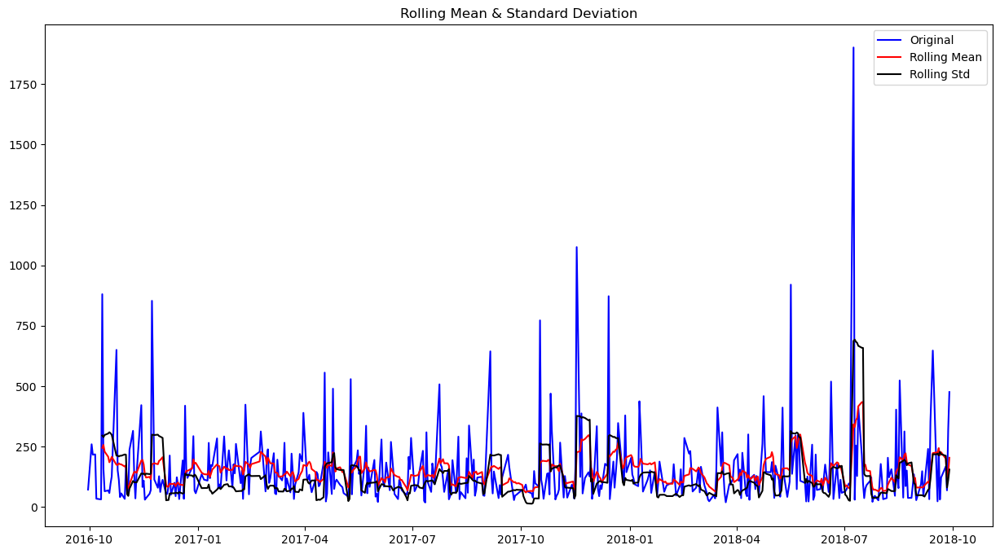

Results of Dickey-Fuller Test:
Test Statistic                 -22.130103
p-value                          0.000000
#Lags Used                       0.000000
Number of Observations Used    455.000000
Critical Value (1%)             -3.444804
Critical Value (5%)             -2.867913
Critical Value (10%)            -2.570165
dtype: float64 



In [310]:
test_stationarity(train_final['sales'])

In [ ]:
## Series is stationary at 5% Alpha as per Dicky Fuller

In [311]:
import itertools
p = q = range(0, 3)
d= range(0,1)
pdq = list(itertools.product(p, d, q))

model_pdq = [(x[0], x[1], x[2], 5) for x in list(itertools.product(p, d, q))]
print('Examples of parameter combinations for Model...')
print('Model: {}{}'.format(pdq[1], model_pdq[1]))
print('Model: {}{}'.format(pdq[1], model_pdq[2]))
print('Model: {}{}'.format(pdq[2], model_pdq[3]))
print('Model: {}{}'.format(pdq[2], model_pdq[4]))

Examples of parameter combinations for Model...
Model: (0, 0, 1)(0, 0, 1, 5)
Model: (0, 0, 1)(0, 0, 2, 5)
Model: (0, 0, 2)(1, 0, 0, 5)
Model: (0, 0, 2)(1, 0, 1, 5)


## ARIMA

In [312]:
# Creating an empty Dataframe with column names only
dfObj = pd.DataFrame(columns=['param', 'AIC'])
dfObj

,param,AIC


In [315]:
## Let's start by building ARIMA model -- Although the data set has some seasonality and hence ARIMA is 
## not the right option Reason for making the model is to understand how different the model could be if seasonality is not considered

from statsmodels.tsa.arima.model import ARIMA

for param in pdq:
            try:
                mod = ARIMA(train_final['sales'], order=param)
                results_Arima = mod.fit()
                print('ARIMA{} - AIC:{}'.format(param, results_Arima.aic))
                dfObj = dfObj.append({'param':param, 'AIC': results_Arima.aic}, ignore_index=True)

            except:
                continue

ARIMA(0, 0, 0) - AIC:5934.50329765311
ARIMA(0, 0, 1) - AIC:5935.627881007224
ARIMA(0, 0, 2) - AIC:5937.318148999854
ARIMA(1, 0, 0) - AIC:5935.66278212959
ARIMA(1, 0, 1) - AIC:5933.888949063961
ARIMA(1, 0, 2) - AIC:5935.8324361439245
ARIMA(2, 0, 0) - AIC:5937.403365444101
ARIMA(2, 0, 1) - AIC:5935.833577035963
ARIMA(2, 0, 2) - AIC:5936.999440319918


In [321]:
## ARIMA(1,0,1) has the lowest AIC
mod = ARIMA(train_final['sales'], order=(1,0,1))

results_Arima = mod.fit()

print(results_Arima.summary())

                               SARIMAX Results                                
Dep. Variable:                  sales   No. Observations:                  456
Model:                 ARIMA(1, 0, 1)   Log Likelihood               -2962.944
Date:                Wed, 03 Jul 2024   AIC                           5933.889
Time:                        13:02:20   BIC                           5950.379
Sample:                             0   HQIC                          5940.385
                                - 456                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        151.1853      6.779     22.303      0.000     137.899     164.472
ar.L1          0.8973      0.095      9.495      0.000       0.712       1.083
ma.L1         -0.9426      0.069    -13.670      0.0

In [323]:
final_hat_avg =test_final.copy()
pred_ARIMA = results_Arima.forecast(steps=len(test_final))
pred_ARIMA

456    127.957776
457    130.342453
458    132.482303
459    134.402464
460    136.125489
461    137.671617
462    139.059010
463    140.303965
464    141.421106
465    142.423553
466    143.323083
467    144.130262
468    144.854571
469    145.504518
470    146.087737
471    146.611079
472    147.080692
473    147.502092
474    147.880228
475    148.219542
476    148.524020
477    148.797238
478    149.042407
479    149.262404
480    149.459816
481    149.636960
482    149.795917
483    149.938555
484    150.066548
485    150.181401
486    150.284463
487    150.376943
488    150.459929
489    150.534395
490    150.601216
491    150.661177
492    150.714982
493    150.763262
494    150.806586
495    150.845463
496    150.880347
497    150.911651
498    150.939740
499    150.964946
500    150.987564
Name: predicted_mean, dtype: float64

In [326]:
from math import sqrt
from sklearn.metrics import  mean_squared_error
rmse = sqrt(mean_squared_error(test_final.sales,pred_ARIMA))
print(rmse)

105.3804072470621


In [327]:
resultsDf = pd.DataFrame({'Test RMSE': rmse}
                           ,index=['ARIMA(1, 0, 1)'])

resultsDf

,Test RMSE
"ARIMA(1, 0, 1)",105.380407


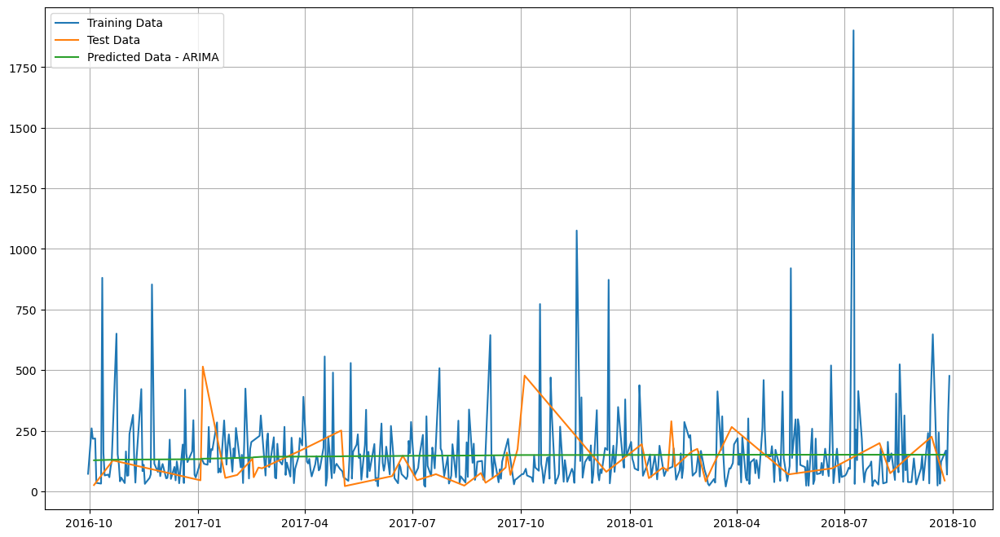

In [329]:
plt.plot(train_final,label='Training Data')
plt.plot(test_final,label='Test Data')
plt.plot(test_final.index,pred_ARIMA,label='Predicted Data - ARIMA')
plt.legend(loc='best')
plt.grid();

## SARIMA

In [330]:
### As the dataset has seasonality.. Let's build the model with SARIMA
dfObj2 = pd.DataFrame(columns=['param','seasonal', 'AIC'])
dfObj2

,param,seasonal,AIC


In [333]:
import statsmodels.api as sm
for param in pdq:
    for param_seasonal in model_pdq:
        mod = sm.tsa.statespace.SARIMAX(train_final['sales'],
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            
        results_SARIMA = mod.fit()
        print('SARIMA{}x{}7 - AIC:{}'.format(param, param_seasonal, results_SARIMA.aic))
        dfObj2.loc[len(dfObj2)] = {'param': param, 'seasonal': param_seasonal, 'AIC': results_SARIMA.aic}
        

SARIMA(0, 0, 0)x(0, 0, 0, 5)7 - AIC:6209.41133511619
SARIMA(0, 0, 0)x(0, 0, 1, 5)7 - AIC:6080.152859867767
SARIMA(0, 0, 0)x(0, 0, 2, 5)7 - AIC:5977.558241069402
SARIMA(0, 0, 0)x(1, 0, 0, 5)7 - AIC:6053.054179778491
SARIMA(0, 0, 0)x(1, 0, 1, 5)7 - AIC:5883.748064264224
SARIMA(0, 0, 0)x(1, 0, 2, 5)7 - AIC:5823.168484049911
SARIMA(0, 0, 0)x(2, 0, 0, 5)7 - AIC:5935.51616167121
SARIMA(0, 0, 0)x(2, 0, 1, 5)7 - AIC:5834.99282569347
SARIMA(0, 0, 0)x(2, 0, 2, 5)7 - AIC:5815.498026597606
SARIMA(0, 0, 1)x(0, 0, 0, 5)7 - AIC:6137.024075038525
SARIMA(0, 0, 1)x(0, 0, 1, 5)7 - AIC:6021.049787259159
SARIMA(0, 0, 1)x(0, 0, 2, 5)7 - AIC:5947.812631909894
SARIMA(0, 0, 1)x(1, 0, 0, 5)7 - AIC:6044.021563959483
SARIMA(0, 0, 1)x(1, 0, 1, 5)7 - AIC:5871.321019510957
SARIMA(0, 0, 1)x(1, 0, 2, 5)7 - AIC:5790.971844749514
SARIMA(0, 0, 1)x(2, 0, 0, 5)7 - AIC:5936.076355537214
SARIMA(0, 0, 1)x(2, 0, 1, 5)7 - AIC:5835.954943442323
SARIMA(0, 0, 1)x(2, 0, 2, 5)7 - AIC:5792.317742381577
SARIMA(0, 0, 2)x(0, 0, 0, 5)7 -

In [334]:
dfObj2.sort_values(by=['AIC'])

,param,seasonal,AIC
50,"(1, 0, 2)","(1, 0, 2, 5)",5771.421264
47,"(1, 0, 2)","(0, 0, 2, 5)",5772.885373
74,"(2, 0, 2)","(0, 0, 2, 5)",5772.908122
80,"(2, 0, 2)","(2, 0, 2, 5)",5775.721439
53,"(1, 0, 2)","(2, 0, 2, 5)",5776.270440
...,...,...,...
1,"(0, 0, 0)","(0, 0, 1, 5)",6080.152860
18,"(0, 0, 2)","(0, 0, 0, 5)",6090.910331
27,"(1, 0, 0)","(0, 0, 0, 5)",6109.916517
9,"(0, 0, 1)","(0, 0, 0, 5)",6137.024075


In [335]:
## SARIMA(1,0,2)(1,0,2,5) - AIC:5771.421264
mod = sm.tsa.statespace.SARIMAX(train_final['sales'],
                                order=(1,0,2),
                                seasonal_order=(1,0,2,5),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results = mod.fit()
print(results.summary())

                                     SARIMAX Results                                     
Dep. Variable:                             sales   No. Observations:                  456
Model:             SARIMAX(1, 0, 2)x(1, 0, 2, 5)   Log Likelihood               -2878.711
Date:                           Wed, 03 Jul 2024   AIC                           5771.421
Time:                                   13:11:31   BIC                           5800.076
Sample:                                        0   HQIC                          5782.723
                                           - 456                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0003      0.001   1315.747      0.000       0.999       1.002
ma.L1         -1.0380      0.106     -9.816

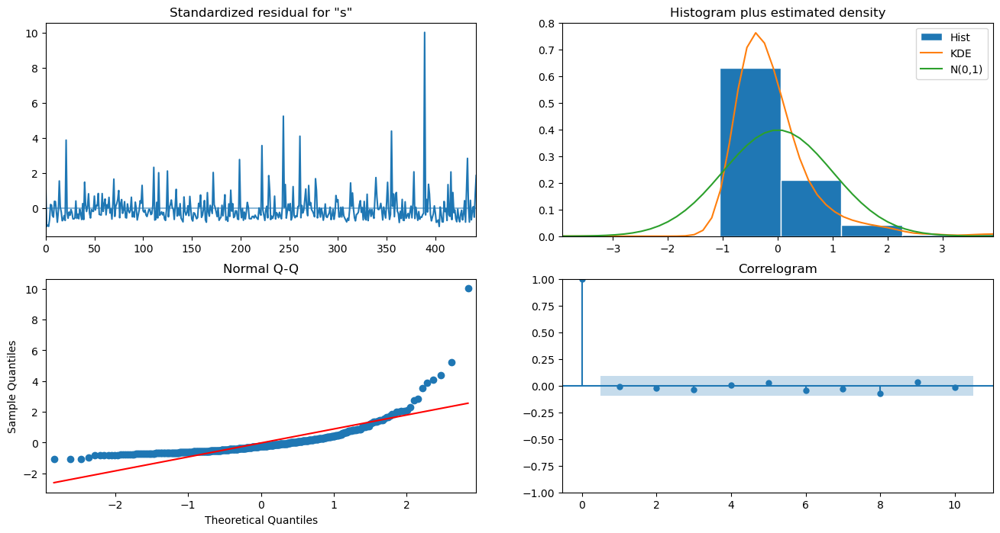

In [336]:
results.plot_diagnostics(figsize=(16, 8))
plt.show()

In [337]:
final_hat_avg =test_final.copy()
pred_SARIMA = results.get_forecast(steps=len(test_final))
pred_SARIMA.predicted_mean

456    127.506697
457    167.717783
458    177.205822
459    144.972944
460    157.728785
461    181.079741
462    158.384557
463    159.283574
464    165.022002
465    144.113809
466    151.010967
467    166.458582
468    165.905665
469    161.878543
470    176.981183
471    172.122265
472    161.124965
473    161.614551
474    164.598315
475    153.848765
476    157.429741
477    165.417520
478    165.158841
479    163.109611
480    170.919620
481    168.441710
482    162.800167
483    163.078825
484    164.642957
485    159.129128
486    161.001073
487    165.144236
488    165.037291
489    164.007528
490    168.059097
491    166.808415
492    163.927246
493    164.097280
494    164.929841
495    162.114520
496    163.105741
497    165.267526
498    165.238869
499    164.734613
500    166.849218
Name: predicted_mean, dtype: float64

In [338]:
from math import sqrt
from sklearn.metrics import mean_squared_error
rmse = sqrt(mean_squared_error(test_final.sales,pred_SARIMA.predicted_mean))
print(rmse)

110.44443273372131


In [340]:
resultsDf_temp = pd.DataFrame({'Test RMSE': rmse}
                           ,index=['SARIMA(1, 0, 2)(1, 0, 2,5)'])

resultsDf = pd.concat([resultsDf, resultsDf_temp])
resultsDf

,Test RMSE
"ARIMA(1, 0, 1)",105.380407
"SARIMA(1, 0, 2)(1, 0, 2,5)",110.444433


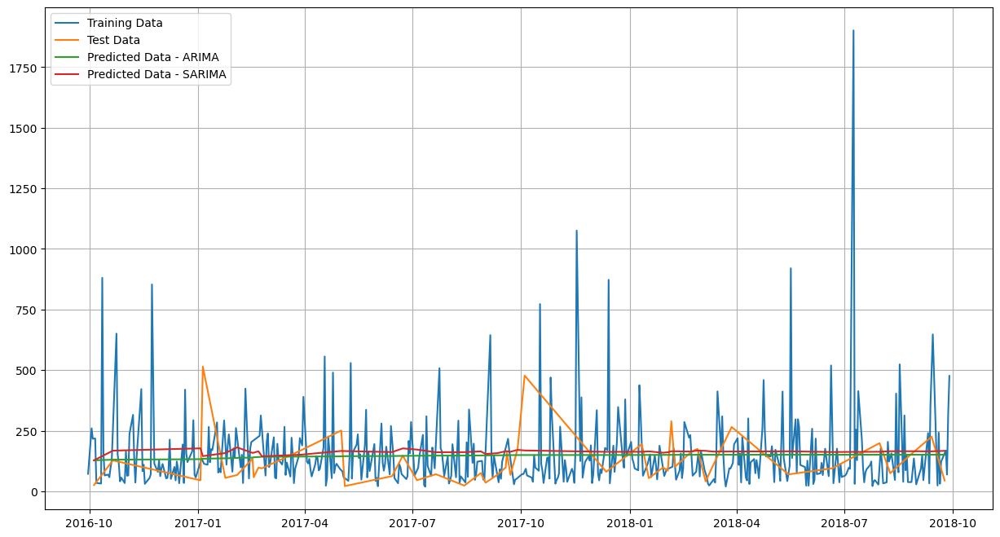

In [343]:
plt.plot(train_final,label='Training Data')
plt.plot(test_final,label='Test Data')
plt.plot(test_final.index,pred_ARIMA,label='Predicted Data - ARIMA')
plt.plot(test_final.index,pred_SARIMA.predicted_mean,label='Predicted Data - SARIMA')
plt.legend(loc='best')
plt.grid();

## SARIMAX

In [344]:
### Let's create exogeneous variables

ex_train=train[['product_category_name_english','review_score']]
ex_test=test[['product_category_name_english','review_score']]
ex_train.head()

,product_category_name_english,review_score
Time_Stamp,,
2016-09-30,20,5.0
2016-10-03,60,4.0
2016-10-04,39,5.0
2016-10-06,42,5.0
2016-10-07,49,4.0


In [345]:
dfObj3 = pd.DataFrame(columns=['param','seasonal', 'AIC'])
dfObj3

,param,seasonal,AIC


In [350]:
## Let's first use SARIMAX with exogenous variable 
import statsmodels.api as sm
for param in pdq:
    for param_seasonal in model_pdq:
        mod = sm.tsa.statespace.SARIMAX(train_final['sales'],exog=ex_train,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            
        results_SARIMAX = mod.fit()
        print('SARIMA{}{} - AIC:{}'.format(param, param_seasonal, results_SARIMAX.aic))
        dfObj3.loc[len(dfObj2)] = {'param': param, 'seasonal': param_seasonal, 'AIC': results_SARIMA.aic}

SARIMA(0, 0, 0)(0, 0, 0, 5) - AIC:5965.82549759438
SARIMA(0, 0, 0)(0, 0, 1, 5) - AIC:5905.399590449891
SARIMA(0, 0, 0)(0, 0, 2, 5) - AIC:5827.614678920823
SARIMA(0, 0, 0)(1, 0, 0, 5) - AIC:5918.2748086913125
SARIMA(0, 0, 0)(1, 0, 1, 5) - AIC:5902.395756407312
SARIMA(0, 0, 0)(1, 0, 2, 5) - AIC:5829.2476798443395
SARIMA(0, 0, 0)(2, 0, 0, 5) - AIC:5839.921605265758
SARIMA(0, 0, 0)(2, 0, 1, 5) - AIC:5841.750435946914
SARIMA(0, 0, 0)(2, 0, 2, 5) - AIC:5831.2282175981545
SARIMA(0, 0, 1)(0, 0, 0, 5) - AIC:5955.193802398705
SARIMA(0, 0, 1)(0, 0, 1, 5) - AIC:5877.045348200735
SARIMA(0, 0, 1)(0, 0, 2, 5) - AIC:5817.353833574101
SARIMA(0, 0, 1)(1, 0, 0, 5) - AIC:5920.105314111146
SARIMA(0, 0, 1)(1, 0, 1, 5) - AIC:5879.044967790197
SARIMA(0, 0, 1)(1, 0, 2, 5) - AIC:5814.942621699163
SARIMA(0, 0, 1)(2, 0, 0, 5) - AIC:5841.794014280352
SARIMA(0, 0, 1)(2, 0, 1, 5) - AIC:5843.6015459739865
SARIMA(0, 0, 1)(2, 0, 2, 5) - AIC:5816.903449619448
SARIMA(0, 0, 2)(0, 0, 0, 5) - AIC:5944.1932573879085
SARIMA(0

In [351]:
dfObj3.sort_values(by=['AIC'])

,param,seasonal,AIC
162,"(2, 0, 2)","(2, 0, 2, 5)",5775.721439


In [352]:
## SARIMAX(2, 0, 2)(2, 0, 2, 5)
mod = sm.tsa.statespace.SARIMAX(train_final['sales'],exog=ex_train,
                                order=(2 ,0,2),
                                seasonal_order=(2,0,2,5),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results = mod.fit()
print(results.summary())

                                     SARIMAX Results                                     
Dep. Variable:                             sales   No. Observations:                  456
Model:             SARIMAX(2, 0, 2)x(2, 0, 2, 5)   Log Likelihood               -2892.923
Date:                           Wed, 03 Jul 2024   AIC                           5807.845
Time:                                   13:23:56   BIC                           5852.875
Sample:                                        0   HQIC                          5825.605
                                           - 456                                         
Covariance Type:                             opg                                         
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
product_category_name_english     0.9075      0.407      2.227      0.026       0.10

In [353]:
pred_SARIMAX = results.get_forecast(steps=len(test),exog=ex_test)
pred_SARIMAX.predicted_mean

456    110.260531
457    178.443679
458    112.298797
459    117.594893
460     70.223040
461    175.556655
462    157.033909
463     35.352751
464    172.893662
465    119.833022
466     47.656064
467    201.609023
468    190.683018
469    139.130756
470     99.085667
471    174.606849
472    108.579433
473     83.325893
474    143.869300
475    155.779868
476    108.890228
477     88.499907
478    168.647575
479    153.585015
480    126.635449
481     92.472368
482    182.968610
483    191.194774
484    191.573420
485    135.956069
486    131.571063
487     93.407089
488    172.921850
489    112.279956
490    150.623695
491    184.842942
492    170.384342
493    134.571496
494    135.939946
495    183.314054
496     81.390356
497     86.360111
498    109.459782
499    164.642443
500    170.612154
Name: predicted_mean, dtype: float64

In [354]:
rmse = sqrt(mean_squared_error(test_final.sales,pred_SARIMAX.predicted_mean))
print(rmse)

116.92721755306175


In [355]:
resultsDf_temp = pd.DataFrame({'Test RMSE': rmse}
                           ,index=['SARIMAX(2, 0, 2)(2, 0, 2)5'])

resultsDf = pd.concat([resultsDf, resultsDf_temp])
resultsDf

,Test RMSE
"ARIMA(1, 0, 1)",105.380407
"SARIMA(1, 0, 2)(1, 0, 2,5)",110.444433
"SARIMAX(2, 0, 2)(2, 0, 2)5",116.927218


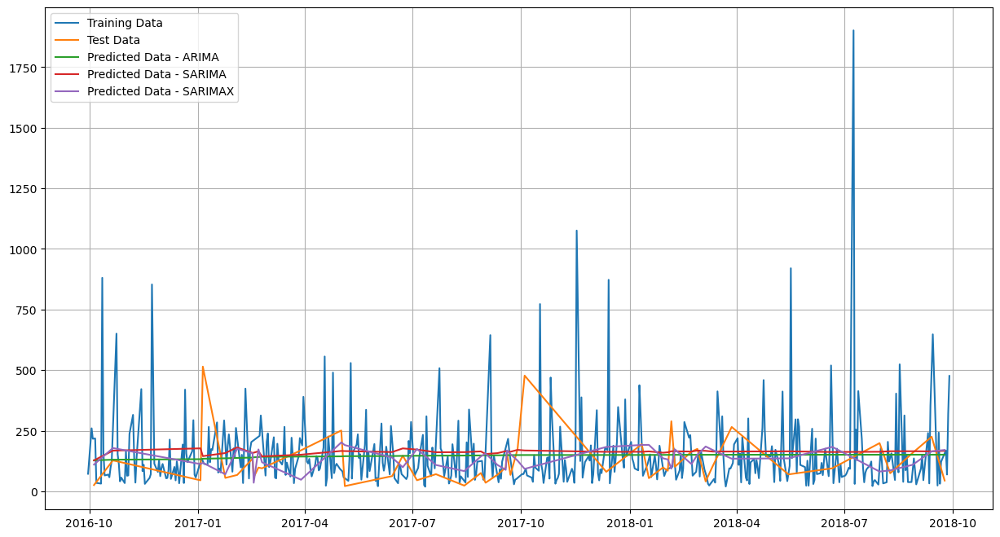

In [356]:
plt.plot(train_final,label='Training Data')
plt.plot(test_final,label='Test Data')
plt.plot(test_final.index,pred_ARIMA,label='Predicted Data - ARIMA')
plt.plot(test_final.index,pred_SARIMA.predicted_mean,label='Predicted Data - SARIMA')
plt.plot(test_final.index,pred_SARIMAX.predicted_mean,label='Predicted Data - SARIMAX')
plt.legend(loc='best')
plt.grid();

In [357]:
# Build Time Series models using the Prophet Library.


In [358]:
df_prophet = pd.DataFrame()
df_prophet['ds'] = pd.to_datetime(df['order_purchase_timestamp'])
df_prophet['y'] = df['sales']
df_prophet['product_category_name_english']= df['product_category_name_english']
df_prophet['review_score']=df['review_score']
df_prophet.head()

,ds,y,product_category_name_english,review_score
0,2017-09-13,72.19,20,5.0
1,2017-04-26,259.83,60,4.0
2,2018-01-14,216.87,39,5.0
3,2018-08-08,25.78,59,4.0
4,2017-02-04,218.04,42,5.0


13:28:56 - cmdstanpy - INFO - Chain [1] start processing
13:28:56 - cmdstanpy - INFO - Chain [1] done processing


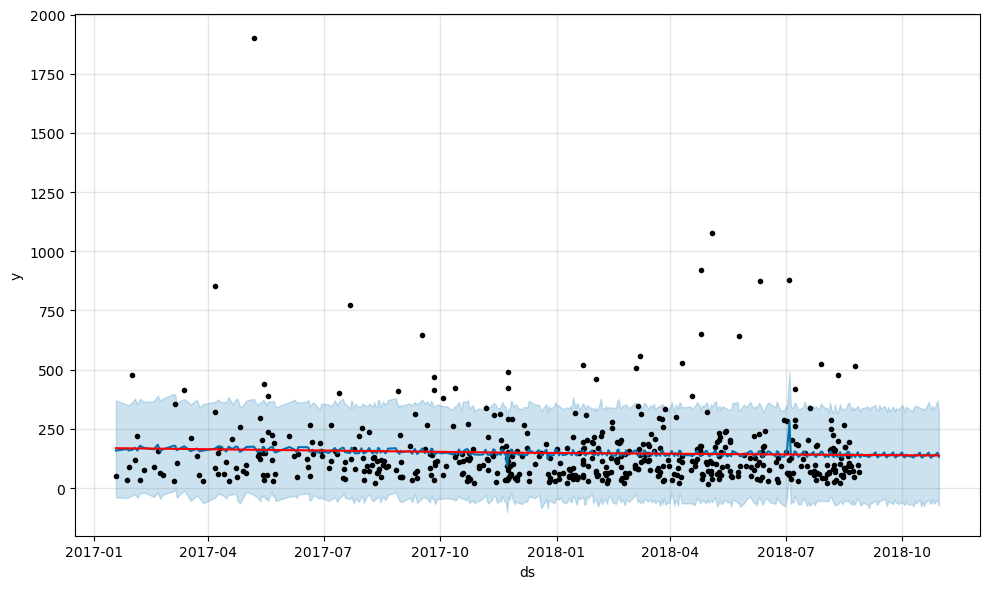

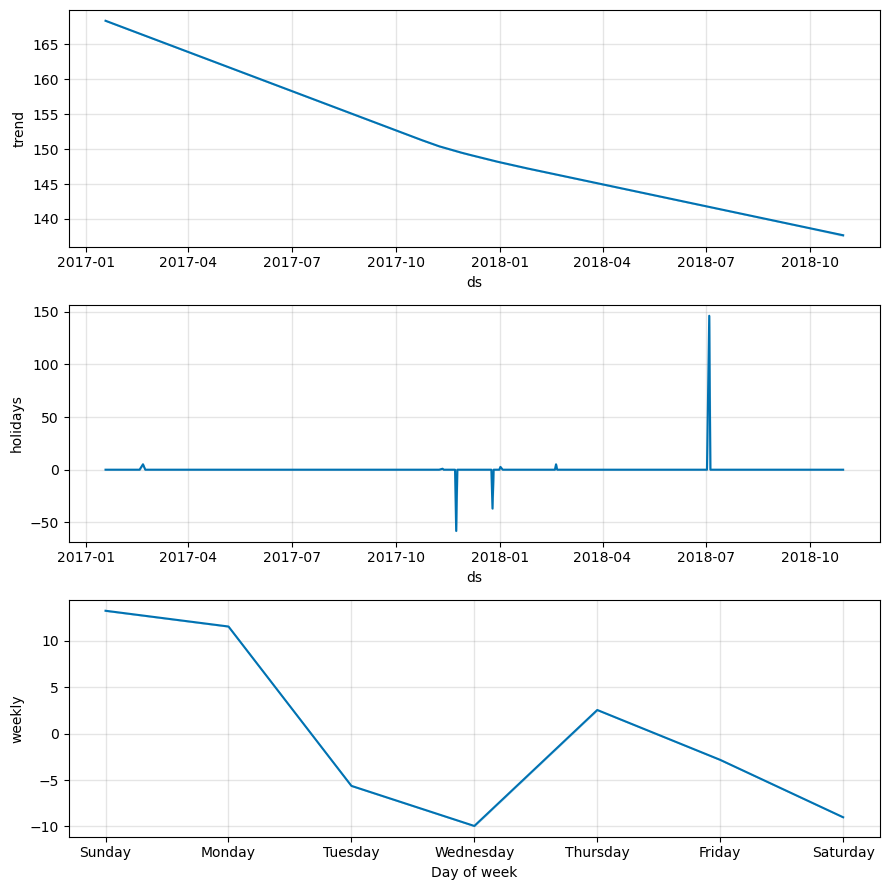

In [359]:
prophet=Prophet(seasonality_mode='additive',weekly_seasonality=True)
prophet.add_country_holidays(country_name='US')
prophet.fit(df_prophet[df_prophet['ds'] <= pd.to_datetime('2018-09-30')])
future = prophet.make_future_dataframe(periods=43, freq=us_bd)
forecast = prophet.predict(future)
fig = prophet.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), prophet, forecast)
plt.show()
fig2 = prophet.plot_components(forecast)
plt.show()

In [360]:
import holidays
for date, name in sorted(holidays.US(state='NY', years=2018).items()):
   print(date, name) 

2018-01-01 New Year's Day
2018-01-15 Martin Luther King Jr. Day
2018-02-12 Lincoln's Birthday
2018-02-15 Susan B. Anthony Day
2018-02-19 Washington's Birthday
2018-05-28 Memorial Day
2018-07-04 Independence Day
2018-09-03 Labor Day
2018-10-08 Columbus Day
2018-11-06 Election Day
2018-11-11 Veterans Day
2018-11-12 Veterans Day (observed)
2018-11-22 Thanksgiving
2018-12-25 Christmas Day


In [361]:
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Christmas Day,Christmas Day_lower,Christmas Day_upper,Columbus Day,Columbus Day_lower,Columbus Day_upper,Independence Day,Independence Day_lower,Independence Day_upper,Labor Day,Labor Day_lower,Labor Day_upper,Martin Luther King Jr. Day,Martin Luther King Jr. Day_lower,Martin Luther King Jr. Day_upper,Memorial Day,Memorial Day_lower,Memorial Day_upper,New Year's Day,New Year's Day_lower,New Year's Day_upper,New Year's Day (observed),New Year's Day (observed)_lower,New Year's Day (observed)_upper,Thanksgiving,Thanksgiving_lower,Thanksgiving_upper,Veterans Day,Veterans Day_lower,Veterans Day_upper,Veterans Day (observed),Veterans Day (observed)_lower,Veterans Day (observed)_upper,Washington's Birthday,Washington's Birthday_lower,Washington's Birthday_upper,additive_terms,additive_terms_lower,additive_terms_upper,holidays,holidays_lower,holidays_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2017-01-18,168.368104,-39.591781,371.192093,168.368104,168.368104,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-9.942175,-9.942175,-9.942175,0.0,0.0,0.0,-9.942175,-9.942175,-9.942175,0.0,0.0,0.0,158.425929
1,2017-01-27,167.816177,-42.326992,351.322434,167.816177,167.816177,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.814854,-2.814854,-2.814854,0.0,0.0,0.0,-2.814854,-2.814854,-2.814854,0.0,0.0,0.0,165.001324
2,2017-01-28,167.754852,-38.130365,348.871684,167.754852,167.754852,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-9.002552,-9.002552,-9.002552,0.0,0.0,0.0,-9.002552,-9.002552,-9.002552,0.0,0.0,0.0,158.752300
3,2017-01-31,167.570877,-31.182696,362.223606,167.570877,167.570877,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-5.619460,-5.619460,-5.619460,0.0,0.0,0.0,-5.619460,-5.619460,-5.619460,0.0,0.0,0.0,161.951417
4,2017-02-02,167.448227,-25.394545,378.585650,167.448227,167.448227,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.560650,2.560650,2.560650,0.0,0.0,0.0,2.560650,2.560650,2.560650,0.0,0.0,0.0,170.008877
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
366,2018-10-24,137.878837,-64.614439,334.073846,137.793342,137.964022,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-9.942175,-9.942175,-9.942175,0.0,0.0,0.0,-9.942175,-9.942175,-9.942175,0.0,0.0,0.0,127.936662
367,2018-10-25,137.844461,-45.385153,347.913853,137.756473,137.933011,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.560650,2.560650,2.560650,0.0,0.0,0.0,2.560650,2.560650,2.560650,0.0,0.0,0.0,140.405111
368,2018-10-26,137.810085,-66.877654,328.836263,137.717158,137.901927,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.814854,-2.814854,-2.814854,0.0,0.0,0.0,-2.814854,-2.814854,-2.814854,0.0,0.0,0.0,134.995232
369,2018-10-29,137.706958,-50.143927,370.751092,137.609287,137.802013,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.560543,11.560543,11.560543,0.0,0.0,0.0,11.560543,11.560543,11.560543,0.0,0.0,0.

In [363]:
rmse = sqrt(mean_squared_error(test_final['sales'],forecast.tail(45)['yhat']))
print(rmse)

104.20046628442587


In [364]:
resultsDf_temp = pd.DataFrame({'Test RMSE': rmse}
                           ,index=['Prophet'])

resultsDf = pd.concat([resultsDf, resultsDf_temp])
resultsDf

,Test RMSE
"ARIMA(1, 0, 1)",105.380407
"SARIMA(1, 0, 2)(1, 0, 2,5)",110.444433
"SARIMAX(2, 0, 2)(2, 0, 2)5",116.927218
Prophet,104.200466


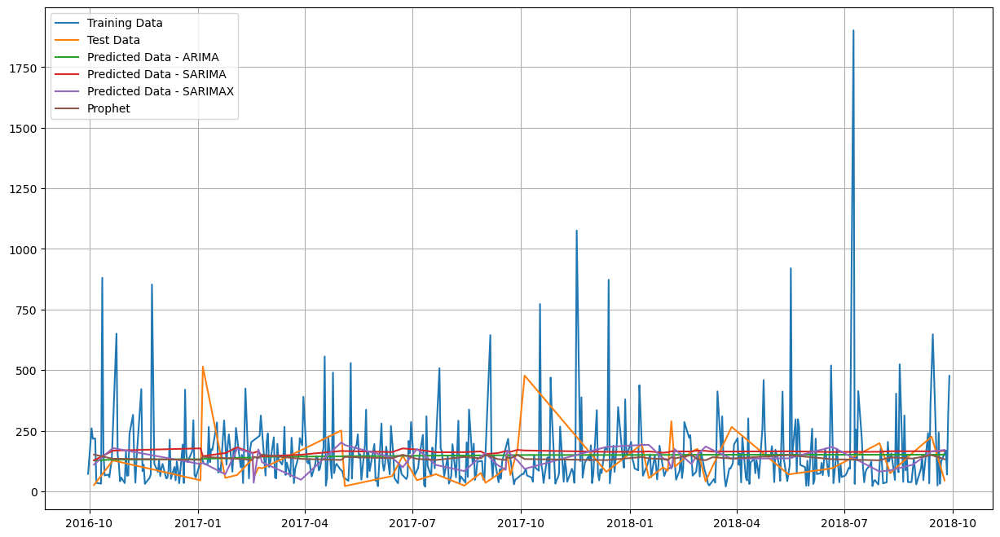

In [365]:
plt.plot(train_final,label='Training Data')
plt.plot(test_final,label='Test Data')
plt.plot(test_final.index,pred_ARIMA,label='Predicted Data - ARIMA')
plt.plot(test_final.index,pred_SARIMA.predicted_mean,label='Predicted Data - SARIMA')
plt.plot(test_final.index,pred_SARIMAX.predicted_mean,label='Predicted Data - SARIMAX')
plt.plot(test_final.index,forecast.tail(45)['yhat'],label='Prophet')
plt.legend(loc='best')
plt.grid();

13:33:37 - cmdstanpy - INFO - Chain [1] start processing
13:33:37 - cmdstanpy - INFO - Chain [1] done processing


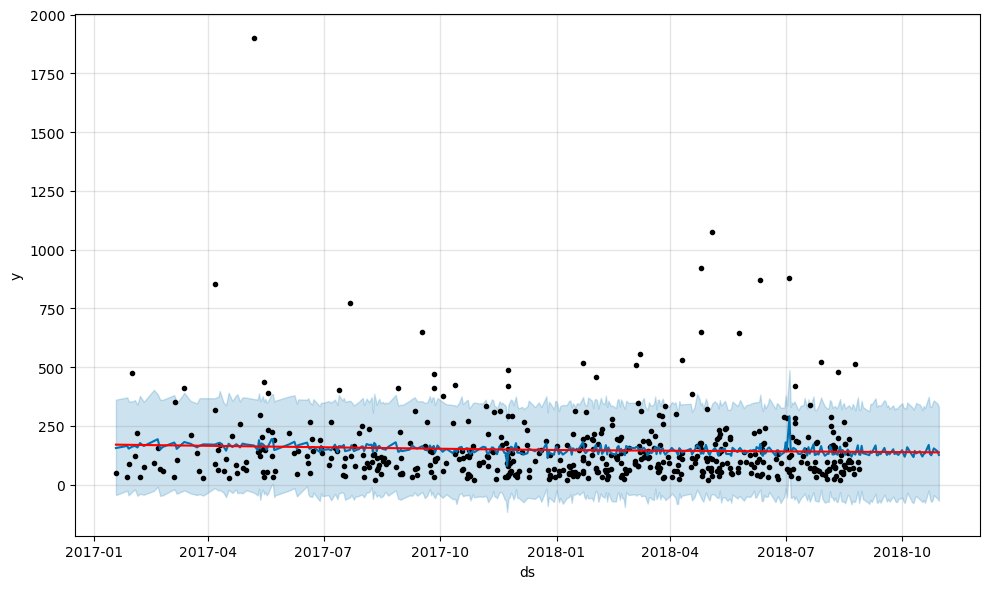

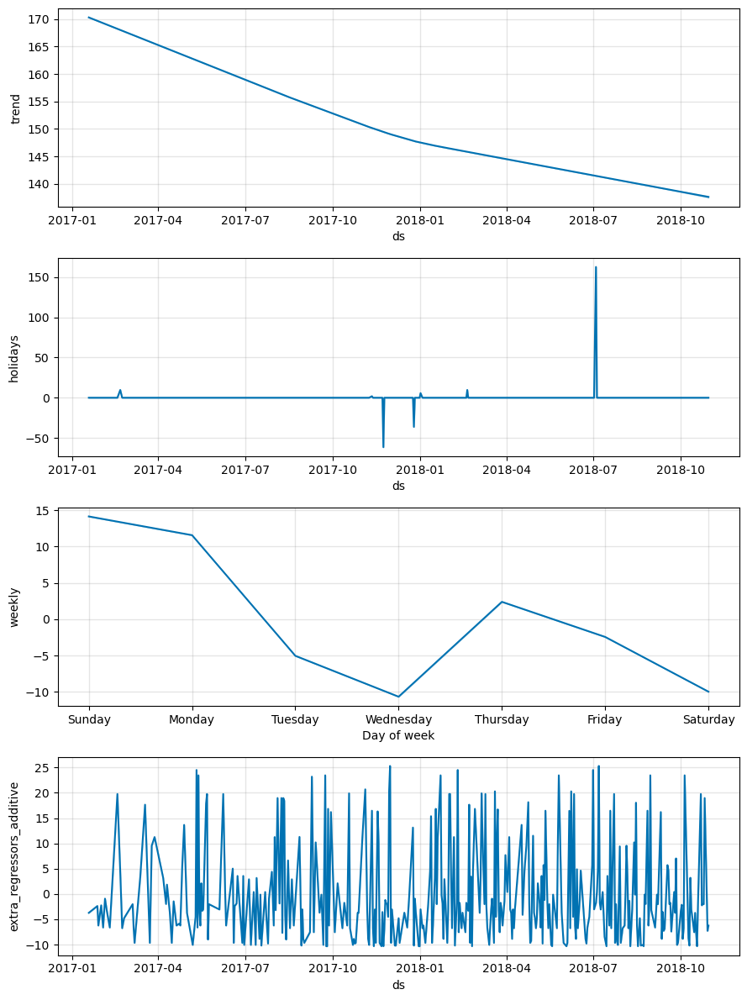

In [366]:
prophet=Prophet()
prophet.add_country_holidays(country_name='US')
prophet.add_regressor('product_category_name_english')
prophet.add_regressor('review_score')
prophet.fit(df_prophet[df_prophet['ds'] < pd.to_datetime('2018-09-30')])
future = prophet.make_future_dataframe(periods=43, freq=us_bd)
future['product_category_name_english']= df_prophet['product_category_name_english']
future['review_score']= df_prophet['review_score']
forecast = prophet.predict(future)
fig = prophet.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), prophet, forecast)
plt.show()
fig2 = prophet.plot_components(forecast)
plt.show()

In [367]:
rmse = sqrt(mean_squared_error(test_final['sales'],forecast.tail(45)['yhat']))
print(rmse)

103.23513325070178


In [368]:
resultsDf_temp = pd.DataFrame({'Test RMSE': rmse}
                           ,index=['Prophet - with exog variables'])

resultsDf = pd.concat([resultsDf, resultsDf_temp])
resultsDf

,Test RMSE
"ARIMA(1, 0, 1)",105.380407
"SARIMA(1, 0, 2)(1, 0, 2,5)",110.444433
"SARIMAX(2, 0, 2)(2, 0, 2)5",116.927218
Prophet,104.200466
Prophet - with exog variables,103.235133


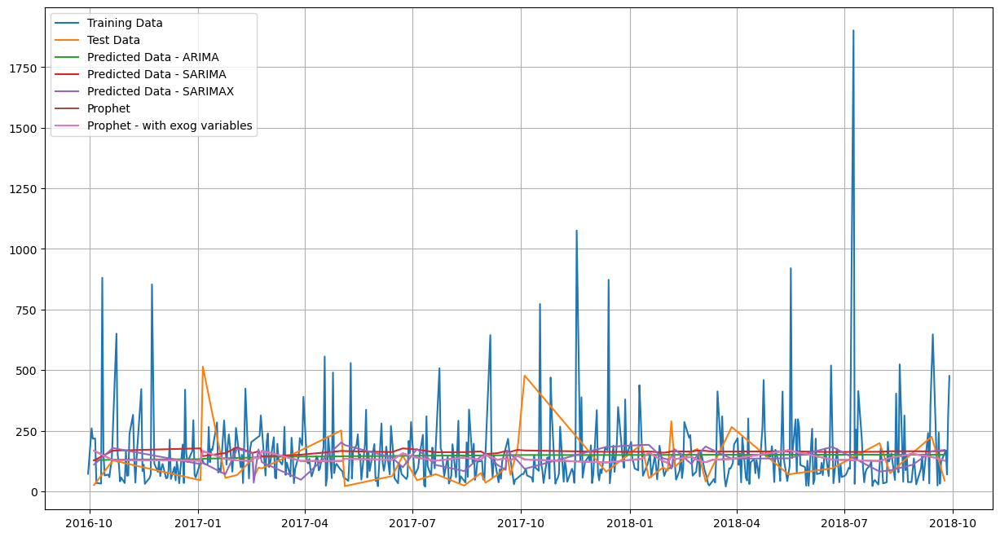

In [369]:
plt.plot(train_final,label='Training Data')
plt.plot(test_final,label='Test Data')
plt.plot(test_final.index,pred_ARIMA,label='Predicted Data - ARIMA')
plt.plot(test_final.index,pred_SARIMA.predicted_mean,label='Predicted Data - SARIMA')
plt.plot(test_final.index,pred_SARIMAX.predicted_mean,label='Predicted Data - SARIMAX')
plt.plot(test_final.index,forecast.tail(45)['yhat'],label='Prophet')
plt.plot(test_final.index,forecast.tail(45)['yhat'],label='Prophet - with exog variables')
plt.legend(loc='best')
plt.grid();

Adjusting trend by changepoint_prior_scale: Prophet allow you to adjust the trend in case there is an overfit or underfit. changepoint_prior_scale helps adjust the strength of the trend. Default value for changepoint_prior_scale is 0.05. Decrease the value to make the trend less flexible. Increase the value of changepoint_prior_scale to make the trend more flexible. Increasing the changepoint_prior_scale to 0.08 to make the trend flexible

13:36:37 - cmdstanpy - INFO - Chain [1] start processing
13:36:37 - cmdstanpy - INFO - Chain [1] done processing


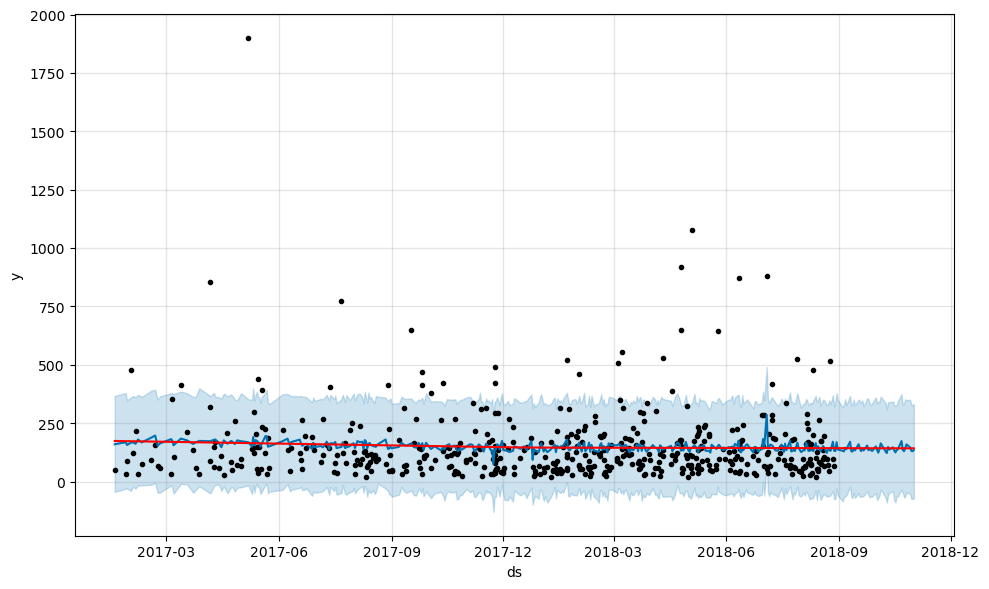

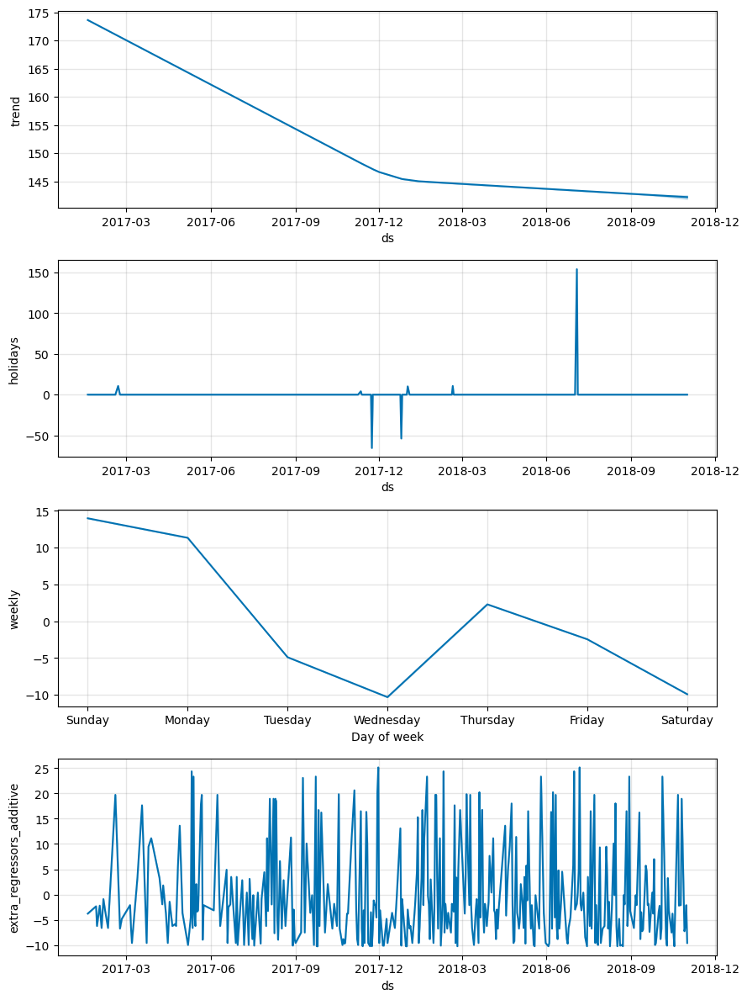

In [370]:
prophet=Prophet(changepoint_prior_scale=.08,
                  )
prophet.add_country_holidays(country_name='US')
prophet.add_regressor('product_category_name_english')
prophet.add_regressor('review_score')
prophet.fit(df_prophet[df_prophet['ds'] < pd.to_datetime('2018-09-30')])
future = prophet.make_future_dataframe(periods=45, freq=us_bd)
future['product_category_name_english']= df_prophet['product_category_name_english']
future['review_score']= df_prophet['review_score']
forecast = prophet.predict(future)
fig = prophet.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), prophet, forecast)
plt.show()
fig2 = prophet.plot_components(forecast)
plt.show()

In [371]:
rmse = sqrt(mean_squared_error(test_final['sales'],forecast.tail(45)['yhat']))
print(rmse)

106.91759591084542


In [372]:
resultsDf_temp = pd.DataFrame({'Test RMSE': rmse}
                           ,index=['Prophet - with exog variables_2.0'])

resultsDf = pd.concat([resultsDf, resultsDf_temp])
resultsDf

,Test RMSE
"ARIMA(1, 0, 1)",105.380407
"SARIMA(1, 0, 2)(1, 0, 2,5)",110.444433
"SARIMAX(2, 0, 2)(2, 0, 2)5",116.927218
Prophet,104.200466
Prophet - with exog variables,103.235133
Prophet - with exog variables_2.0,106.917596


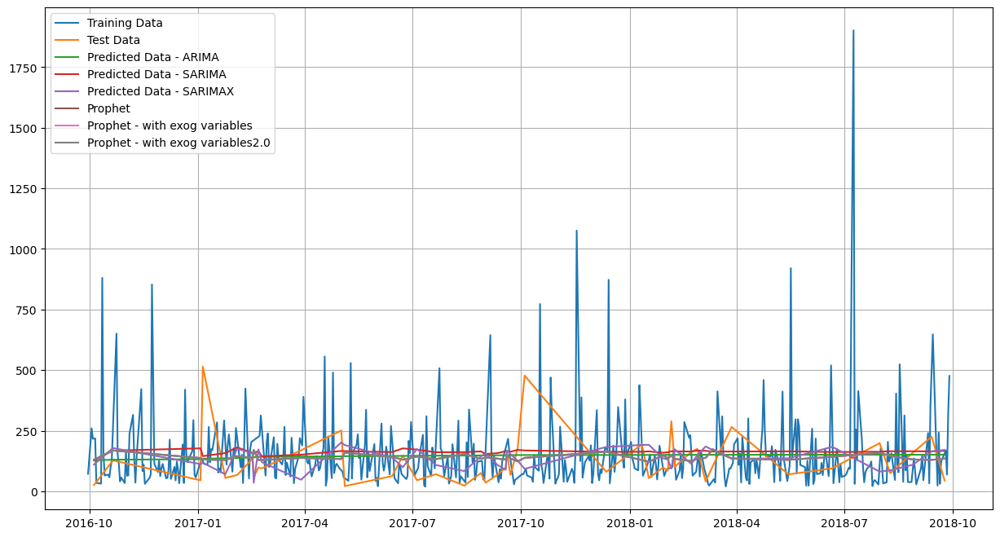

In [373]:
plt.plot(train_final,label='Training Data')
plt.plot(test_final,label='Test Data')
plt.plot(test_final.index,pred_ARIMA,label='Predicted Data - ARIMA')
plt.plot(test_final.index,pred_SARIMA.predicted_mean,label='Predicted Data - SARIMA')
plt.plot(test_final.index,pred_SARIMAX.predicted_mean,label='Predicted Data - SARIMAX')
plt.plot(test_final.index,forecast.tail(45)['yhat'],label='Prophet')
plt.plot(test_final.index,forecast.tail(45)['yhat'],label='Prophet - with exog variables')
plt.plot(test_final.index,forecast.tail(45)['yhat'],label='Prophet - with exog variables2.0')
plt.legend(loc='best')
plt.grid()

## For our dataset Prophet - with exog variables is giving least rmse of 103.235133, hence, the best model for forecasting in our case